# IMPORT

In [1]:
#basics
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator

#sklearn
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
#from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
#from sklearn.preprocessing import PolynomialFeatures
#from sklearn import set_config
from sklearn.metrics import root_mean_squared_error, mean_absolute_error, r2_score
from sklearn.base import clone
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from lightgbm import LGBMRegressor

# feature engine
from feature_engine.timeseries.forecasting import LagFeatures
from feature_engine.timeseries.forecasting import WindowFeatures
from feature_engine.timeseries.forecasting import ExpandingWindowFeatures
from feature_engine.datetime import DatetimeFeatures
from feature_engine.selection import DropFeatures
from feature_engine.imputation import DropMissingData


# sktime
from sktime.transformations.series.time_since import TimeSince


# statsmodels
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import ccf
from statsmodels.tsa.seasonal import STL

# optuna
import optuna


In [2]:
import sys
sys.path.append("src")   # VERY IMPORTANT

In [190]:
# helper function imports & Class
from basic_helper_functions import seperate_target_plot
from basic_helper_functions import seperate_predictor_plot
from basic_helper_functions import plot_clean_plot

from Feature_Engineering import GOR_WCUT_Transformer
from Feature_Engineering import plot_ccf,lag_plot 
from Feature_Engineering import LassoSelectedLagFeatureAdder
from Feature_Engineering import TrendFeatureAdder
from Feature_Engineering import AddSelectedCalendarFourierFeatures
from Feature_Engineering import AddSpecificLag1Features
from Feature_Engineering import RollingSlopeFeatures

from Machine_Learning import plot_train_val_predictions_time
from Machine_Learning import plot_train_val_actual_vs_predicted_crossplot
from Machine_Learning import create_model_results_table
from Machine_Learning import add_model_result
from Machine_Learning import style_model_results_table
from Machine_Learning import plot_single_target_multiphase_train_val_diagnostics
#from Machine_Learning import tune_single_target_random_forest_optuna
#from Machine_Learning import tune_single_target_gradient_boosting_optuna

from Machine_Learning_Multi import plot_multi_phase_train_walkforward_val_diagnostics
from Machine_Learning_Multi import plot_multi_phase_train_val_diagnostics

# Load data

In [4]:
# load the data
df = pd.read_csv('processed_inputs/df2.csv',index_col='DATEPRD', parse_dates=True)
#explicitly sets the time frequency of  DatetimeIndex to "Daily" (D).
df.asfreq('D')
# drop ,'GOR_MSCF/STB', 'WCUT. I calculated this before in my helper function. But i need to calculate as part of a pipeline. so i will need to drop it
df = df.drop(columns=['GOR_MSCF_STB', 'WCUT'])

In [5]:
# Split data

In [6]:
(df.columns,len(df.columns))

(Index(['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
        'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
        'NPD_FACILITY_NAME', 'ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
        'AVG_CHOKE_UOM', 'FLOW_KIND', 'WELL_TYPE', 'AVG_DOWNHOLE_PRESSURE_PSI',
        'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
        'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
        'BORE_WI_VOL_STB_D', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
        'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
       dtype='object'),
 23)

In [7]:
#target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
#predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       #'DP_CHOKE_SIZE_PSI',
      #'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       #'AVG_DP_TUBING_PSI', 'AVG_ANNULUS_PRESS_PSI', 'AVG_WHP_P_PSI',
       #'BORE_WI_VOL_STB_D', 'AVG_WHT_P']
#predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']
#starting_total_features=len(target_col)+len(predictor_num_col)+len(predictor_cat_cols)
#starting_total_features

# Preprocessing

In the preprocessing I am going to:
1. Remove all columns that have zeros or nan greater than 50% of the data
2. Make negative values zero
3. Then if any columns have nan, prints the column and the nan and then does linear interpolation

how many nans before cleaning
ON_STREAM_HRS                 0
AVG_CHOKE_SIZE_P              0
AVG_DOWNHOLE_PRESSURE_PSI     0
AVG_DOWNHOLE_TEMPERATURE_F    0
AVG_DP_TUBING_PSI             0
AVG_ANNULUS_PRESS_PSI         0
DP_CHOKE_SIZE_PSI             0
AVG_WHP_P_PSI                 0
AVG_WHT_P                     0
BORE_OIL_VOL_STB_D            0
BORE_GAS_VOL_MSCF_D           0
BORE_WAT_VOL_STB_D            0
dtype: int64
Plot before cleaning


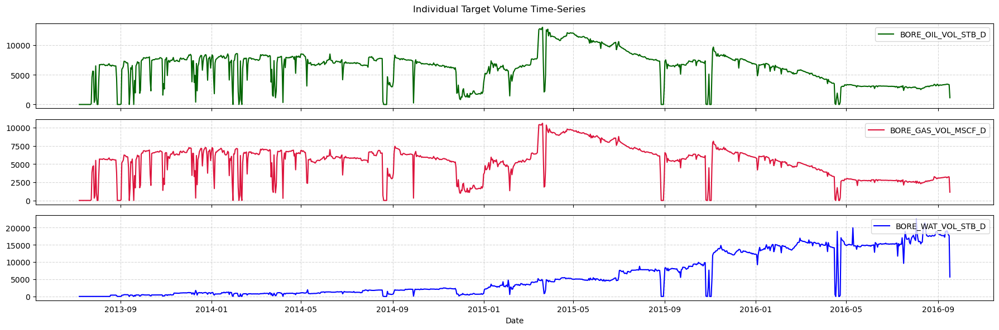

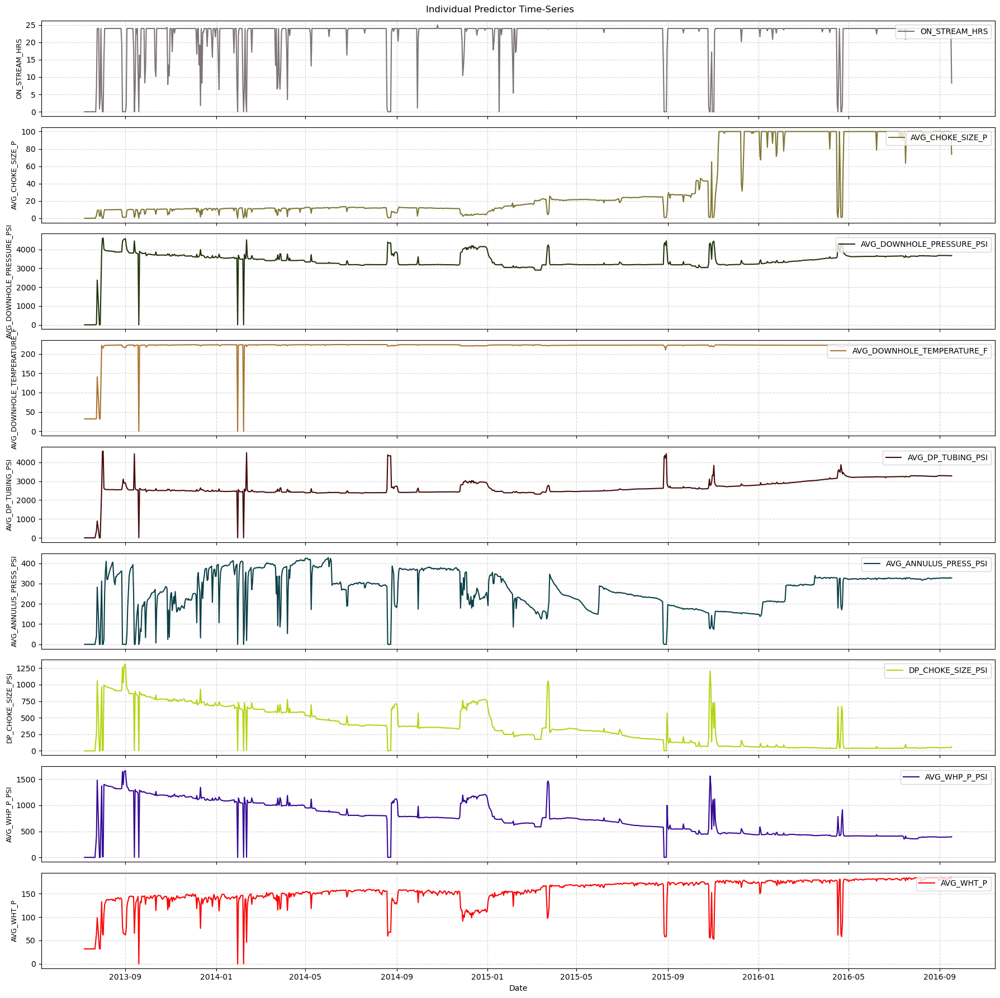

Cleaning data
The length of the dataframe before cleaning is 1168
Deleted columns with nan greater than 50% of the total data: []
Deleted columns with zero greater than 50% of the total data: []
how many nans after cleaning
ON_STREAM_HRS                 0
AVG_CHOKE_SIZE_P              0
AVG_DOWNHOLE_PRESSURE_PSI     0
AVG_DOWNHOLE_TEMPERATURE_F    0
AVG_DP_TUBING_PSI             0
AVG_ANNULUS_PRESS_PSI         0
DP_CHOKE_SIZE_PSI             0
AVG_WHP_P_PSI                 0
AVG_WHT_P                     0
BORE_OIL_VOL_STB_D            0
BORE_GAS_VOL_MSCF_D           0
BORE_WAT_VOL_STB_D            0
dtype: int64
Plot after cleaning


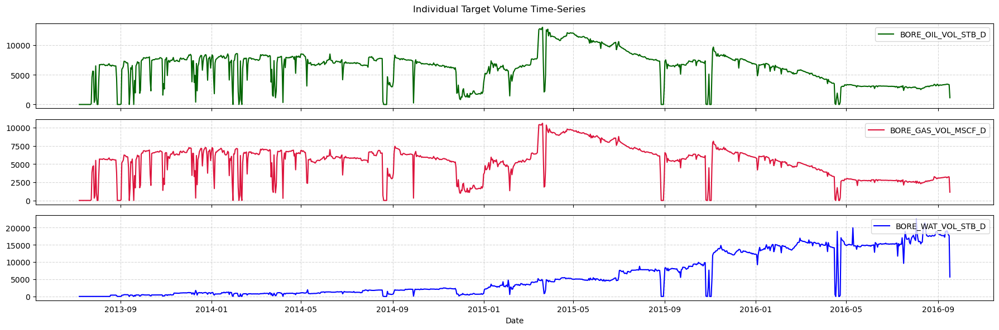

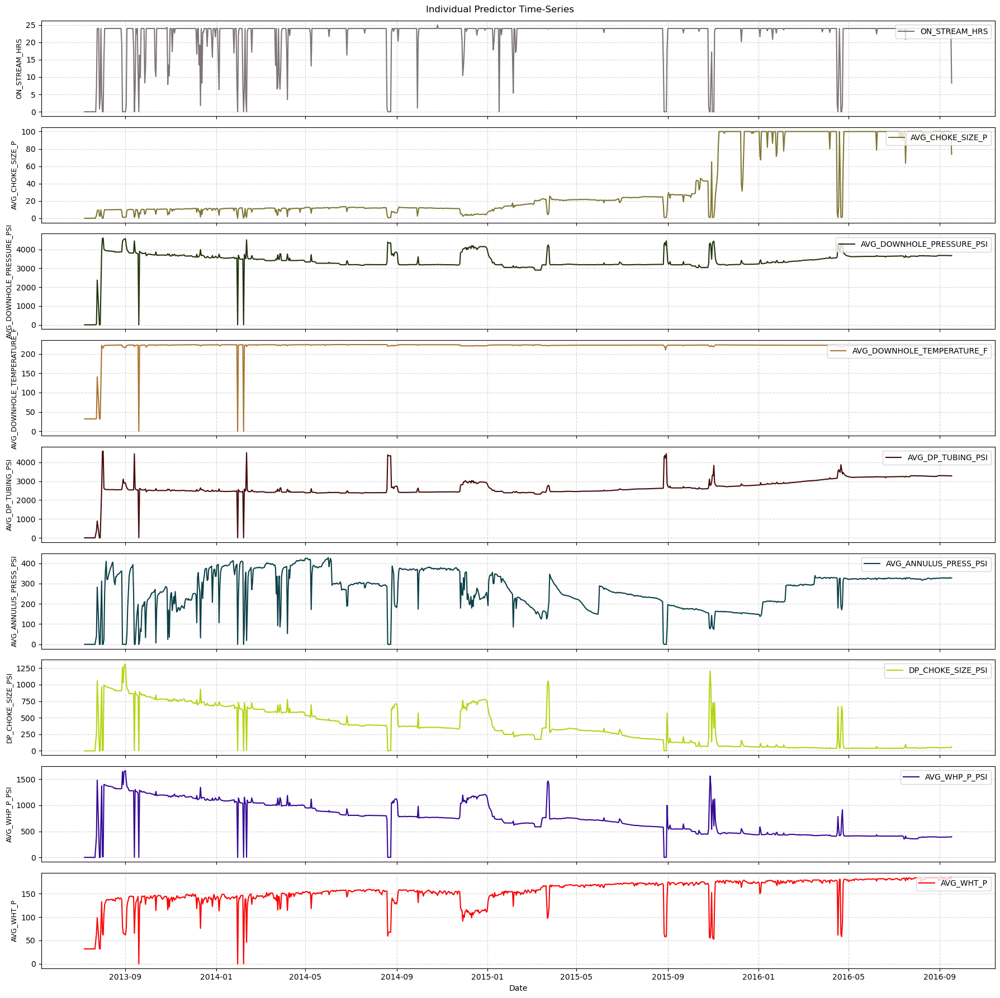

In [19]:
# dropped_nan_cols columns that have nan with more than 50% 
# dropped_zero_cols columns that have zeros with more than 50%
#missing_indicator_cols list of columns that tells us the column nan was changed using linear interpolation
#negative_indicator_cols   #list of columns that tells us the columns with negative values was set to zero

df, dropped_nan_cols, dropped_zero_cols, missing_indicator_cols, negative_indicator_cols=plot_clean_plot(df)

In [20]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D'],
      dtype='object')

In [21]:
# just to see the columns that were drops
dropped_nan_cols, dropped_zero_cols, missing_indicator_cols, negative_indicator_cols

([], [], [], [])

In [22]:
# drop indicator columns
df = df.drop(columns=missing_indicator_cols,errors='ignore')
df = df.drop(columns=negative_indicator_cols,errors='ignore')
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915


In [23]:
# drop columns not needed
cols_to_drop = ['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
                'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
                'NPD_FACILITY_NAME',"AVG_CHOKE_UOM",'FLOW_KIND', 'WELL_TYPE']
df = df.drop(columns=cols_to_drop,errors='ignore')
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915


In [24]:
#Find the missing dates
gap_info = df.index.to_series().diff()

df_gaps = pd.DataFrame({
    "current_date": df.index,
    "previous_date": df.index.to_series().shift(1).values,
    "gap": gap_info.values
}, index=df.index)

df_gaps[df_gaps["gap"] > pd.Timedelta(days=1)]

,current_date,previous_date,gap
DATEPRD,,,


In [25]:
# force reindex to daily
df_daily = df.copy()
df.index = pd.to_datetime(df.index)
df = df.sort_index()

df= df.asfreq("D")

In [26]:
# Find the missing dates again
gap_info = df.index.to_series().diff()

df_gaps = pd.DataFrame({
    "current_date": df.index,
    "previous_date": df.index.to_series().shift(1).values,
    "gap": gap_info.values
}, index=df.index)

df_gaps[df_gaps["gap"] > pd.Timedelta(days=1)]

,current_date,previous_date,gap
DATEPRD,,,


In [27]:
df[df.isna().any(axis=1)]

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,


In [28]:
# set all nans to zeros
df.fillna(0, inplace=True)
df[df.isna().any(axis=1)]

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,


In [29]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D'],
      dtype='object')

# Feature Engineering Steps

This steps is for making and testing the pipeline. It uses all the data. Again it is only for making sure the pipepline works

## 1 Calulate GOR and WCUT

In [30]:
GOR_WCUT_feat=GOR_WCUT_Transformer(
        oil_col='BORE_OIL_VOL_STB_D', 
        gas_col='BORE_GAS_VOL_MSCF_D', 
        water_col='BORE_WAT_VOL_STB_D')

In [31]:
# Add the GOR and WCUT to the dataframe.
df = GOR_WCUT_feat.fit_transform(df)

In [32]:
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461


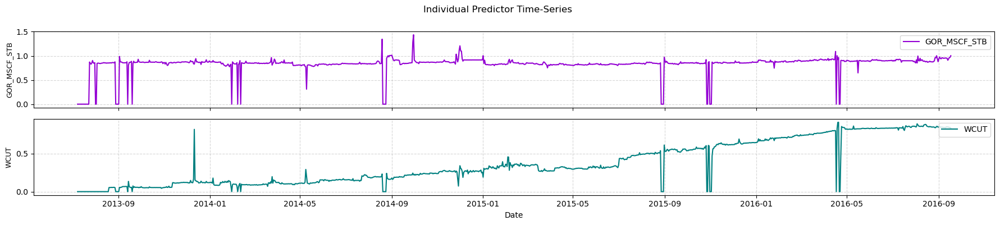

In [33]:
# plot the GOR and WCUT
seperate_predictor_plot(df[["GOR_MSCF_STB","WCUT"]])

In [34]:
df.isnull().sum()

ON_STREAM_HRS                 0
AVG_CHOKE_SIZE_P              0
AVG_DOWNHOLE_PRESSURE_PSI     0
AVG_DOWNHOLE_TEMPERATURE_F    0
AVG_DP_TUBING_PSI             0
AVG_ANNULUS_PRESS_PSI         0
DP_CHOKE_SIZE_PSI             0
AVG_WHP_P_PSI                 0
AVG_WHT_P                     0
BORE_OIL_VOL_STB_D            0
BORE_GAS_VOL_MSCF_D           0
BORE_WAT_VOL_STB_D            0
GOR_MSCF_STB                  0
WCUT                          0
dtype: int64

(df.select_dtypes(include='number') < 0).sum()

## 2 Lag Selection

### 2.1 Seasonal Plots

The selection is just to plot to see what seasonal pattern I see. I going to use this later in 5 where I actually create features for these seasonal patterns

In [24]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
      dtype='object')

#### Day of the week seasonal pattern

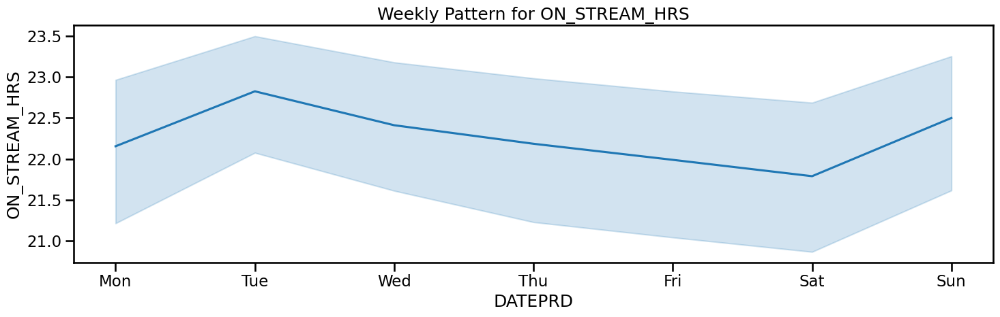

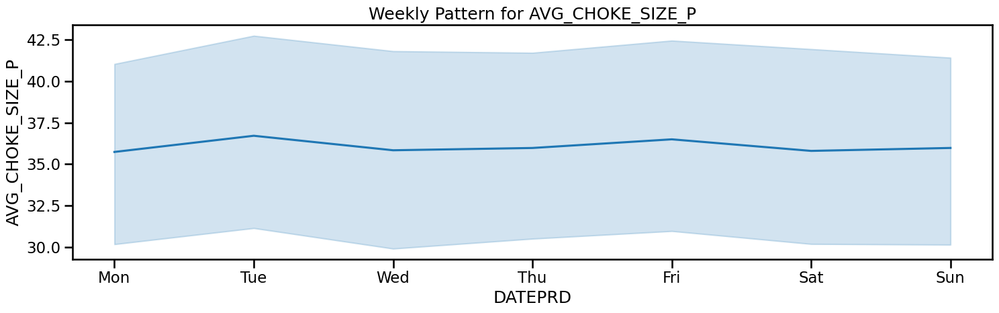

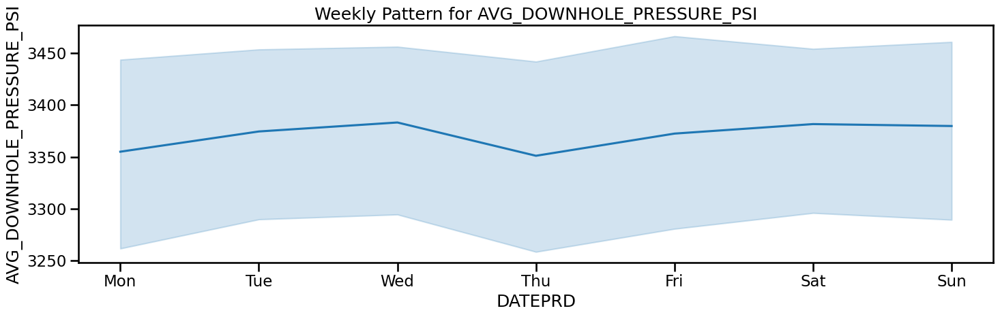

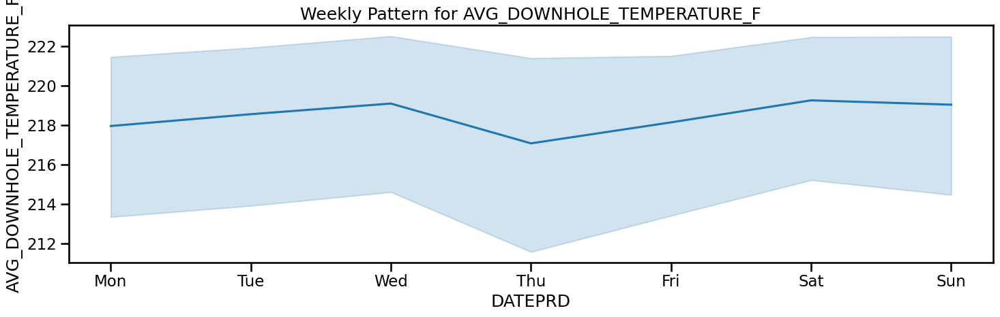

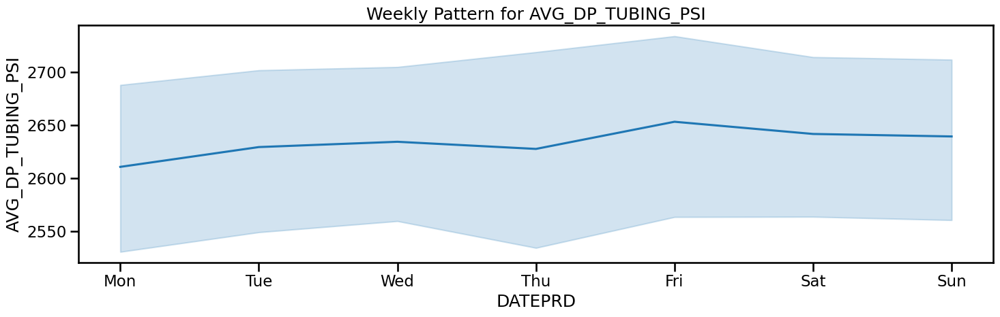

...

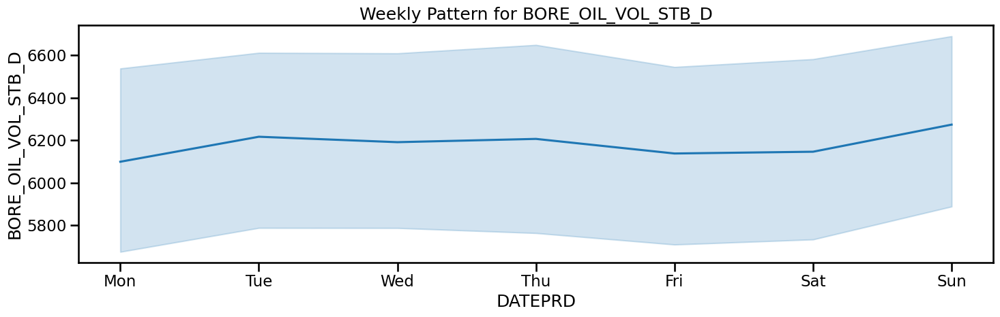

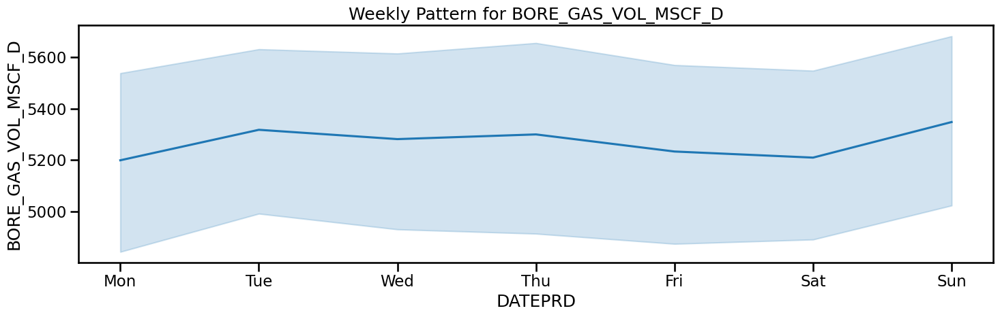

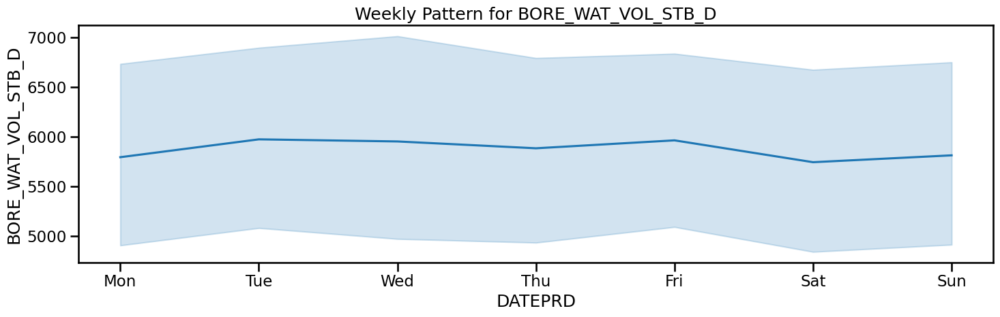

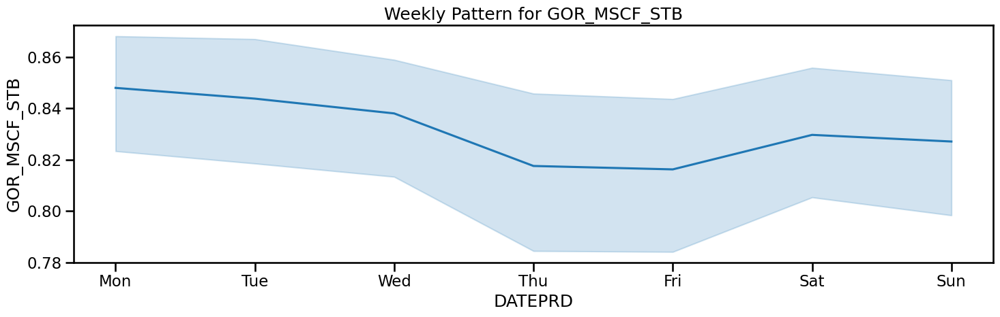

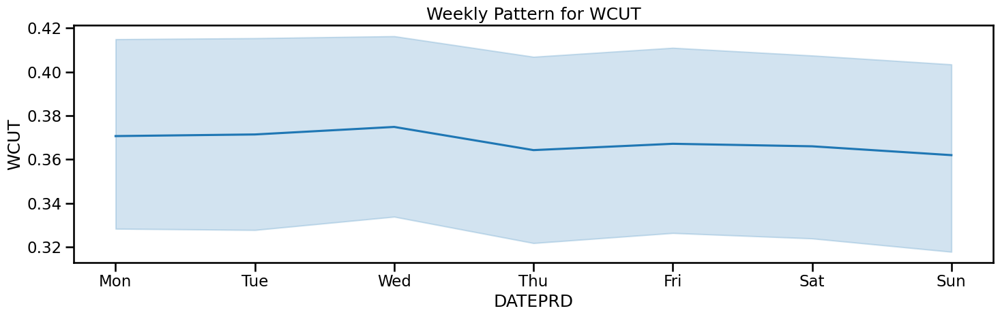

In [25]:
pd.plotting.register_matplotlib_converters()
with sns.plotting_context("talk"):

    for feat in df.columns:
    
        fig, ax = plt.subplots(figsize=[15, 5])
        
        sns.lineplot(x=df.index.dayofweek, y=df[feat], ax=ax)
        ax.set_xticks(range(7))
        ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
        ax.set_title(f"Weekly Pattern for {feat}")
        
        plt.tight_layout()
        plt.show()  # Ensures each plot displays sequentially in your loop

I don't think there is a weekly seasonality

####  Month of the year seasonal pattern

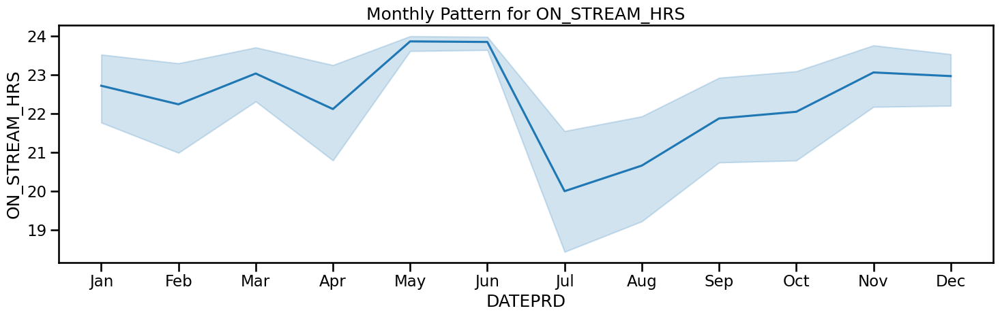

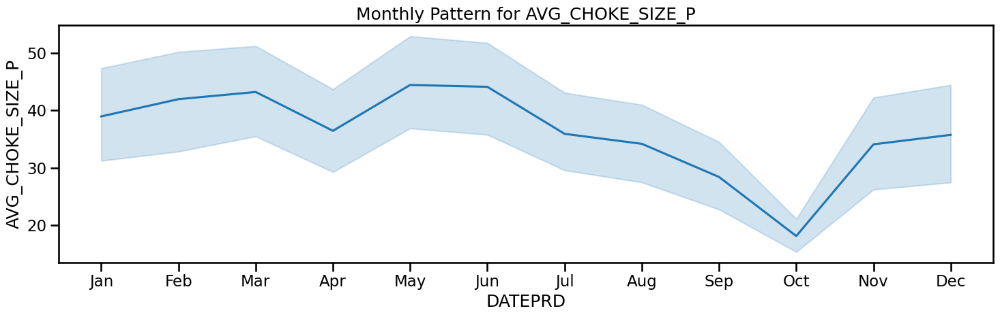

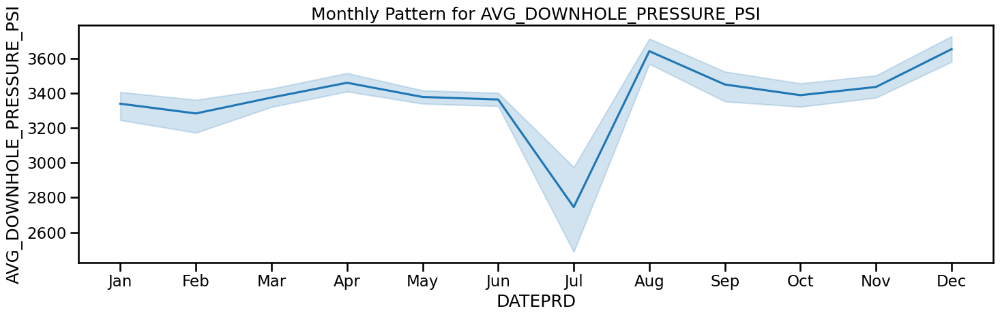

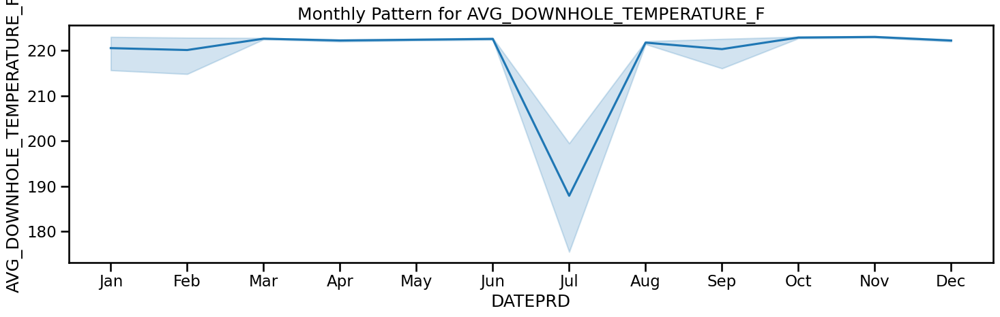

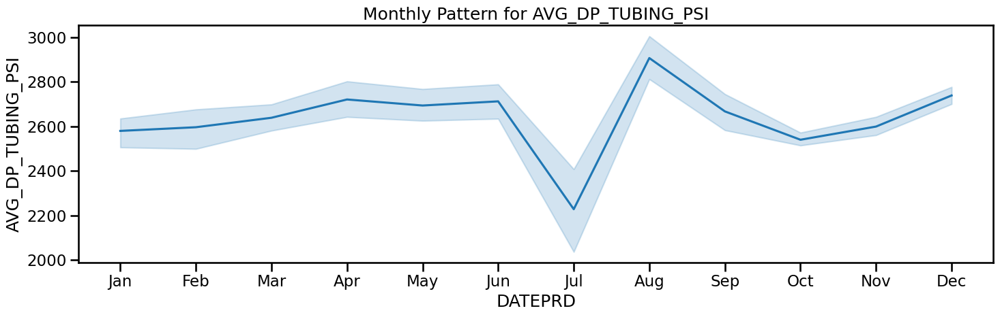

...

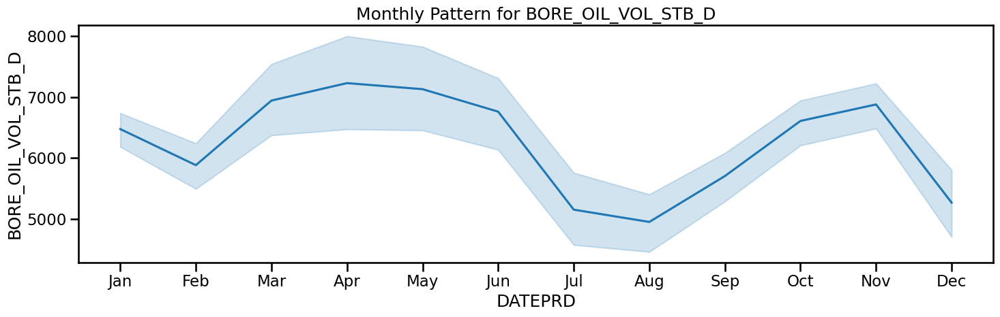

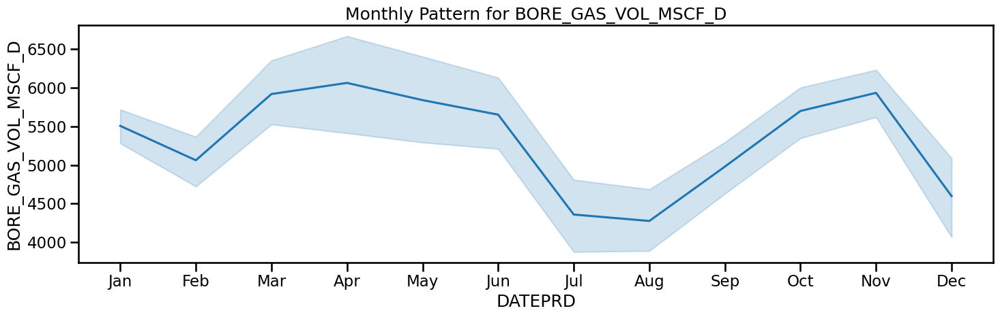

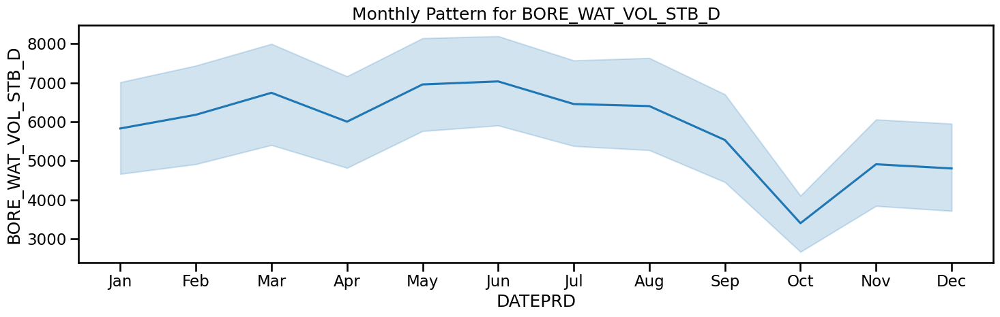

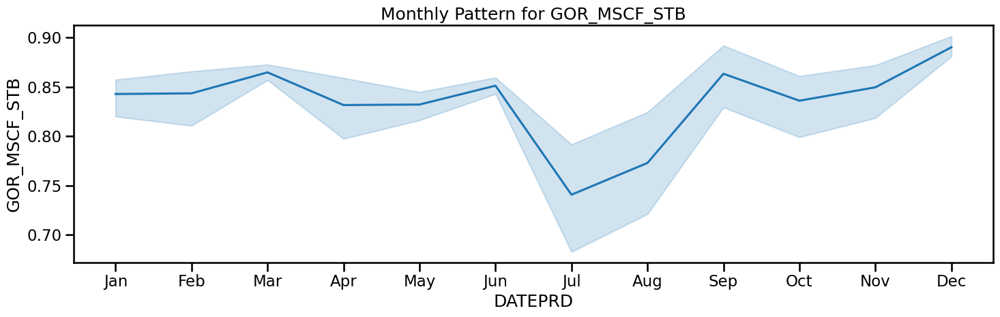

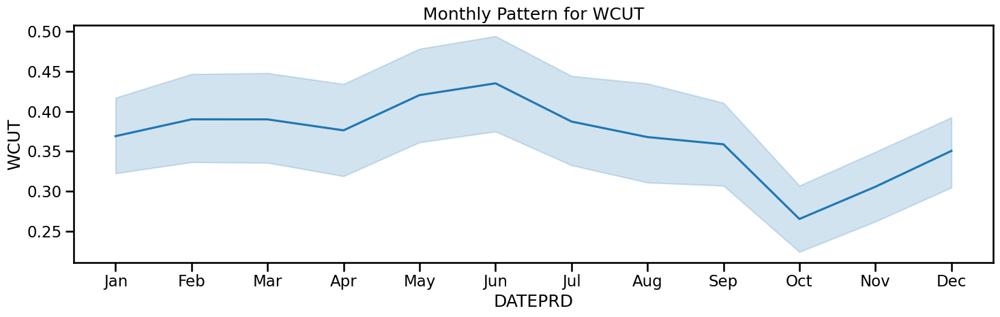

In [26]:
pd.plotting.register_matplotlib_converters()

# Using "talk" context for larger text sizing
with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Change x to df.index.month (values ranging from 1 to 12)
        sns.lineplot(x=df.index.month, y=df[feat], ax=ax)
        
        # 2. Update ticks for 12 months (1 through 12)
        ax.set_xticks(range(1, 13))
        ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        
        # 3. Update the title to reflect the monthly trend
        ax.set_title(f"Monthly Pattern for {feat}")
        
        plt.tight_layout()
        plt.show()

There is a monthly seasonal pattern

#### Week of the year seasonal pattern

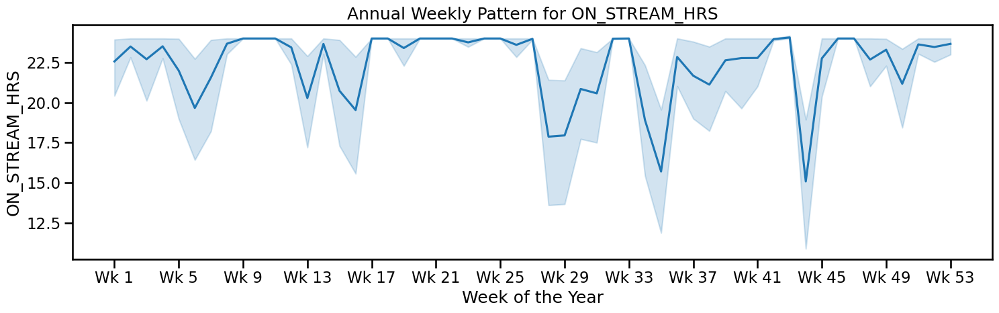

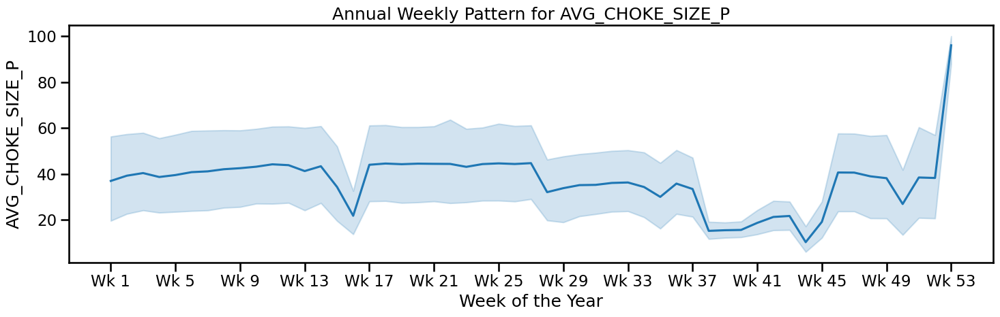

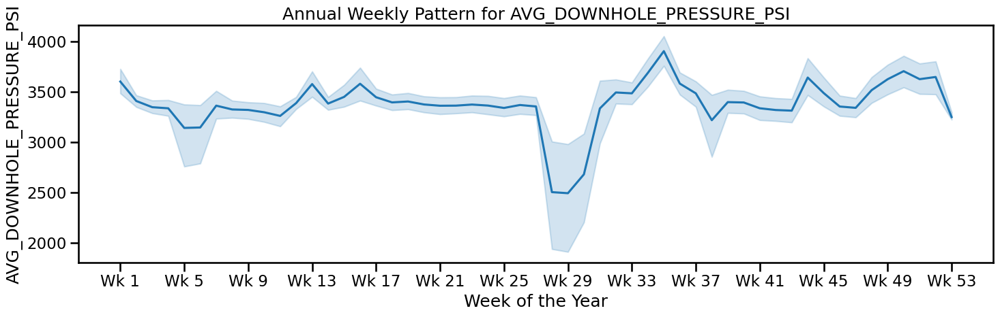

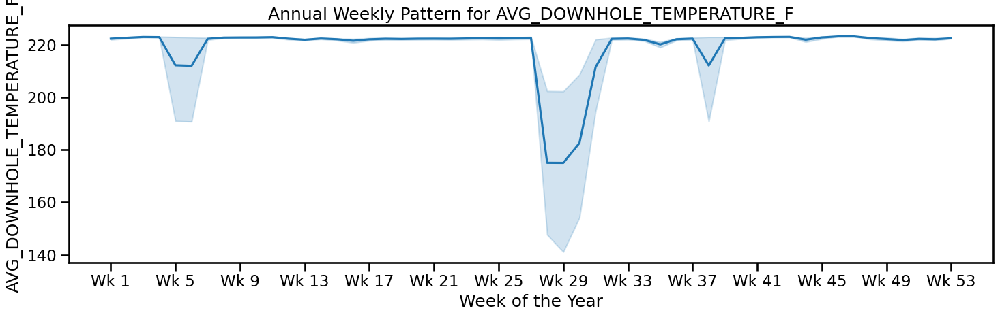

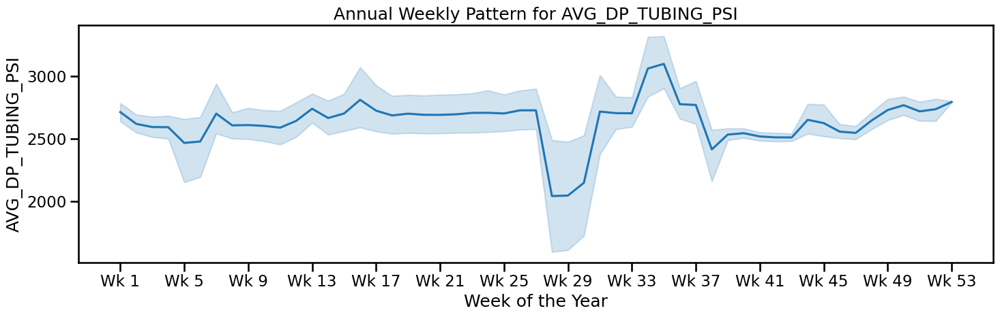

...

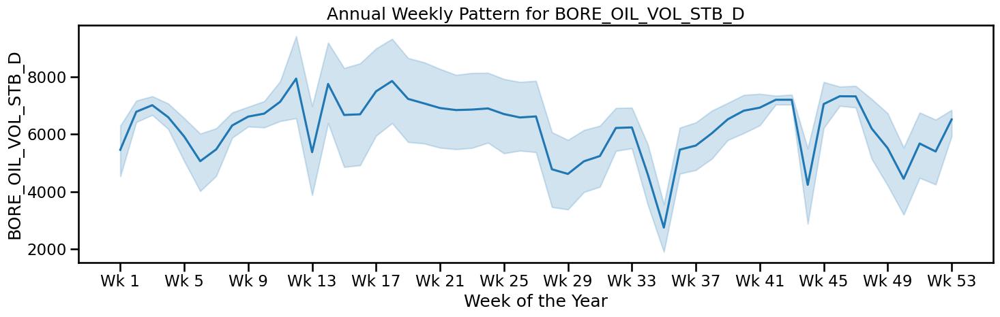

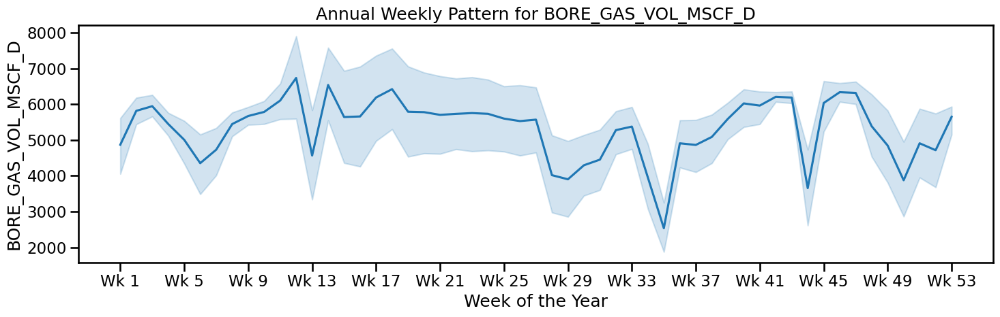

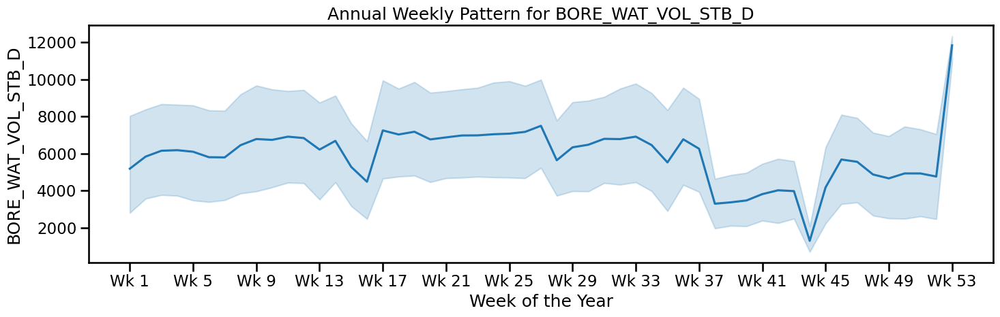

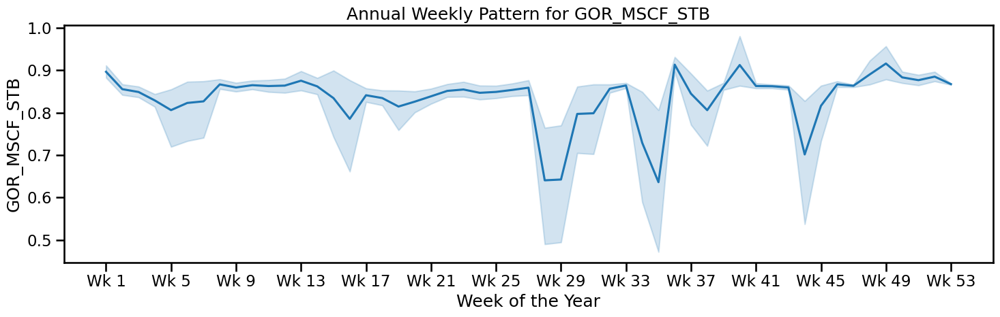

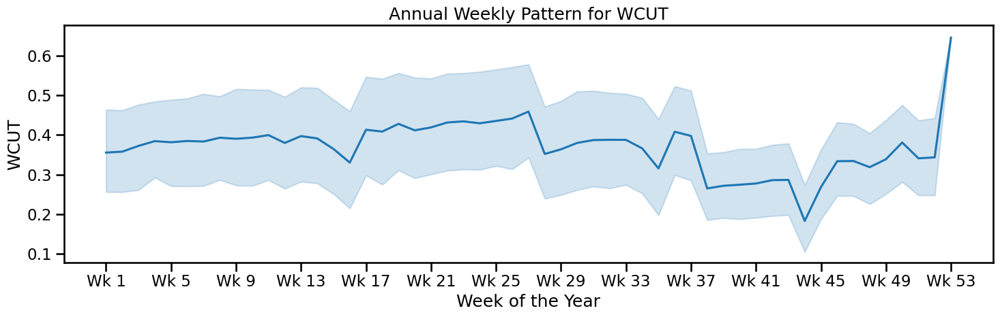

In [27]:
pd.plotting.register_matplotlib_converters()

with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Use .isocalendar().week to get week numbers (1 to 52/53)
        sns.lineplot(x=df.index.isocalendar().week, y=df[feat], ax=ax)
        
        # 2. Clean up x-axis: label every 4th week so it's readable
        week_ticks = list(range(1, 54, 4))
        ax.set_xticks(week_ticks)
        ax.set_xticklabels([f"Wk {w}" for w in week_ticks])
        
        ax.set_title(f"Annual Weekly Pattern for {feat}")
        ax.set_xlabel("Week of the Year")
        
        plt.tight_layout()
        plt.show()

There is also a weekly seasonal pattern for the year

#### Quater of the year seasonal pattern

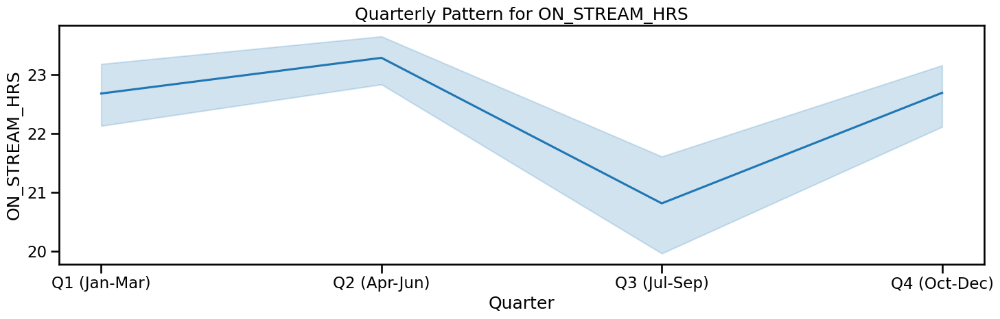

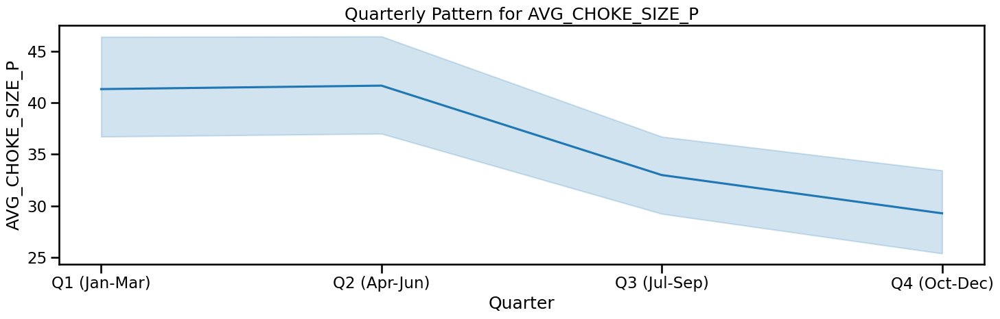

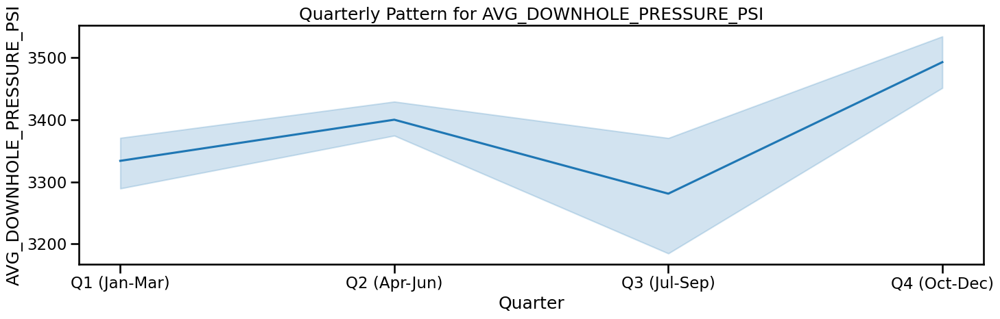

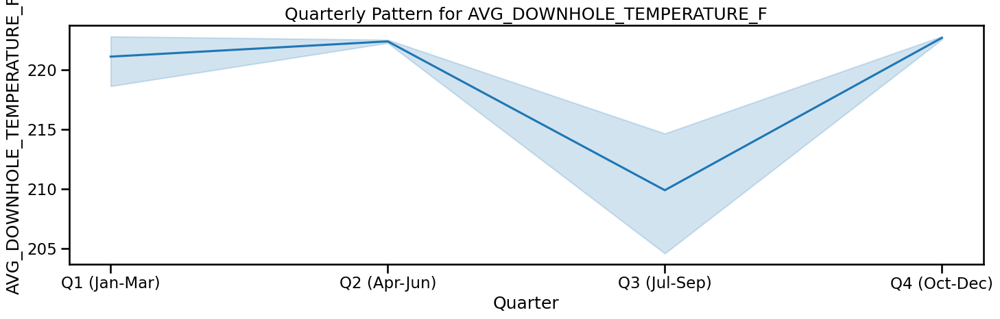

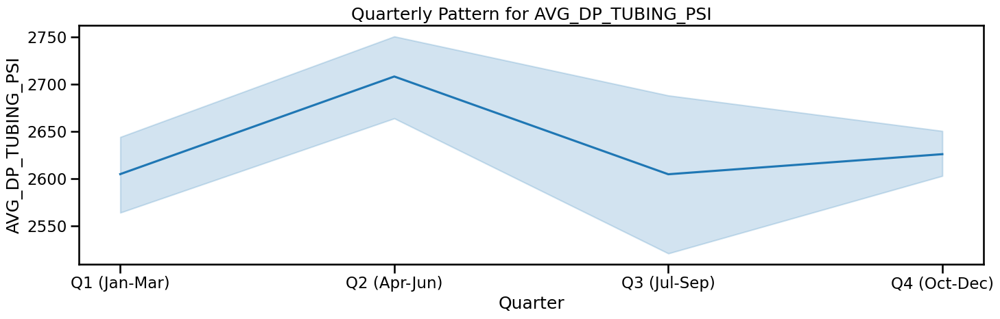

...

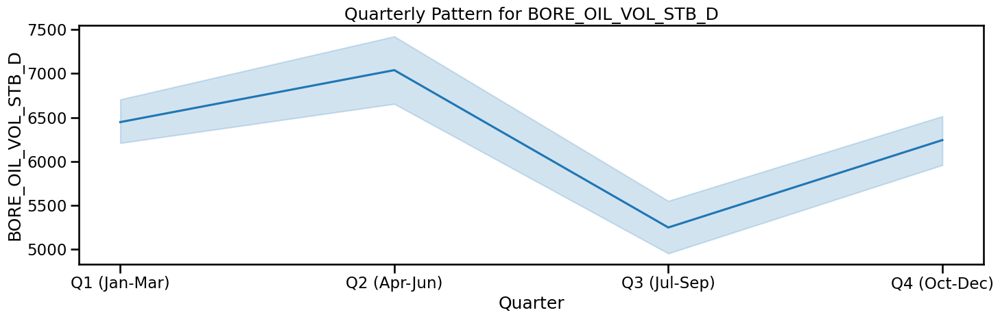

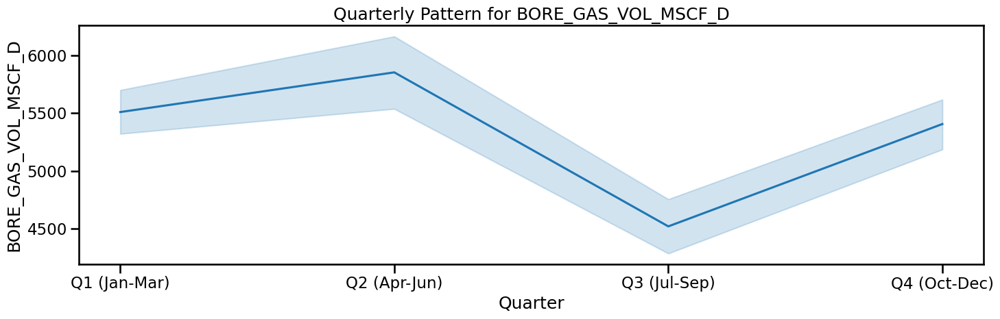

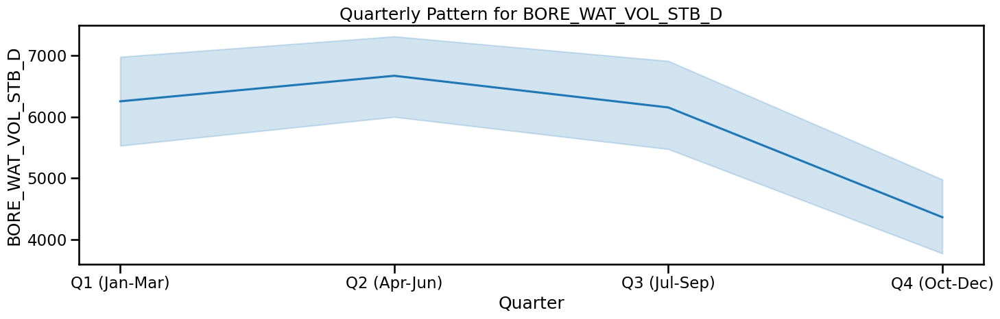

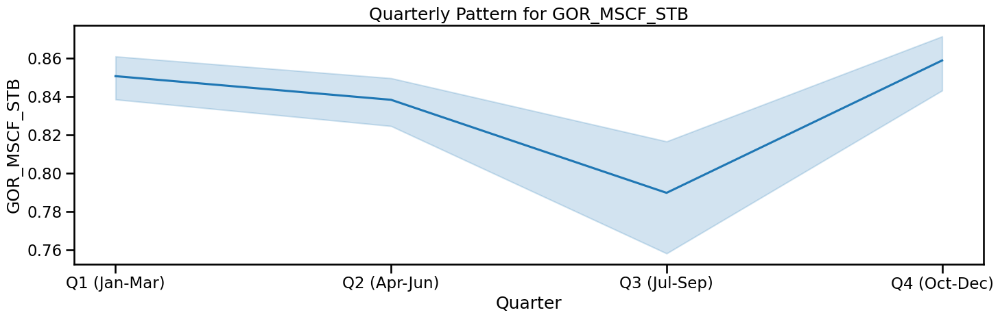

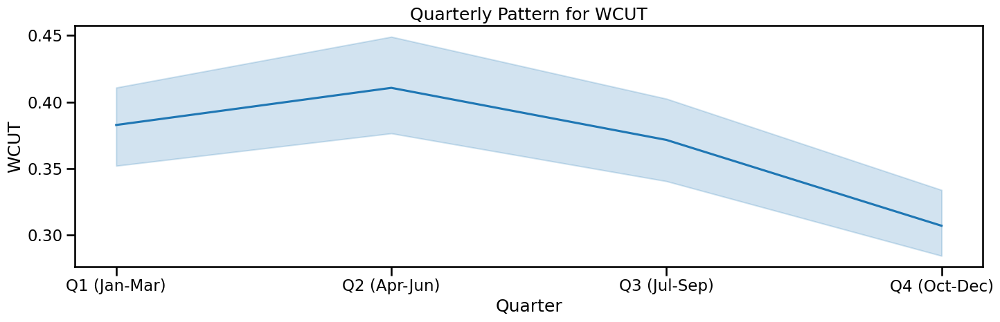

In [28]:

pd.plotting.register_matplotlib_converters()

with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Use df.index.quarter to group data into 4 chunks
        sns.lineplot(x=df.index.quarter, y=df[feat], ax=ax)
        
        # 2. Set explicit ticks for the 4 quarters
        ax.set_xticks([1, 2, 3, 4])
        ax.set_xticklabels(['Q1 (Jan-Mar)', 'Q2 (Apr-Jun)', 'Q3 (Jul-Sep)', 'Q4 (Oct-Dec)'])
        
        ax.set_title(f"Quarterly Pattern for {feat}")
        ax.set_xlabel("Quarter")
        
        plt.tight_layout()
        plt.show()

A little but not as much

### 2.2 ACF & PACF To pick lags

I am going to use this to plot the ACF anad PACF and manually pick the lags. and force keep these lags in the lasso selector

In [24]:
df_acf_pacf=df.copy()

In [25]:
df_acf_pacf

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461


#### ACF & PACF for oil

##### without removing tend or seasonality

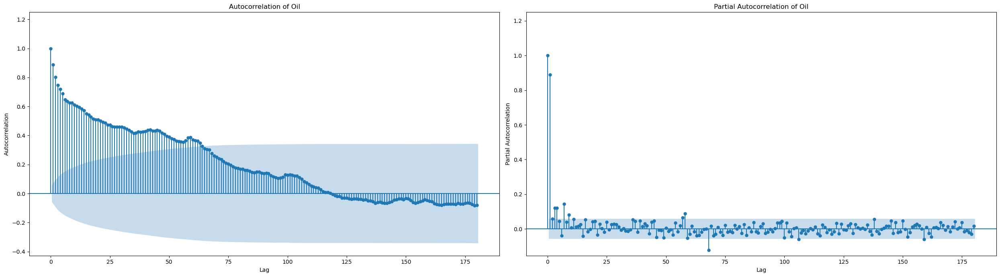

In [26]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_OIL_VOL_STB_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Oil")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_OIL_VOL_STB_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Oil")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

#####  detrend

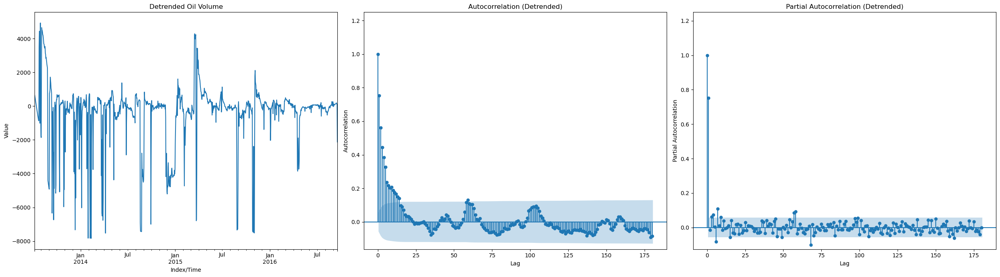

In [27]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_OIL_VOL_STB_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_oil"] = res[:, 1]
df_acf_pacf["y_oil_detrend"] = df_acf_pacf["BORE_OIL_VOL_STB_D"] - df_acf_pacf["lowess_oil"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_oil_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Oil Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_oil_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_oil_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

#####  detrend and deseason

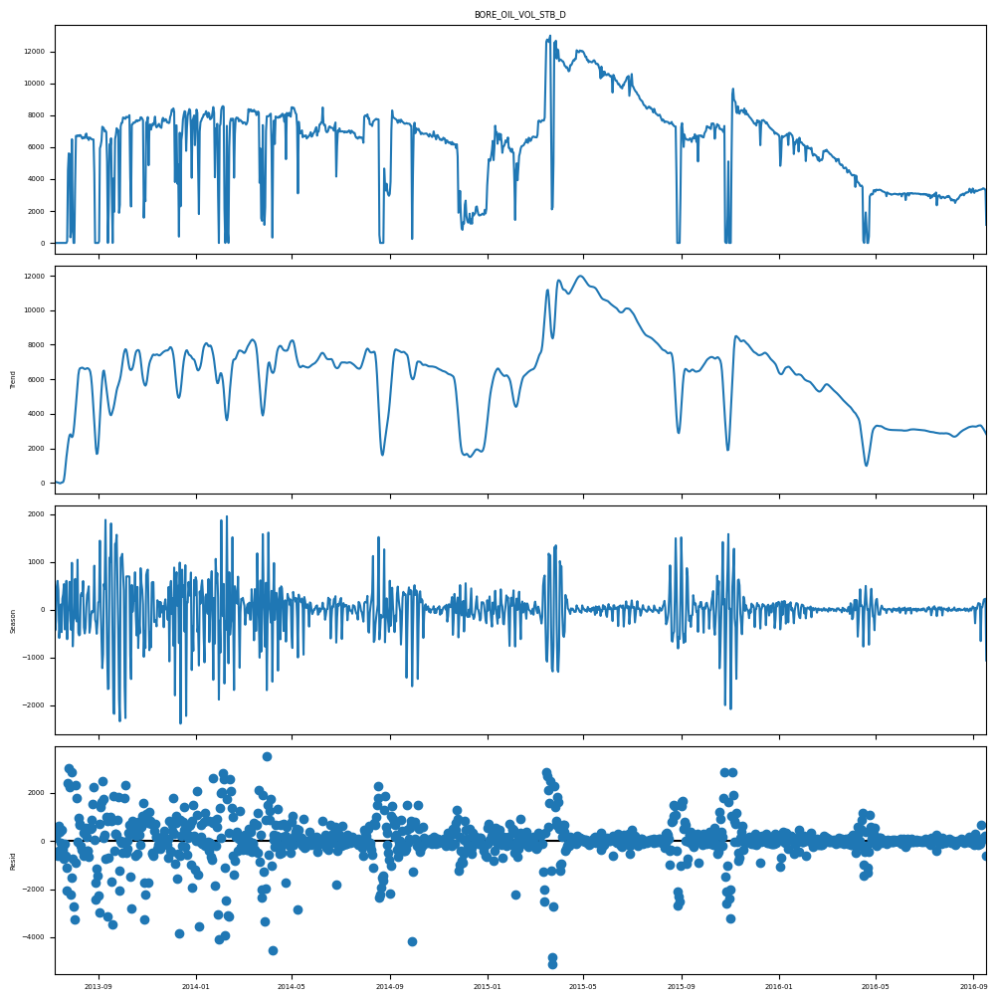

In [30]:
# Break the timeseries into trend, seasonality, and residual components
res_oil = STL(df_acf_pacf["BORE_OIL_VOL_STB_D"]).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_oil.plot();

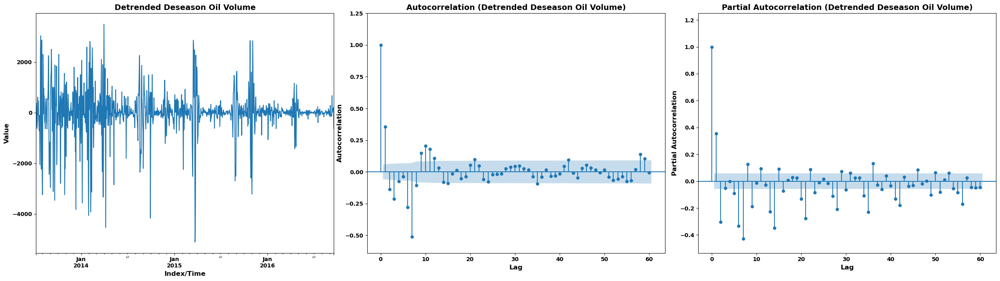

In [31]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_oil.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Oil Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_oil.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Oil Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_oil.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Oil Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

after removing the trend and the season, i should use a Lag of 1

#### ACF & PACF for gas

#####  without removing tend or seasonality

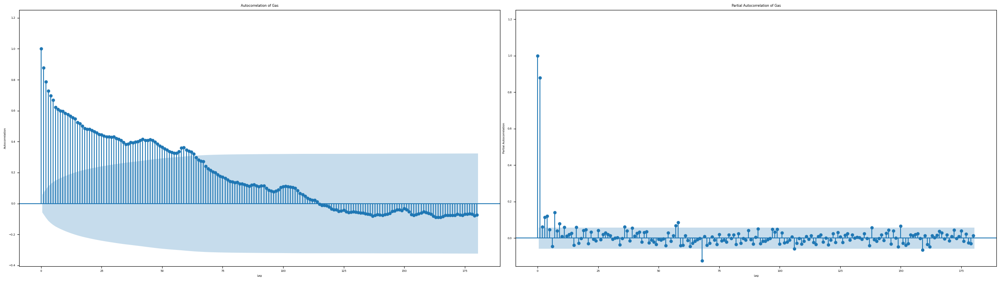

In [32]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_GAS_VOL_MSCF_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Gas")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_GAS_VOL_MSCF_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Gas")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

#####  detrend

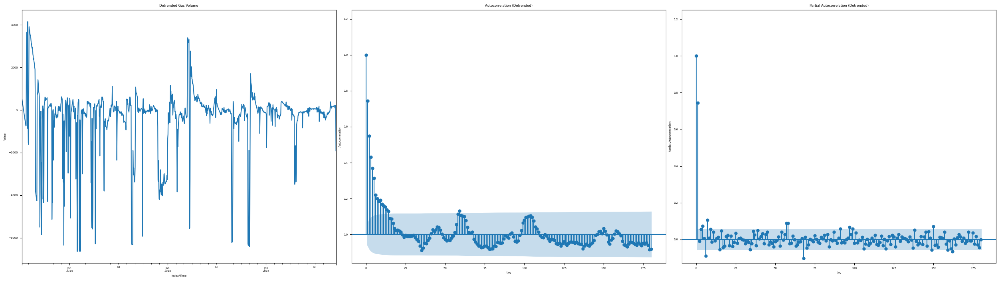

In [33]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_GAS_VOL_MSCF_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_gas"] = res[:, 1]
df_acf_pacf["y_gas_detrend"] = df_acf_pacf["BORE_GAS_VOL_MSCF_D"] - df_acf_pacf["lowess_gas"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_gas_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Gas Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_gas_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_gas_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

#####  detrend and deseason

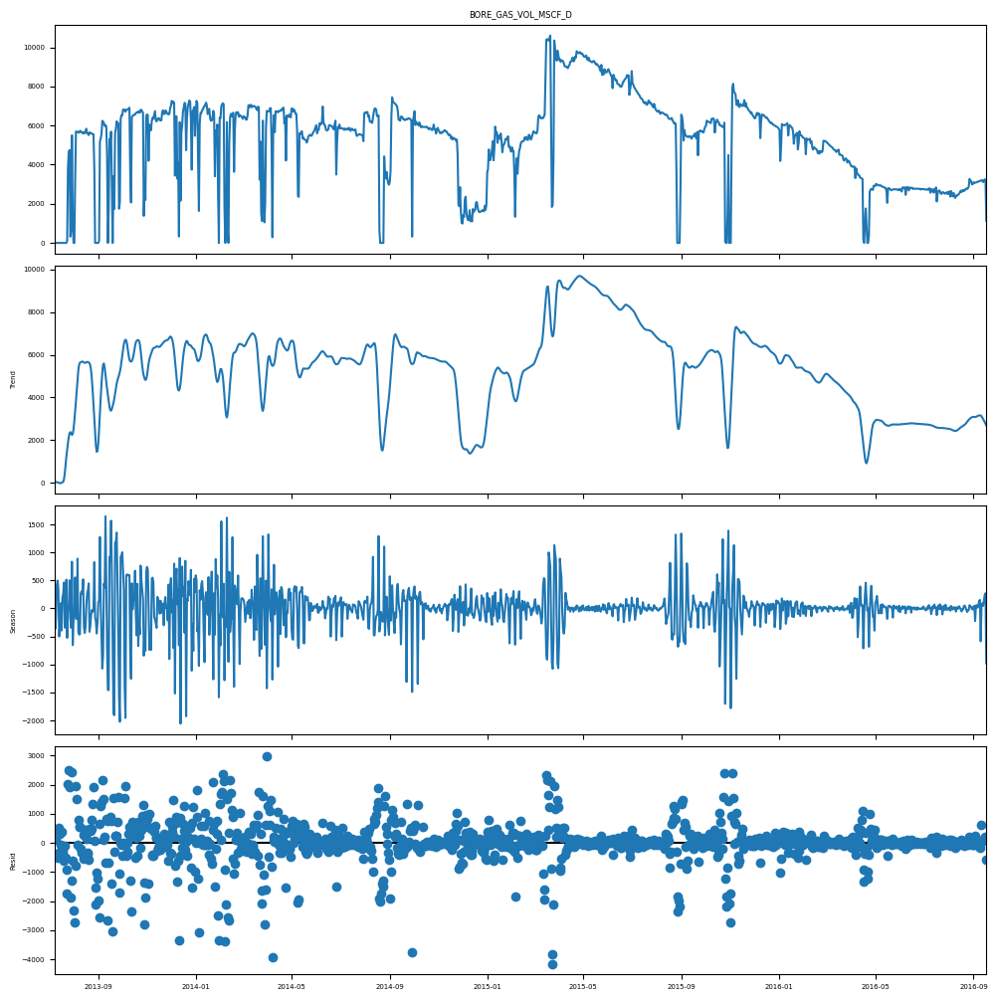

In [34]:
# Break the timeseries into trend, seasonality, and residual components
res_gas = STL(df_acf_pacf["BORE_GAS_VOL_MSCF_D"]).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_gas.plot();

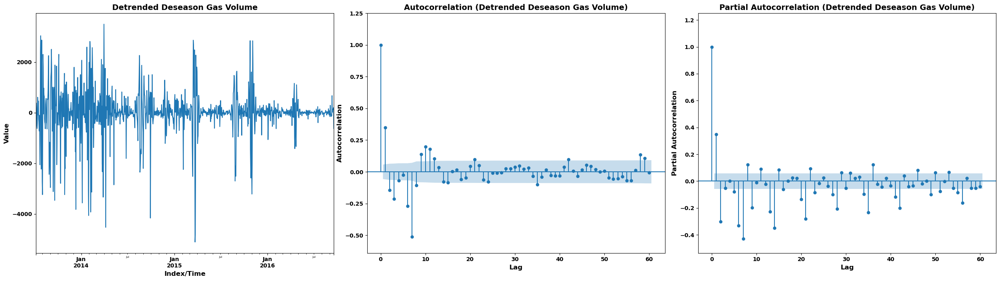

In [35]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_oil.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Gas Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_gas.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Gas Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_gas.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Gas Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

#####  Final comments

after removing the trend and the season, i should use a Lag of 1

#### ACF & PACF for water

##### without removing tend or seasonality

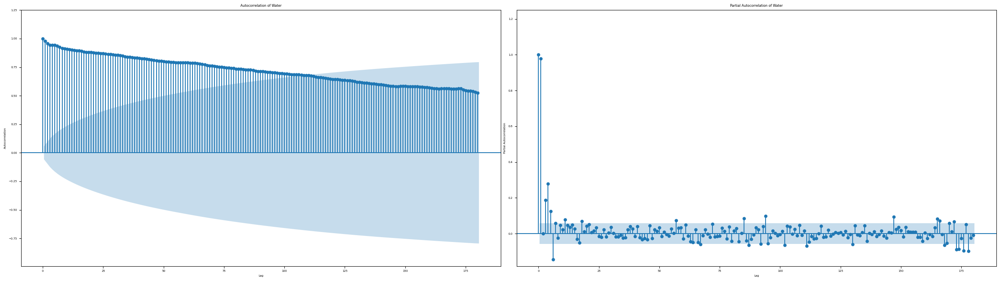

In [36]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_WAT_VOL_STB_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Water")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_WAT_VOL_STB_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Water")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

##### detrend

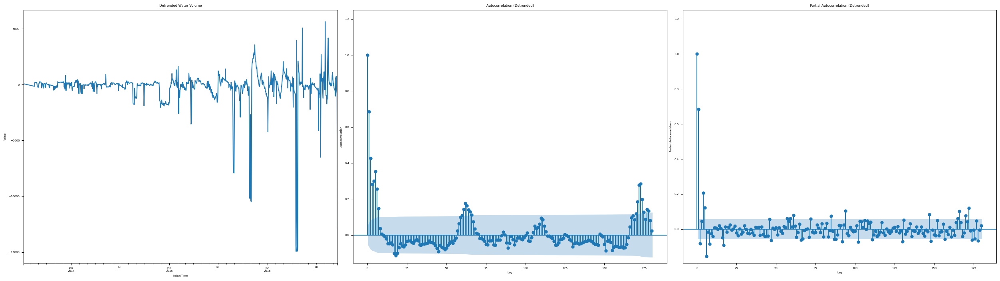

In [37]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_WAT_VOL_STB_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_water"] = res[:, 1]
df_acf_pacf["y_water_detrend"] = df_acf_pacf["BORE_WAT_VOL_STB_D"] - df_acf_pacf["lowess_water"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_water_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Water Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_water_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_water_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### detrend and deseason

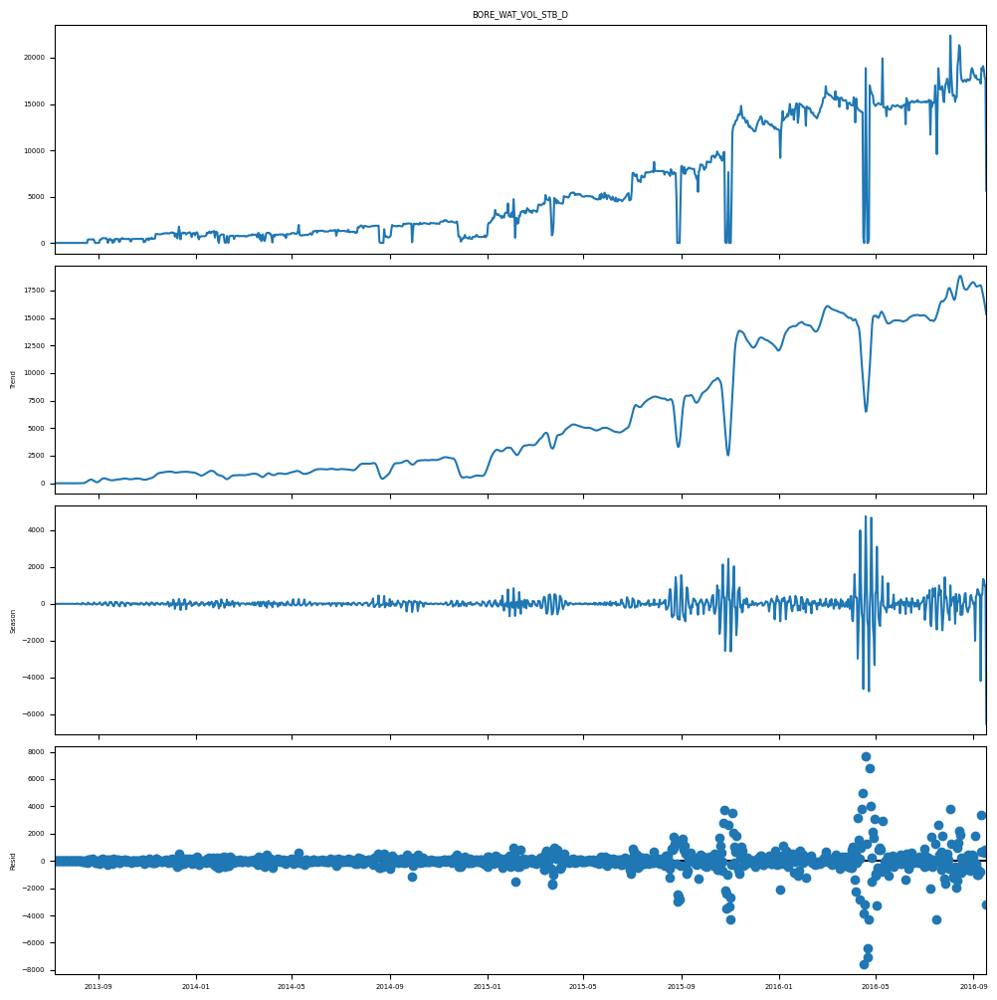

In [38]:
# Break the timeseries into trend, seasonality, and residual components
res_water = STL(df_acf_pacf["BORE_WAT_VOL_STB_D"]).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_water.plot();

In [39]:
# Looking at this there is definitely an issue with the variance

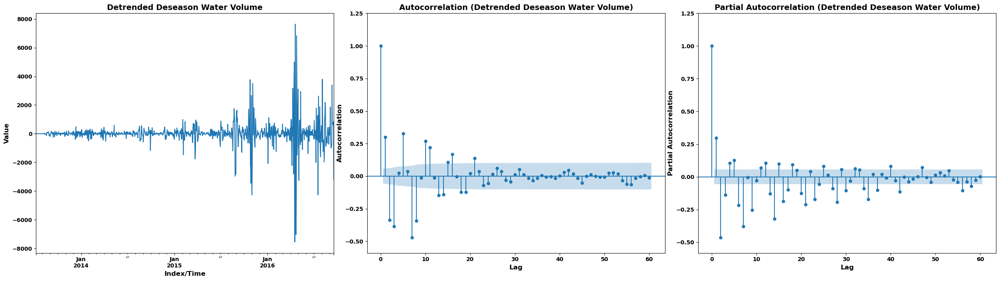

In [40]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_water.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Water Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_water.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Water Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_water.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Water Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

Looking at all the plots, there is an issue with the variance. I might stabalize the variance in another notebook. Also I am only going to use water lag 1

### 2.3 Cross Correlation plot

I am going to use this to plot  manually pick the lags. and force keep these lags in the lasso selector

In [46]:
df_ccf=df.copy()

In [47]:
stl_results = {}

for col in df_ccf:
    # Store the result in the dictionary using a dynamic key
    stl_results[f"res_{col}"] = STL(df_ccf[col]).fit()

#### CCF for oil

In [48]:
# target
res_oil = STL(df_ccf["BORE_OIL_VOL_STB_D"]).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_AVG_ANNULUS_PRESS_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D
Analyzing components for: res_GOR_MSCF_STB
Analyzing components for: res_WCUT


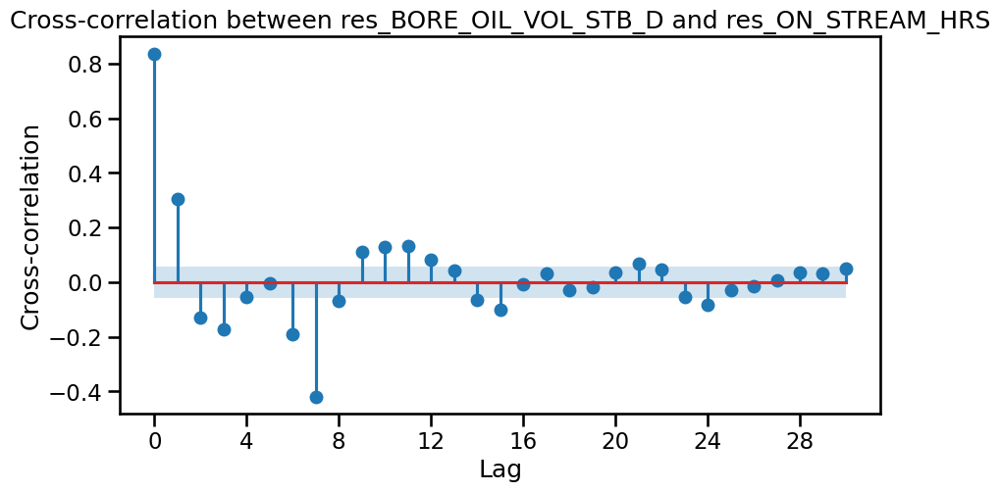

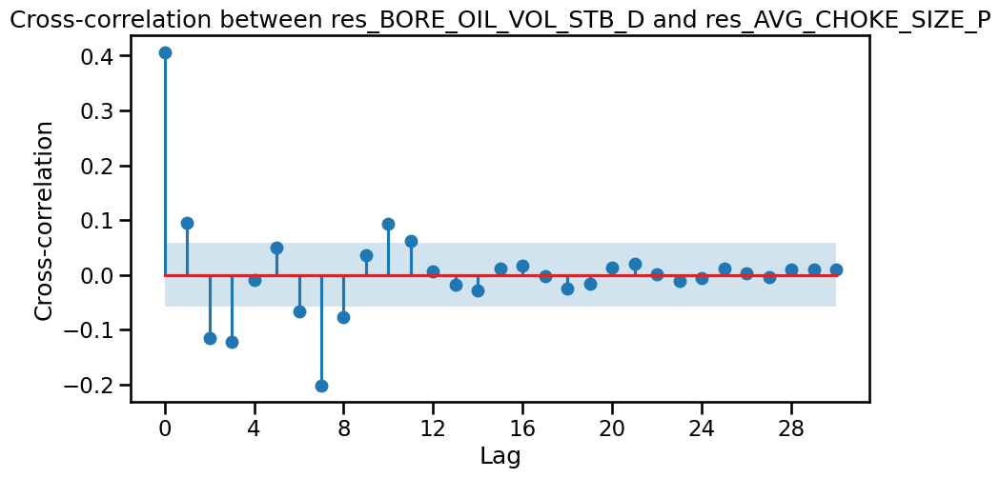

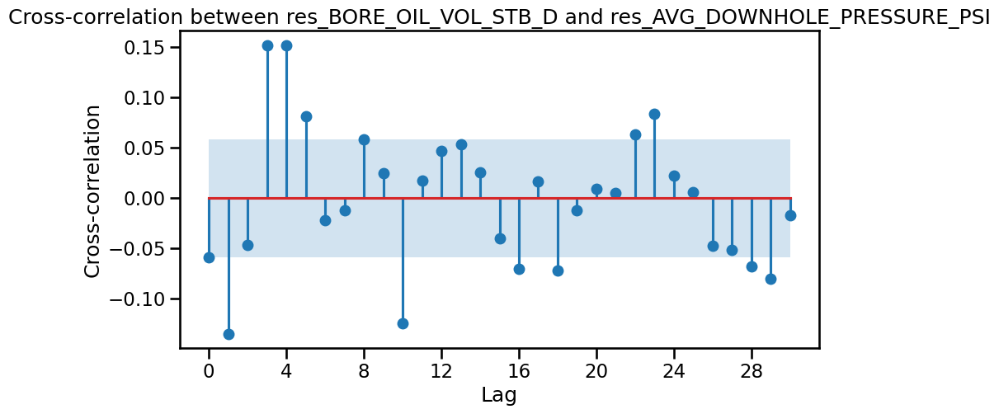

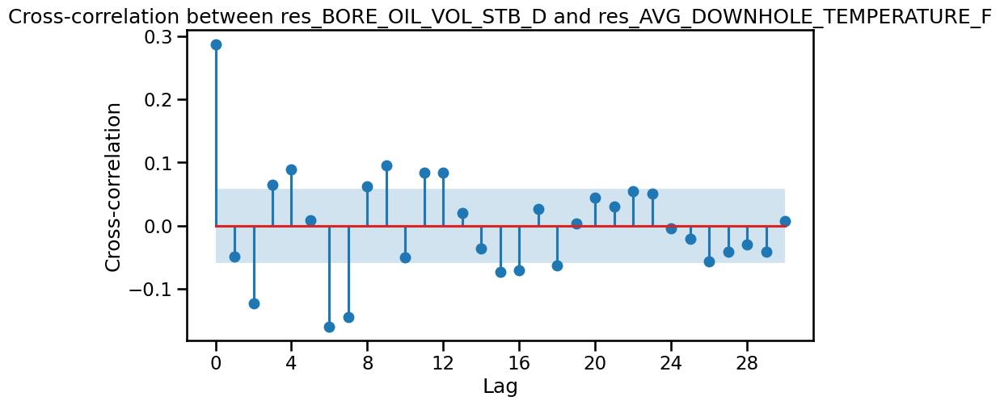

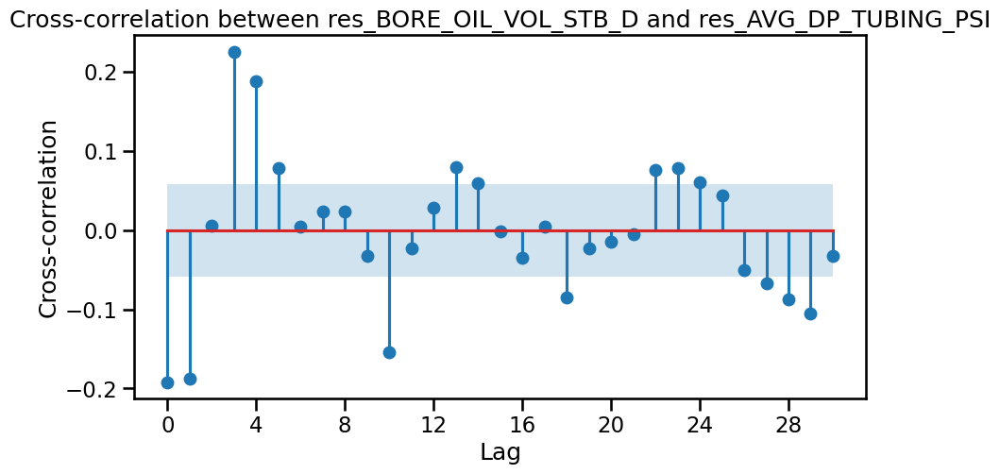

...

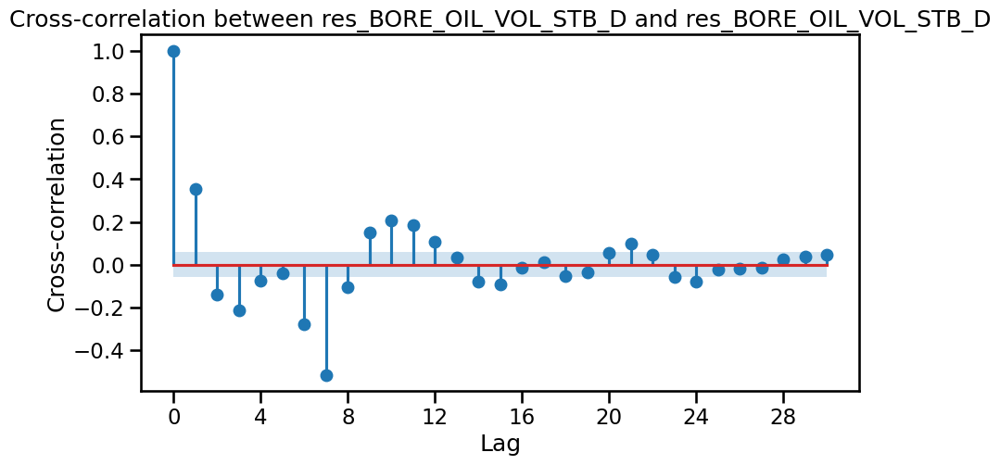

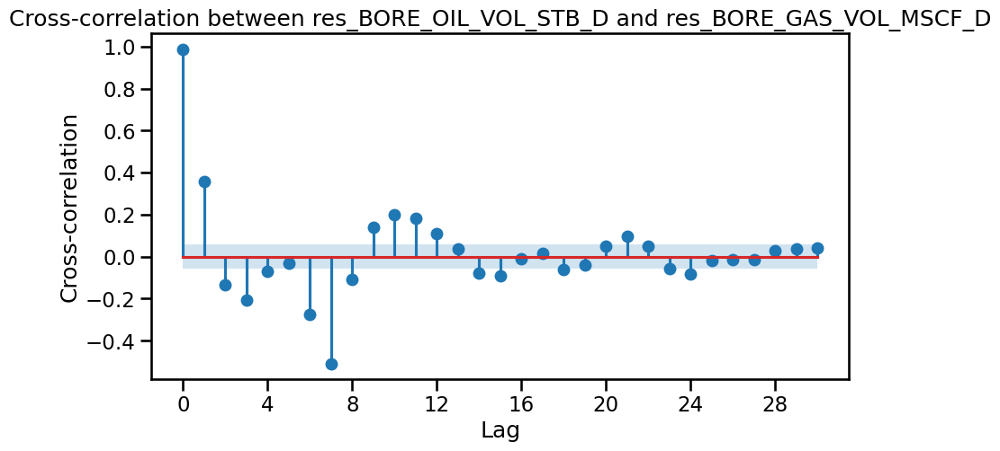

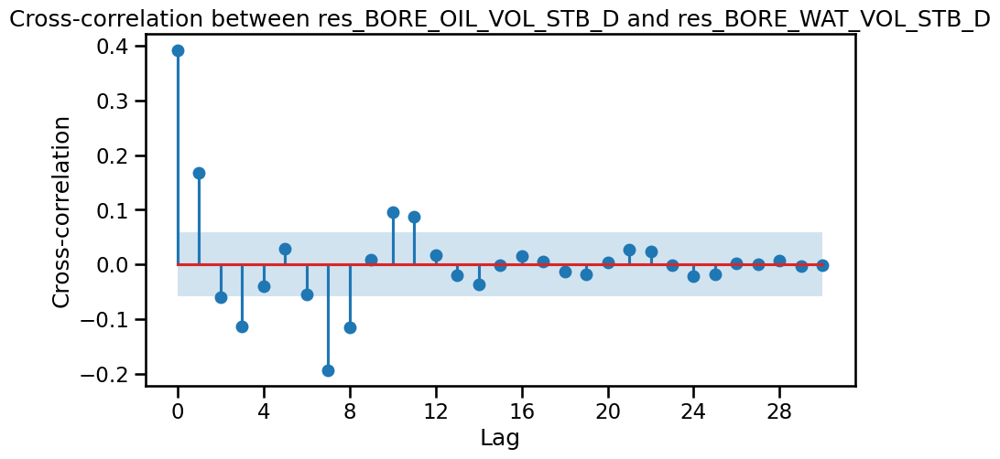

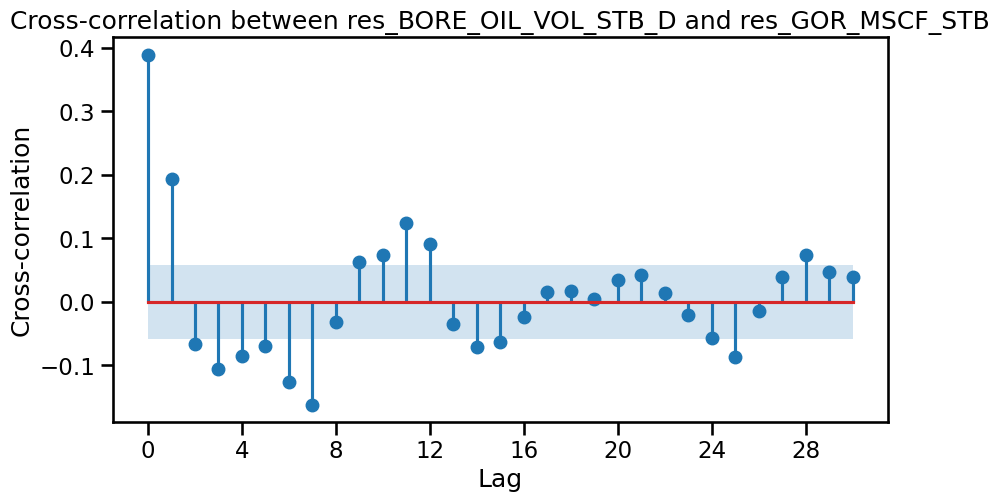

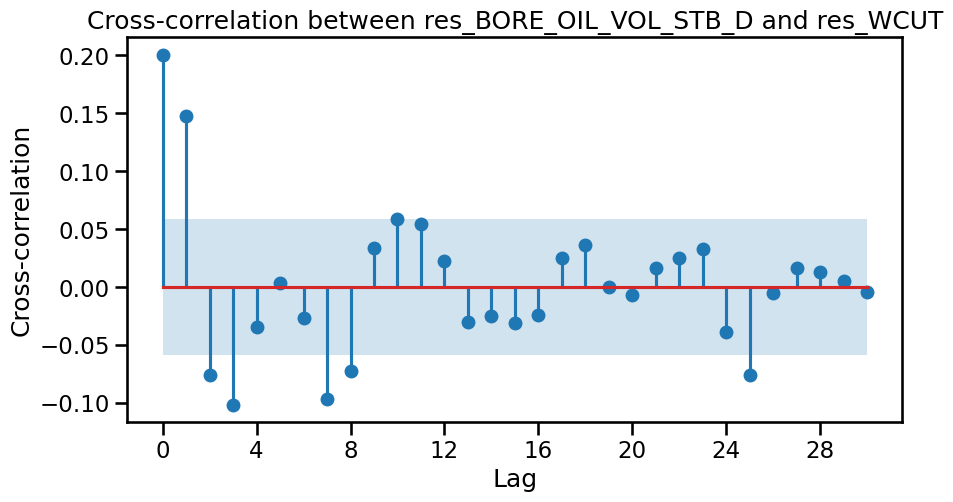

In [50]:
with sns.plotting_context("talk"):
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_OIL_VOL_STB_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between res_BORE_OIL_VOL_STB_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot
on_stream: 0,1
avg choke, 0,1
avg wht_P: 0,1
bore_oil_vol: 1
gas:1


#### CCF for gas

In [44]:
# target
res_gas = STL(df_ccf["BORE_GAS_VOL_MSCF_D"]).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D
Analyzing components for: res_GOR_MSCF/STB
Analyzing components for: res_WCUT


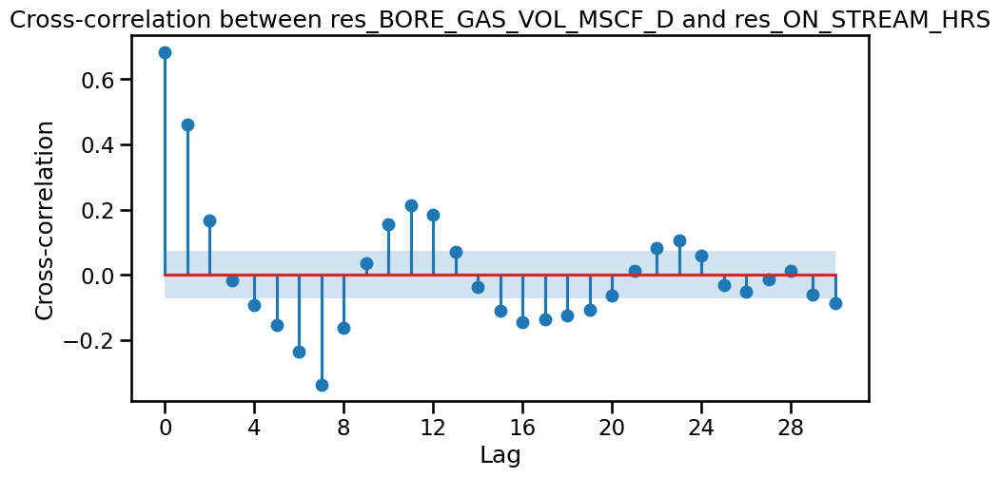

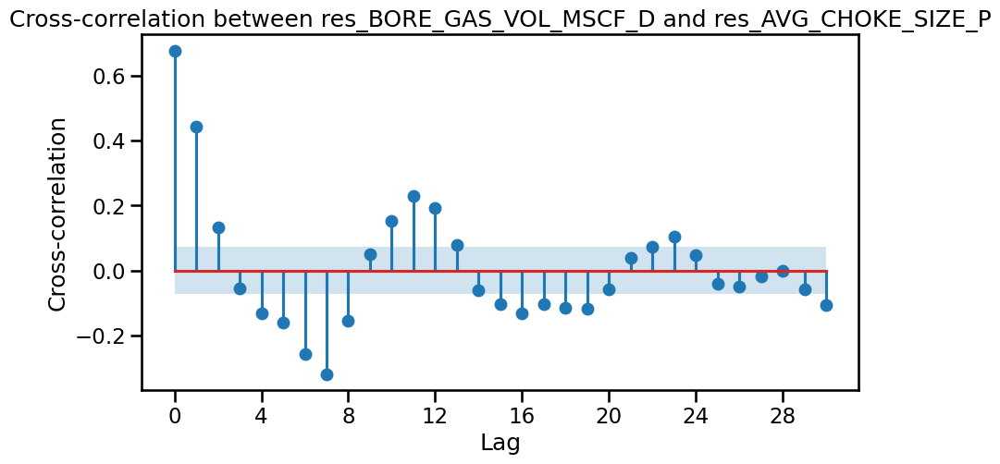

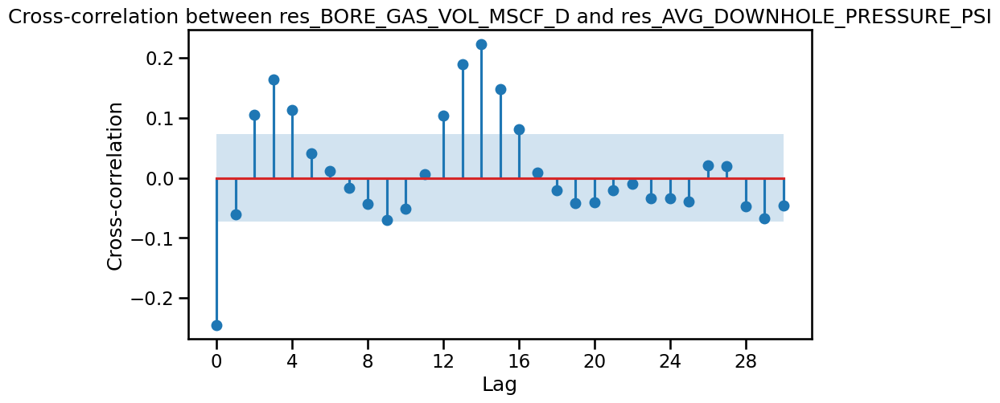

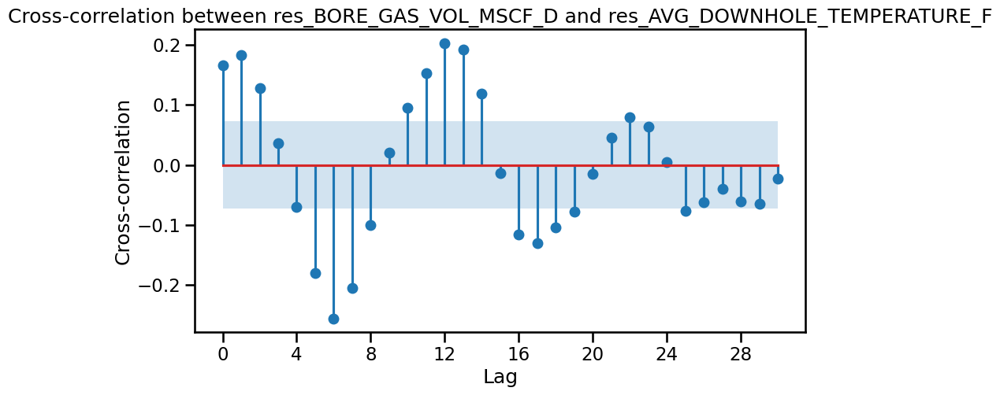

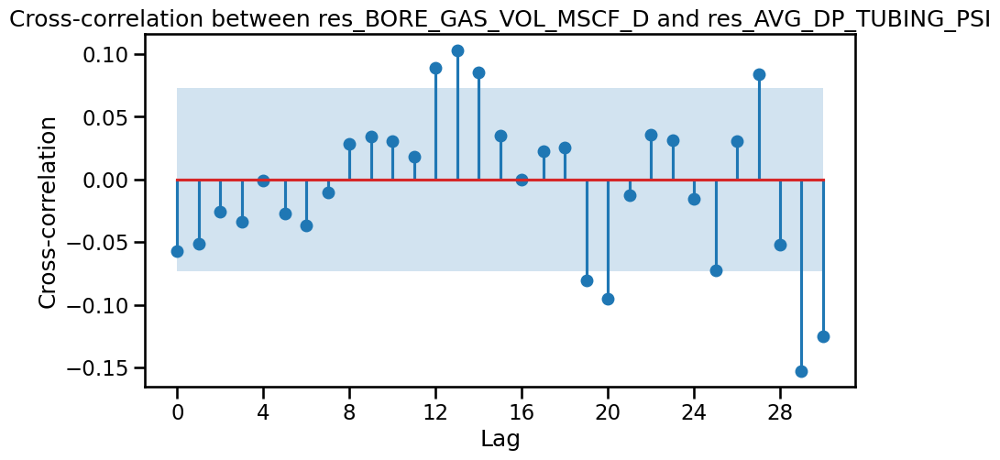

...

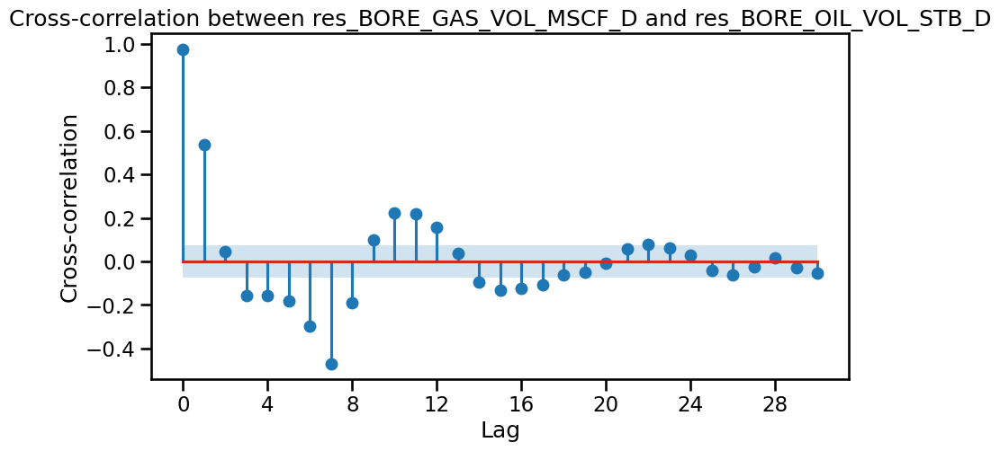

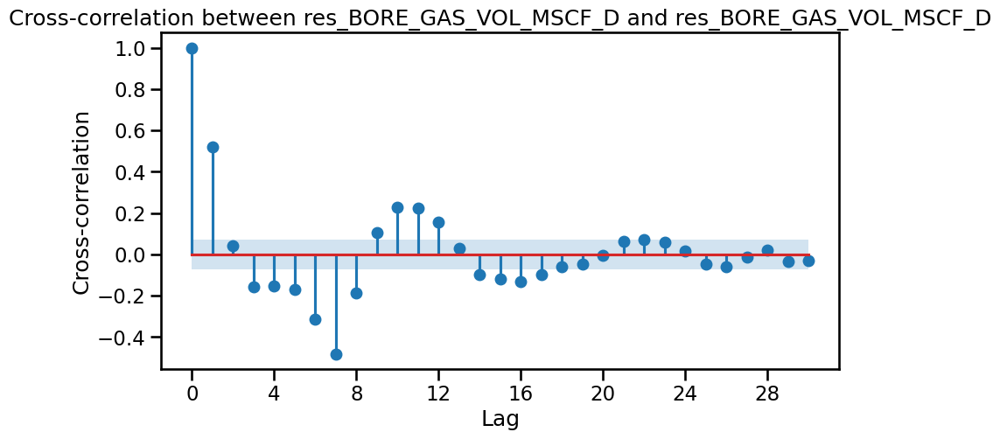

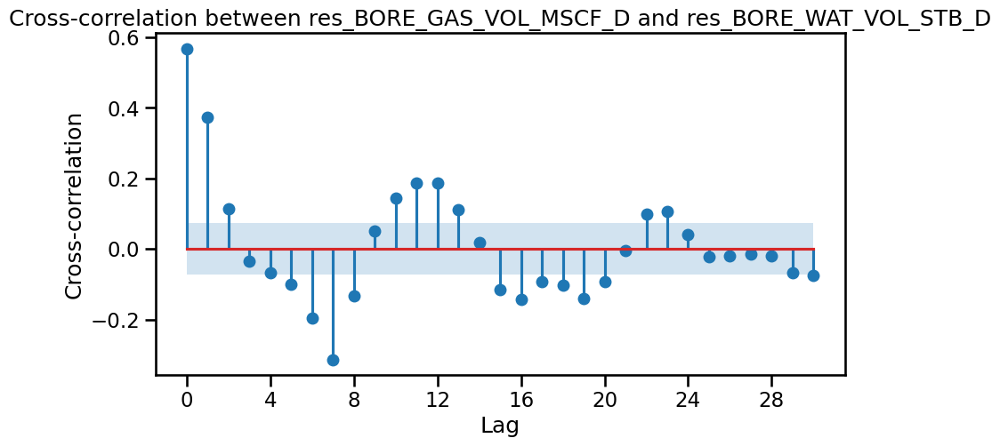

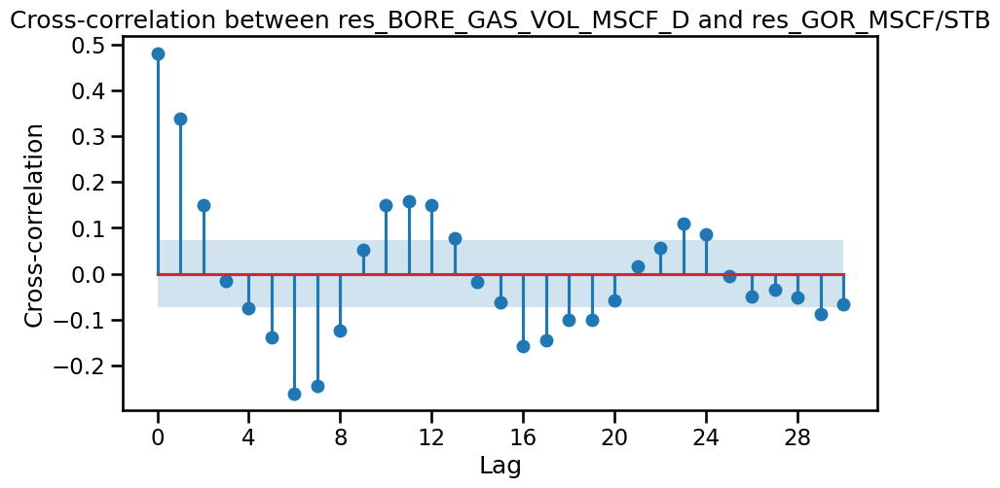

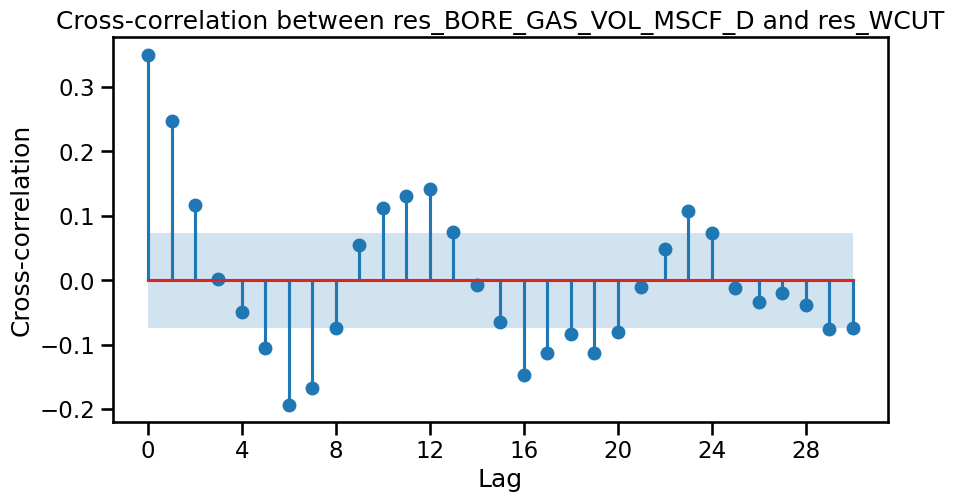

In [45]:
with sns.plotting_context("talk"):
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_GAS_VOL_MSCF_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between res_BORE_GAS_VOL_MSCF_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot 
on_stream: 1 
avg choke, 1 
avg wht_P: 1 
oil:1

#### CCF for water

In [53]:
# target
res_water = STL(df_ccf["BORE_WAT_VOL_STB_D"]).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_AVG_ANNULUS_PRESS_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D
Analyzing components for: res_GOR_MSCF_STB
Analyzing components for: res_WCUT


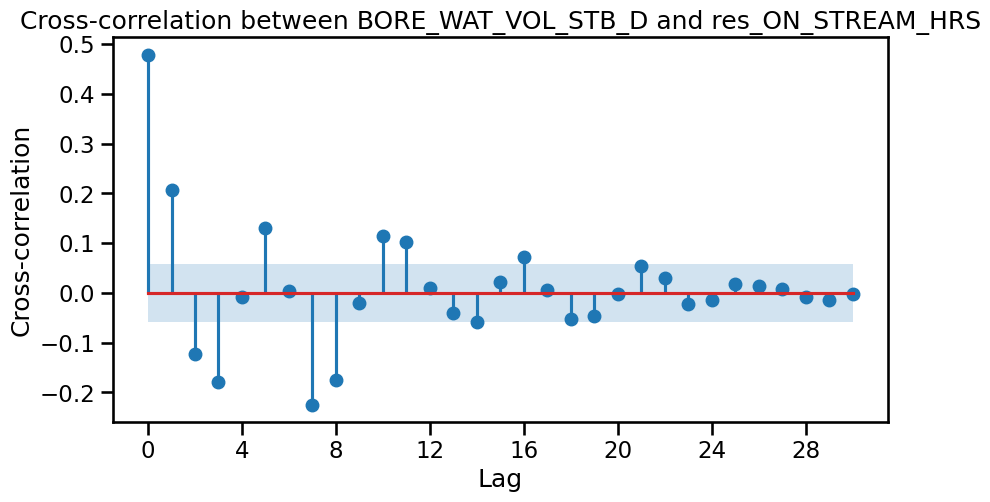

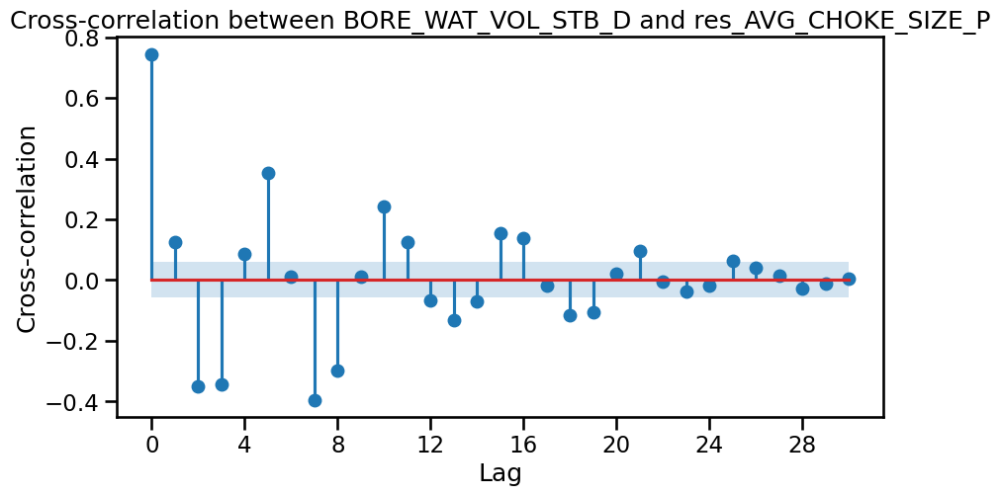

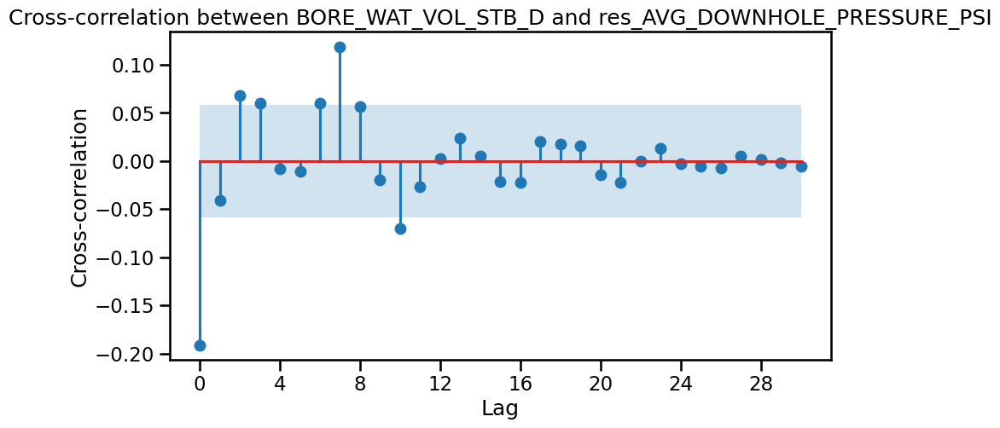

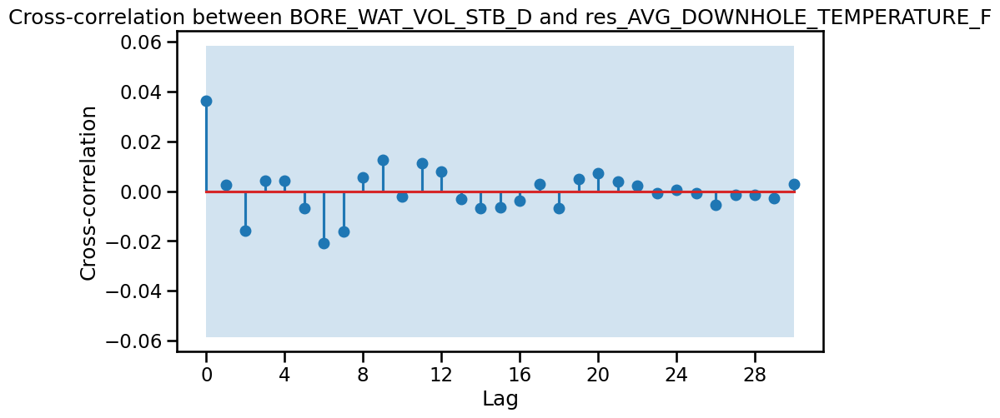

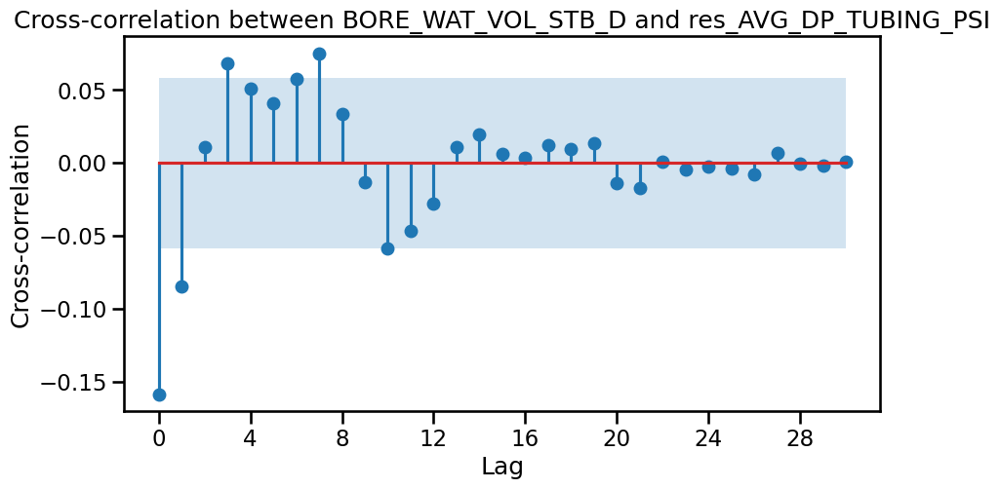

...

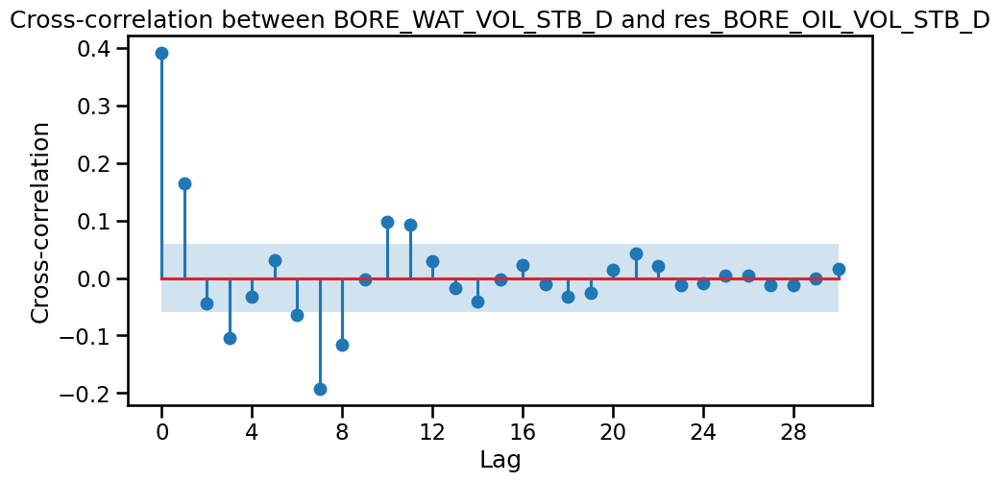

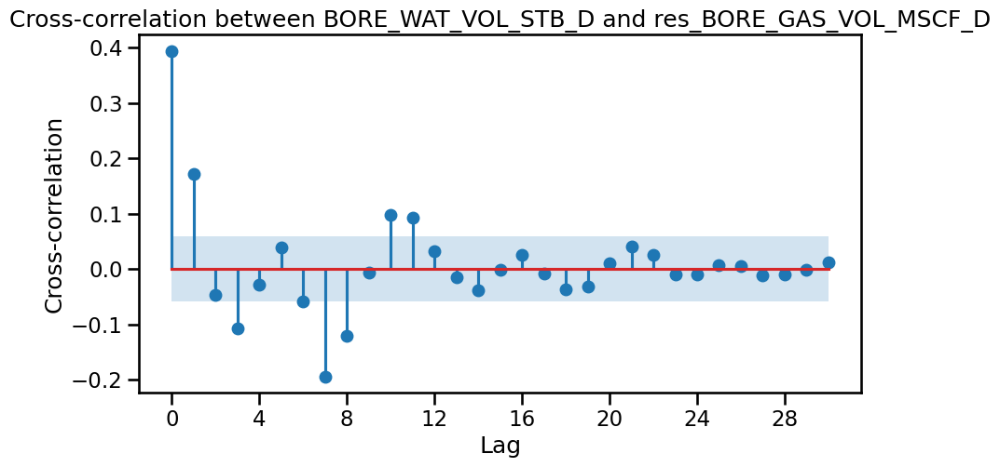

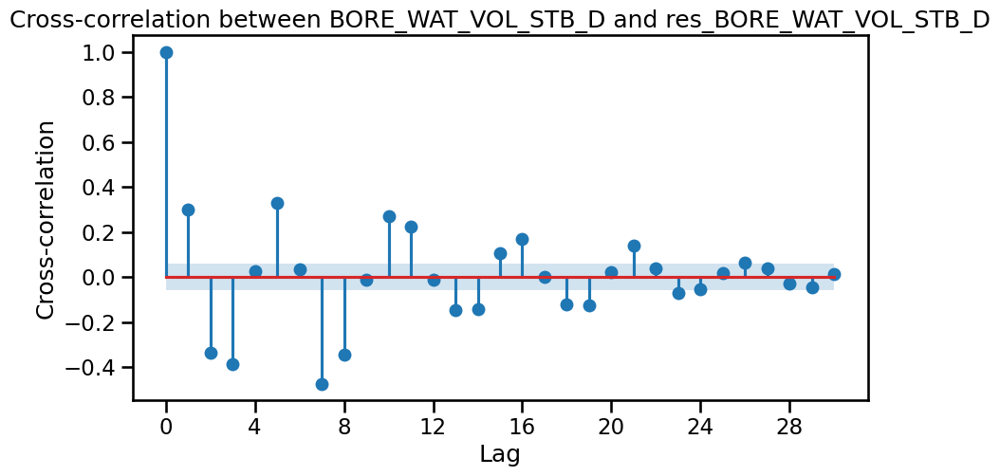

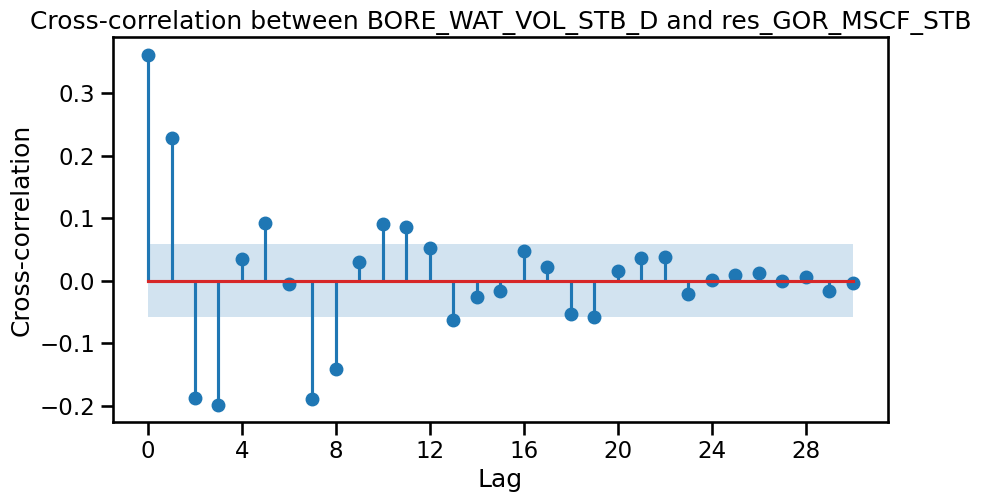

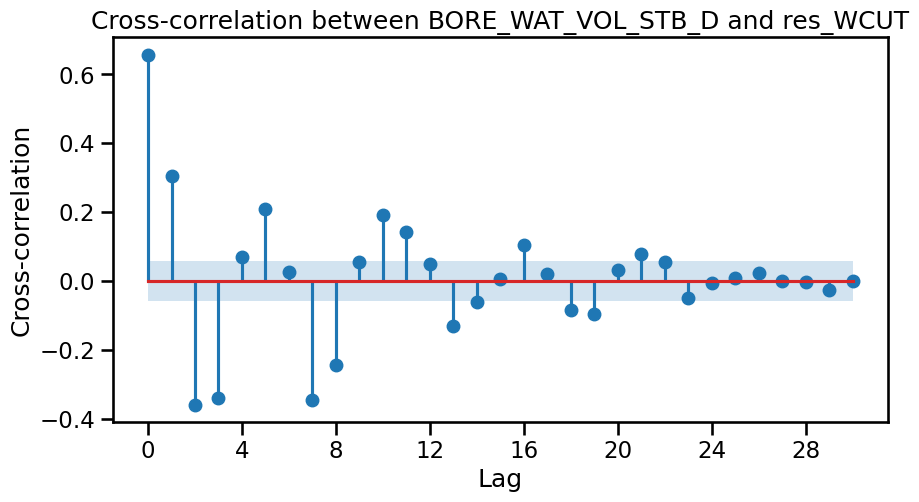

In [54]:
with sns.plotting_context("talk"): 
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_WAT_VOL_STB_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between BORE_WAT_VOL_STB_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot
on_stream: [0] <br>
avg choke, [0]<br>
avg wht_P: [0]<br>


### 2.4 Lasso for feature selection for Lags to use

#### Lags for oil

In [35]:
oil_selected_lag_lasso_adder =LassoSelectedLagFeatureAdder(
    target_col="BORE_OIL_VOL_STB_D",
    variables=df.columns,
    max_lag_days=30,

    # These are removed from Lasso candidates and final forced lags
    #targets_to_remove=["BORE_GAS_VOL_MSCF_D","BORE_WAT_VOL_STB_D",],

    # IMPORTANT!!!!! these are user specified lags that should be kept no matter what. gotten from the PACF or CCF
    force_keep_lag_map={
        "BORE_OIL_VOL_STB_D": [1], # from pacf
        "AVG_CHOKE_SIZE_P": [1], # from ccf
        "AVG_WHT_P": [1],  # from cff
    },
    
    alphas=[ 0.01,0.1, 0.2, 0.3, 0.4, 0.5,0.6, 0.7, 0.8, 0.9, 1.0, 5, 10, 20, 50,75, 100,],
    n_splits=5,
    min_features=5,
    #drop_na=True,
    verbose=True,
)

In [36]:
oil_selected_lag_lasso_adder.fit_transform(df)

/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.527e+04, tolerance: 1.038e+04
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.306e+04, tolerance: 1.618e+04
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider incre

LassoSelectedLagFeatureAdder__Original columns after GOR/WCUT: 14
LassoSelectedLagFeatureAdder__All lag features created: 406
LassoSelectedLagFeatureAdder__Lag features removed from Lasso candidates: 58
LassoSelectedLagFeatureAdder__Candidate lag features used by Lasso: 348
LassoSelectedLagFeatureAdder__Rows used internally for Lasso fit: 1139
LassoSelectedLagFeatureAdder__Best alpha: 75
LassoSelectedLagFeatureAdder__Lasso-selected lag features: 22
LassoSelectedLagFeatureAdder__Force-kept lag features: 3
LassoSelectedLagFeatureAdder__Final selected lag features: 24
LassoSelectedLagFeatureAdder__Final dataframe columns returned: 38


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,ON_STREAM_HRS_lag_6D,BORE_OIL_VOL_STB_D_lag_7D,AVG_DOWNHOLE_TEMPERATURE_F_lag_5D,WCUT_lag_2D,GOR_MSCF_STB_lag_10D,BORE_OIL_VOL_STB_D_lag_29D,BORE_OIL_VOL_STB_D_lag_20D,BORE_OIL_VOL_STB_D_lag_5D,AVG_ANNULUS_PRESS_PSI_lag_17D,AVG_DOWNHOLE_TEMPERATURE_F_lag_7D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,...,24.0,3262.272855,221.425242,0.849155,0.946658,2944.637450,3160.503729,3311.962354,326.537919,221.402727
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,...,24.0,3295.231459,221.436852,0.846654,0.938642,3020.429660,3165.409781,3323.221113,326.465055,221.413718
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,...,24.0,3311.962354,221.448832,0.848125,0.958290,2991.999719,3213.149439,3338.756944,326.302295,221.425242


#### Lags for gas

In [37]:
gas_selected_lag_lasso_adder =LassoSelectedLagFeatureAdder(
    target_col="BORE_GAS_VOL_MSCF_D",
    variables=df.columns,
    max_lag_days=30,

    # These are removed from Lasso candidates and final forced lags. I don't want these to be used to predict the target
    #targets_to_remove=["BORE_OIL_VOL_STB_D","BORE_WAT_VOL_STB_D",],

    # IMPORTANT!!!!! these are user specified lags that should be kept no matter what. gotten from the PACF or CCF
    force_keep_lag_map={
        "BORE_GAS_VOL_MSCF_D": [1], # from pacf
        "AVG_CHOKE_SIZE_P": [1], # from ccf
        "AVG_WHT_P": [1],  # from cff

    },
    
    alphas=[ 0.01,0.1, 0.2, 0.3, 0.4, 0.5,0.6, 0.7, 0.8, 0.9, 1.0, 5, 10, 20, 50,75, 100,],
    n_splits=5,
    min_features=5,
    #drop_na=True,
    verbose=True,
)

In [38]:
gas_selected_lag_lasso_adder.fit_transform(df)

/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.859e+04, tolerance: 7.610e+03
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.250e+06, tolerance: 1.163e+04
  model = cd_fast.enet_coordinate_descent(


LassoSelectedLagFeatureAdder__Original columns after GOR/WCUT: 14
LassoSelectedLagFeatureAdder__All lag features created: 406
LassoSelectedLagFeatureAdder__Lag features removed from Lasso candidates: 58
LassoSelectedLagFeatureAdder__Candidate lag features used by Lasso: 348
LassoSelectedLagFeatureAdder__Rows used internally for Lasso fit: 1139
LassoSelectedLagFeatureAdder__Best alpha: 75
LassoSelectedLagFeatureAdder__Lasso-selected lag features: 21
LassoSelectedLagFeatureAdder__Force-kept lag features: 2
LassoSelectedLagFeatureAdder__Final selected lag features: 23
LassoSelectedLagFeatureAdder__Final dataframe columns returned: 37
Missing force-keep lag features:
['BORE_GAS_VOL_MSCF_D_lag_1D']


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,AVG_ANNULUS_PRESS_PSI_lag_23D,BORE_OIL_VOL_STB_D_lag_20D,BORE_OIL_VOL_STB_D_lag_14D,AVG_DOWNHOLE_TEMPERATURE_F_lag_5D,BORE_OIL_VOL_STB_D_lag_29D,ON_STREAM_HRS_lag_6D,AVG_DP_TUBING_PSI_lag_6D,BORE_OIL_VOL_STB_D_lag_27D,ON_STREAM_HRS_lag_15D,BORE_OIL_VOL_STB_D_lag_11D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,...,322.623984,3160.503729,3191.009307,221.425242,2944.637450,24.0,3292.628095,2991.999719,24.0,3133.268851
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,...,324.881261,3165.409781,3408.448039,221.436852,3020.429660,24.0,3291.845488,3054.709125,24.0,3259.819829
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,...,325.627065,3213.149439,3307.559487,221.448832,2991.999719,24.0,3291.659634,3084.900213,24.0,3292.212350


#### Lags for water

In [39]:
water_selected_lag_lasso_adder =LassoSelectedLagFeatureAdder(
    target_col="BORE_WAT_VOL_STB_D",
    variables=df.columns,
    max_lag_days=30,

    # These are removed from Lasso candidates and final forced lags. I don't want these to be used to predict the target
    #targets_to_remove=["BORE_OIL_VOL_STB_D","BORE_GAS_VOL_MSCF_D",], 

    # IMPORTANT!!!!! these are user specified lags that should be kept no matter what. gotten from the PACF or CCF
    force_keep_lag_map={
        "BORE_WAT_VOL_STB_D": [1], # from pacf
        "ON_STREAM_HRS": [1], # from ccf
        "AVG_CHOKE_SIZE_P": [1], # from ccf
        "AVG_WHT_P": [1],  # from cff
        "WCUT": [1],  # from cff
    },
    
    alphas=[ 0.01,0.1, 0.2, 0.3, 0.4, 0.5,0.6, 0.7, 0.8, 0.9, 1.0, 5, 10, 20, 50,75, 100,],
    n_splits=5,
    min_features=5,
    #drop_na=True,
    verbose=True,
)

In [40]:
water_selected_lag_lasso_adder.fit_transform(df)

/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.429e+02, tolerance: 2.903e+02
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.578e+03, tolerance: 8.370e+02
  model = cd_fast.enet_coordinate_descent(


LassoSelectedLagFeatureAdder__Original columns after GOR/WCUT: 14
LassoSelectedLagFeatureAdder__All lag features created: 406
LassoSelectedLagFeatureAdder__Lag features removed from Lasso candidates: 58
LassoSelectedLagFeatureAdder__Candidate lag features used by Lasso: 348
LassoSelectedLagFeatureAdder__Rows used internally for Lasso fit: 1139
LassoSelectedLagFeatureAdder__Best alpha: 100
LassoSelectedLagFeatureAdder__Lasso-selected lag features: 35
LassoSelectedLagFeatureAdder__Force-kept lag features: 4
LassoSelectedLagFeatureAdder__Final selected lag features: 37
LassoSelectedLagFeatureAdder__Final dataframe columns returned: 51
Missing force-keep lag features:
['BORE_WAT_VOL_STB_D_lag_1D']


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,AVG_DP_TUBING_PSI_lag_7D,AVG_WHP_P_PSI_lag_29D,AVG_DP_TUBING_PSI_lag_6D,ON_STREAM_HRS_lag_9D,AVG_DP_TUBING_PSI_lag_11D,AVG_DOWNHOLE_PRESSURE_PSI_lag_7D,AVG_ANNULUS_PRESS_PSI_lag_26D,ON_STREAM_HRS_lag_8D,WCUT_lag_25D,AVG_WHP_P_PSI_lag_28D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,...,3292.143215,390.875818,3292.628095,24.0,3292.946834,3680.813660,326.375355,24.0,0.849319,392.961029
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,...,3292.628095,392.961029,3291.845488,24.0,3293.675040,3680.501064,325.161998,24.0,0.854699,393.165732
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,...,3291.845488,393.165732,3291.659634,24.0,3293.912790,3680.490591,322.148909,24.0,0.850478,393.201287


## 3. Window Feature

In [41]:
df_win=df.copy()
df_win

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461


### oil

In [42]:
# rolling features
oil_rolling_feat = WindowFeatures(
    variables=["BORE_OIL_VOL_STB_D","GOR_MSCF_STB", "WCUT","AVG_WHT_P"],
    functions=["mean", "std"],
    window=[7],
    freq="1d",# Shift results back by 1 hour to avoid data leakage.
)

df_win = oil_rolling_feat.fit_transform(df_win)
df_win.head(10)

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,GOR_MSCF_STB,WCUT,BORE_OIL_VOL_STB_D_window_7_mean,BORE_OIL_VOL_STB_D_window_7_std,GOR_MSCF_STB_window_7_mean,GOR_MSCF_STB_window_7_std,WCUT_window_7_mean,WCUT_window_7_std,AVG_WHT_P_window_7_mean,AVG_WHT_P_window_7_std
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-10,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-11,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-12,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-13,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-14,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-15,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,0.0
2013-07-16,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,0.0


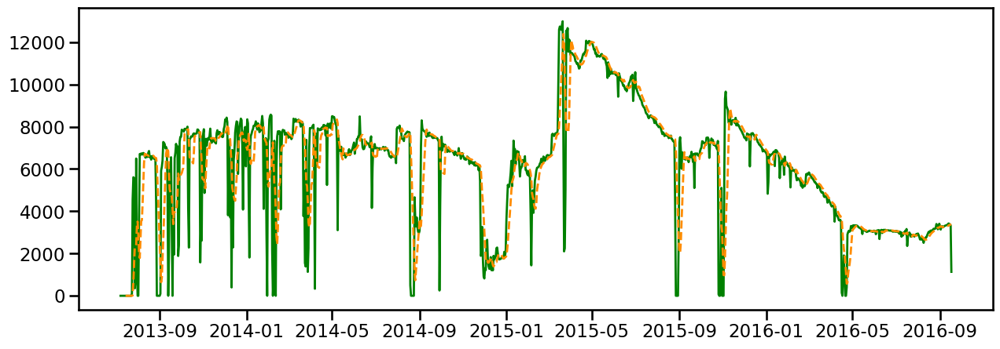

In [43]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_win["BORE_OIL_VOL_STB_D"], label="BORE_OIL_VOL_STB_D", color="green", linewidth=2)
    plt.plot(df_win.index,df_win["BORE_OIL_VOL_STB_D_window_7_mean"],label="BORE_OIL_VOL_STB_D_window_7_mean",color="darkorange",linewidth=2,linestyle="--",)


In [44]:
# expanding window
# This is for both oil gas and water
expanding_feat = ExpandingWindowFeatures(
    variables=["BORE_OIL_VOL_STB_D","BORE_GAS_VOL_MSCF_D", "BORE_WAT_VOL_STB_D"], 
    functions=["sum"], 
    freq="1d" # Shift results back by 1 day to avoid data leakage.
)  

df_win = expanding_feat.fit_transform(df_win)
df_win.head(20)

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,BORE_OIL_VOL_STB_D_window_7_std,GOR_MSCF_STB_window_7_mean,GOR_MSCF_STB_window_7_std,WCUT_window_7_mean,WCUT_window_7_std,AVG_WHT_P_window_7_mean,AVG_WHT_P_window_7_std,BORE_OIL_VOL_STB_D_expanding_sum,BORE_GAS_VOL_MSCF_D_expanding_sum,BORE_WAT_VOL_STB_D_expanding_sum
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.0
2013-07-10,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.0
2013-07-11,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.0
2013-07-12,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.0
2013-07-13,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.0
2013-07-14,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.0
2013-07-15,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.0,32.000000,0.000000,0.000000,0.000000,0.0
2013-07-16,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.0,32.000000,0.000000,0.000000,0.000000,0.0


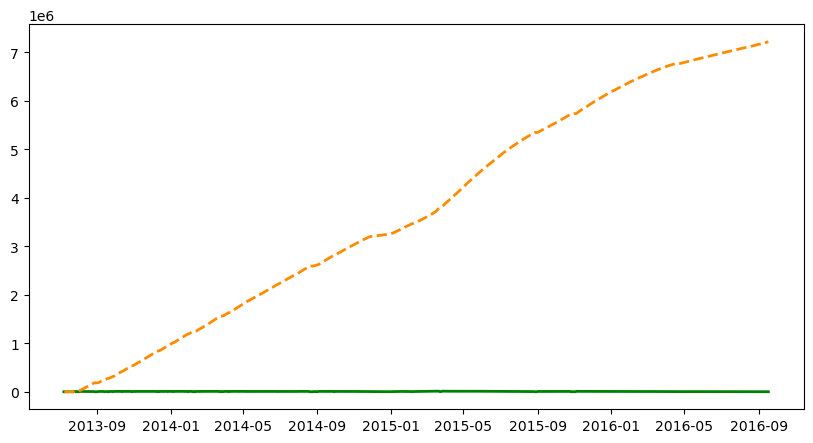

In [45]:
plt.figure(figsize=(10, 5))
plt.plot(df_win.index, df_win["BORE_OIL_VOL_STB_D"], label="BORE_OIL_VOL_STB_D", color="green", linewidth=2)
plt.plot(df_win.index,df_win["BORE_OIL_VOL_STB_D_expanding_sum"],label="BORE_OIL_VOL_STB_D_expanding_mean_y",color="darkorange",linewidth=2,linestyle="--",)


In [53]:
# rolling slope 
# this is for both oil water and gas
slope_feat = RollingSlopeFeatures(
    variables=[
        "BORE_OIL_VOL_STB_D",
        "BORE_GAS_VOL_MSCF_D",
        "BORE_WAT_VOL_STB_D",
        "WCUT",
        "GOR_MSCF_STB",
    ],
    windows=(7, 14, 30),
    periods=1,          # very important: avoids leakage
    drop_original=False,
)
df_win = slope_feat.fit_transform(df_win)
df_win.head(20)

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,AVG_WHT_P_window_7_mean_y,AVG_WHT_P_window_7_std_y,BORE_WAT_VOL_STB_D_window_7_mean,BORE_WAT_VOL_STB_D_window_7_std,GOR_MSCF_STB_window_7_mean,GOR_MSCF_STB_window_7_std,WCUT_window_7_mean,WCUT_window_7_std,AVG_WHT_P_window_7_mean,AVG_WHT_P_window_7_std
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-10,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-11,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-12,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-13,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-14,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-15,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,32.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,32.000000,0.000000
2013-07-16,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,32.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,32.000000,0.000000


### gas

In [47]:
# rolling features
gas_rolling_feat = WindowFeatures(
    variables=["BORE_GAS_VOL_MSCF_D","GOR_MSCF_STB", "WCUT","AVG_WHT_P"],
    functions=["mean", "std"],
    window=[7],
    freq="1d",# Shift results back by 1 hour to avoid data leakage.
)

df_win = gas_rolling_feat.fit_transform(df_win)
df_win.head(10)

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,GOR_MSCF_STB_slope_14D,GOR_MSCF_STB_slope_30D,BORE_GAS_VOL_MSCF_D_window_7_mean,BORE_GAS_VOL_MSCF_D_window_7_std,GOR_MSCF_STB_window_7_mean_y,GOR_MSCF_STB_window_7_std_y,WCUT_window_7_mean_y,WCUT_window_7_std_y,AVG_WHT_P_window_7_mean_y,AVG_WHT_P_window_7_std_y
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-10,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-11,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-12,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-13,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-14,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-15,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,32.0,0.0
2013-07-16,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,32.0,0.0


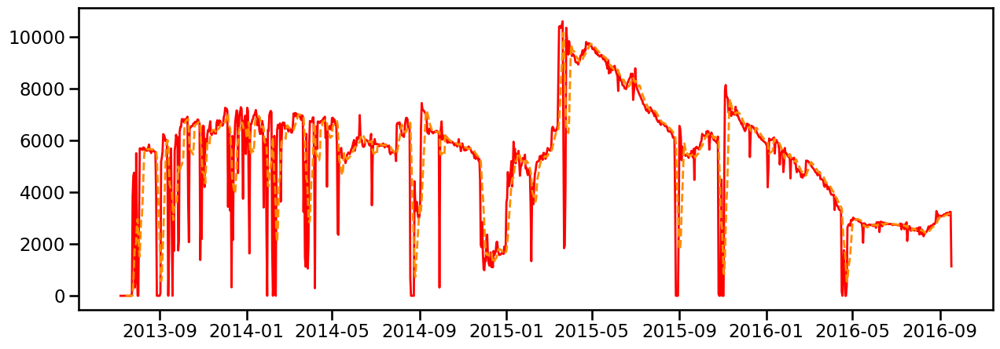

In [48]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_win["BORE_GAS_VOL_MSCF_D"], label="BORE_GAS_VOL_MSCF_D", color="red", linewidth=2)
    plt.plot(df_win.index,df_win["BORE_GAS_VOL_MSCF_D_window_7_mean"],label="BORE_GAS_VOL_MSCF_D_window_7_mean",color="darkorange",linewidth=2,linestyle="--",)

### water

In [49]:
# rolling features
water_rolling_feat = WindowFeatures(
    variables=["BORE_WAT_VOL_STB_D","GOR_MSCF_STB", "WCUT","AVG_WHT_P"],
    functions=["mean", "std"],
    window=[7],
    freq="1d",# Shift results back by 1 hour to avoid data leakage.
)

df_win = water_rolling_feat.fit_transform(df_win)
df_win.head(10)

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,AVG_WHT_P_window_7_mean_y,AVG_WHT_P_window_7_std_y,BORE_WAT_VOL_STB_D_window_7_mean,BORE_WAT_VOL_STB_D_window_7_std,GOR_MSCF_STB_window_7_mean,GOR_MSCF_STB_window_7_std,WCUT_window_7_mean,WCUT_window_7_std,AVG_WHT_P_window_7_mean,AVG_WHT_P_window_7_std
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-10,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-11,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-12,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-13,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-14,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-15,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,0.0
2013-07-16,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,0.0


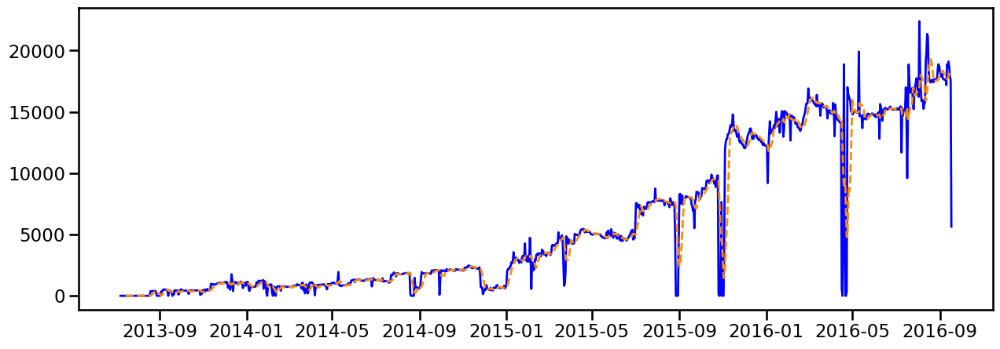

In [50]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_win["BORE_WAT_VOL_STB_D"], label="BORE_WAT_VOL_STB_D", color="blue", linewidth=2)
    plt.plot(df_win.index,df_win["BORE_WAT_VOL_STB_D_window_7_mean"],label="BORE_WAT_VOL_STB_D_window_7_mean",color="darkorange",linewidth=2,linestyle="--",)


In [51]:
# expanding window
#expanding_feat = ExpandingWindowFeatures(
    #variables=["BORE_OIL_VOL_STB_D","BORE_GAS_VOL_MSCF_D", "BORE_WAT_VOL_STB_D"], 
    #functions=["sum"], 
    #freq="1d" # Shift results back by 1 day to avoid data leakage.
#)  

#df_win = expanding_feat.fit_transform(df_win)
#df_win

In [52]:
#plt.figure(figsize=(10, 5))
#plt.plot(df_win.index, df_win["BORE_WAT_VOL_STB_D"], label="BORE_WAT_VOL_STB_D", color="blue", linewidth=2)
#plt.plot(df_win.index,df_win["BORE_WAT_VOL_STB_D_expanding_sum"],label="BORE_WAT_VOL_STB_D_expanding_mean_y",color="darkorange",linewidth=2,linestyle="--",)


## 4. Trend feature

In [54]:
trend_adder = TrendFeatureAdder(
    freq="D",
    degree=2,
    include_bias=False,
    prefix="time_since",
    overwrite=True,
    verbose=True,
)

In [55]:
trend_adder.fit_transform(df)

Trend features added: ['time_since_D', 'time_since_D_power_2']


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT,time_since_D,time_since_D_power_2
DATEPRD,,,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0,4.0
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,9.0
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125,1163.0,1352569.0
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414,1164.0,1354896.0
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461,1165.0,1357225.0


## 5. Seasonality

There are 3 main main to model seasonality. I will take monthly seasonality as an example
1. Integer to represent the month [1,2,3...] This is good for tree based model, but not for linear models
2. Dummies to represent the month. This is good for linear models but not for tree based models because it is sparse.
3. Fourier series. good for linear models and give u less features.
4. Can just only use sine or consine transformation

In [56]:
df_season=df.copy()
df_season

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461


### 5.1 Fourier series 

#### Oil

In [103]:
fourier_alpha_grid = [0.001, 0.01, 0.1, 1.0, 10.0, 20, 30, 50, 100]

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

oil_calendar_fourier_selector = AddSelectedCalendarFourierFeatures(
    target_col="BORE_OIL_VOL_STB_D",
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
)

In [50]:
oil_calendar_fourier_selector.fit_transform(df_season)

/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.918e+06, tolerance: 5.191e+03
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.918e+06, tolerance: 5.191e+03
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider incre

Best seasonality: monthly
Best K: 2
Best alpha: 100
Best CV score: -1811.8209082304468
Candidate Fourier features: 4
Selected Fourier features: 3
Final dataframe columns returned: 16


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT,month_cos_1,month_cos_2,month_sin_2
DATEPRD,,,,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025


#### Gas

In [51]:
fourier_alpha_grid = [0.001, 0.01, 0.1, 1.0, 10.0, 20, 30, 50, 100]

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

gas_calendar_fourier_selector = AddSelectedCalendarFourierFeatures(
    target_col="BORE_GAS_VOL_MSCF_D",
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
)

In [52]:
gas_calendar_fourier_selector.fit_transform(df_season)

/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.922e+06, tolerance: 3.331e+03
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.564e+05, tolerance: 6.239e+03
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider incre

Best seasonality: monthly
Best K: 2
Best alpha: 100
Best CV score: -1469.8932071154475
Candidate Fourier features: 4
Selected Fourier features: 2
Final dataframe columns returned: 15


/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.832e+04, tolerance: 3.331e+03
  model = cd_fast.enet_coordinate_descent(


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT,month_cos_1,month_cos_2
DATEPRD,,,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5


#### Water

In [53]:
fourier_alpha_grid = [0.001, 0.01, 0.1, 1.0, 10.0, 20, 30, 50, 100]

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

water_calendar_fourier_selector = AddSelectedCalendarFourierFeatures(
    target_col="BORE_WAT_VOL_STB_D",
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
)

In [54]:
water_calendar_fourier_selector.fit_transform(df_season)


/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.668e+03, tolerance: 2.007e+03
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.627e+04, tolerance: 2.007e+03
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider incre

Best seasonality: monthly
Best K: 9
Best alpha: 0.01
Best CV score: -2347.174820817685
Candidate Fourier features: 18
Selected Fourier features: 17
Final dataframe columns returned: 30


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,month_sin_5,month_sin_4,month_sin_1,month_cos_4,month_sin_7,month_cos_8,month_cos_9,month_cos_7,month_sin_9,month_sin_8
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025


### 5.2 datetime from feature engine

In [57]:
# Interger for datetime

In [58]:
week_month_of_year_adder = DatetimeFeatures(
    variables="index",
    features_to_extract=["week", "month"],
    drop_original=False
)

In [59]:
df_season = week_month_of_year_adder.fit_transform(df_season)

In [60]:
df_season

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT,week,month
DATEPRD,,,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28,7
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28,7
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28,7
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28,7
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125,37,9
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414,37,9
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461,37,9


## 6. Create Final lags columns that I am interested in shifted by 1 day

In [61]:
df_create_1_day=df.copy()

In [62]:
#Based on my domain knowlege these are variables I know that will be strong predictors. So I want these variables to be there, to prevent data leakage, I have shifted by 1 day

specific_lag1_adder = AddSpecificLag1Features(
    variables=['ON_STREAM_HRS', 'BORE_OIL_VOL_STB_D','BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
    freq="1D",
    verbose=True,
)

In [63]:
df_create_1_day=specific_lag1_adder.fit_transform(df_create_1_day)
(df_create_1_day.columns, len(df_create_1_day.columns))

AddSpecificLag1Features__Requested variables: 6
AddSpecificLag1Features__Existing lag columns skipped: 0
AddSpecificLag1Features__New lag columns to add: 6
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


(Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
        'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
        'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
        'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
        'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT', 'ON_STREAM_HRS_lag_1D',
        'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D',
        'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D'],
       dtype='object'),
 20)

In [64]:
df_create_1_day_use=df_create_1_day.copy()

## 7.Drop Features

I am going to use this to drop columns that will result in data leakage. I am not too sure about ON_STREAM_HRS for now, but I will remove it for now. For each phase, I will have to keep the target

### OIL

In [65]:
df_create_1_day_use=df_create_1_day.copy()
df_create_1_day_use.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT', 'ON_STREAM_HRS_lag_1D',
       'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D',
       'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D'],
      dtype='object')

In [66]:
oil_column_dropper = DropFeatures(
    features_to_drop=[
        #"BORE_OIL_VOL_STB_D",
        "BORE_GAS_VOL_MSCF_D",
        "BORE_WAT_VOL_STB_D",
        "GOR_MSCF_STB",
        "WCUT",
        "ON_STREAM_HRS",
        'AVG_CHOKE_SIZE_P','AVG_DOWNHOLE_PRESSURE_PSI','AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI','AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI','AVG_WHT_P',
    ]
)

In [67]:
df_create_1_day_use=oil_column_dropper.fit_transform(df_create_1_day_use)
(df_create_1_day_use.columns, len(df_create_1_day_use.columns))

(Index(['BORE_OIL_VOL_STB_D', 'ON_STREAM_HRS_lag_1D',
        'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D',
        'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D'],
       dtype='object'),
 7)

### GAS

In [68]:
df_create_1_day_use=df_create_1_day.copy()

In [69]:
gas_column_dropper = DropFeatures(
    features_to_drop=[
        "BORE_OIL_VOL_STB_D",
        #"BORE_GAS_VOL_MSCF_D",
        "BORE_WAT_VOL_STB_D",
        "GOR_MSCF_STB",
        "WCUT",
        "ON_STREAM_HRS",
        'AVG_CHOKE_SIZE_P','AVG_DOWNHOLE_PRESSURE_PSI','AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI','AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI','AVG_WHT_P',
    ]
)

In [70]:
df_create_1_day_use=gas_column_dropper.fit_transform(df_create_1_day_use)
(df_create_1_day_use.columns, len(df_create_1_day_use.columns))

(Index(['BORE_GAS_VOL_MSCF_D', 'ON_STREAM_HRS_lag_1D',
        'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D',
        'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D'],
       dtype='object'),
 7)

### WATER

In [71]:
df_create_1_day_use=df_create_1_day.copy()

In [72]:
water_column_dropper = DropFeatures(
    features_to_drop=[
        "BORE_OIL_VOL_STB_D",
        "BORE_GAS_VOL_MSCF_D",
        #"BORE_WAT_VOL_STB_D",
        "GOR_MSCF_STB",
        "WCUT",
        "ON_STREAM_HRS",
        'AVG_CHOKE_SIZE_P','AVG_DOWNHOLE_PRESSURE_PSI','AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI','AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI','AVG_WHT_P',
    ]
)

In [73]:
df_create_1_day_use=water_column_dropper.fit_transform(df_create_1_day_use)
(df_create_1_day_use.columns, len(df_create_1_day_use.columns))

(Index(['BORE_WAT_VOL_STB_D', 'ON_STREAM_HRS_lag_1D',
        'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D',
        'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D'],
       dtype='object'),
 7)

# BREAKER

In [74]:
#------------------------------------------------------------------------------------#

# SPLIT DATA

In [75]:
from sarima_helper_functions import sarima_split_train_test_keep

train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df, 0.6,0.15,0.15)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_date=keep_data.index[0]
len(df)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)

max_lookback = 30 # largest lag / rolling / expanding history needed
#val
shifted_start_val = pd.Timestamp(start_of_val_date) - pd.offsets.Day(max_lookback)
X_val_shift = df[(df.index >= shifted_start_val) & (df.index < start_of_test_date)]
#test
shifted_start_test = pd.Timestamp(start_of_test_date) - pd.offsets.Day(max_lookback)
X_test_shift = df[(df.index >= shifted_start_test) & (df.index < start_of_keep_date)]
#keep
shifted_start_keep = pd.Timestamp(start_of_keep_date) - pd.offsets.Day(max_lookback)
X_keep_shift = df[(df.index >= shifted_start_keep) ]

#display(train_data, X_val_shift, X_test_shift,X_keep_shift)

# PIPELINE FOR FEATURE ENGINEERING & MODELS ONE-STEP LOOK AHEAD

## Make Oil Pipeline 

In [168]:
#pipeline = clone(pipeline)

In [169]:
# feature engine transformer to drop all nan
final_nan_dropper = DropMissingData()

In [139]:
oil_feature_pipe = Pipeline(
    [
        ("Create_GOR_WCUT_features", clone(GOR_WCUT_feat)),
        ("added_oil_lag_features", oil_selected_lag_lasso_adder),
        ("added_rolling_window_features", oil_rolling_feat),
        ("added_expanding_window_features", clone(expanding_feat)),
        ("added_RollingSlopeFeatures", clone(slope_feat)),
        ("added_Time_features", clone(trend_adder)),
        #("added_oil_calendar_fourier_selector", oil_calendar_fourier_selector),
        ("added_week_month_of_year_adder", clone(week_month_of_year_adder)),
        ("final_lagged_columns_by_1day", clone(specific_lag1_adder)),
        ("oil_final_column_dropper", oil_column_dropper),
        ("drop_missing_rows_once", clone(final_nan_dropper)),
    ]
)

### Train Oil Pipe Line

In [140]:
train_feat_oil= oil_feature_pipe.fit_transform(train_data)
# comments below are only from oil_selected_lag_lasso_adder

LassoSelectedLagFeatureAdder__Original columns after GOR/WCUT: 14
LassoSelectedLagFeatureAdder__All lag features created: 406
LassoSelectedLagFeatureAdder__Lag features removed from Lasso candidates: 58
LassoSelectedLagFeatureAdder__Candidate lag features used by Lasso: 348
LassoSelectedLagFeatureAdder__Rows used internally for Lasso fit: 672
LassoSelectedLagFeatureAdder__Best alpha: 100
LassoSelectedLagFeatureAdder__Lasso-selected lag features: 22
LassoSelectedLagFeatureAdder__Force-kept lag features: 3
LassoSelectedLagFeatureAdder__Final selected lag features: 24
LassoSelectedLagFeatureAdder__Final dataframe columns returned: 38
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__Requested variables: 6
AddSpecificLag1Features__Existing lag columns skipped: 1
AddSpecificLag1Features__New lag columns to add: 5
Skipped existing lag columns:
['BORE_OIL_VOL_STB_D_lag_1D']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS

In [141]:
train_feat_oil

,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_1D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,AVG_ANNULUS_PRESS_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_9D,AVG_DOWNHOLE_TEMPERATURE_F_lag_10D,AVG_CHOKE_SIZE_P_lag_7D,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_4D,...,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,ON_STREAM_HRS_lag_1D,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-08-07,6729.845108,6732.927115,9.882110,134.985209,409.866972,777.357618,32.000000,2.540804,3938.665749,3711.553983,...,0.034862,30.0,900.0,32,8,24.00000,5683.946874,0.000000,0.844201,0.000000
2013-08-08,6681.161978,6729.845108,9.788963,137.078370,320.339563,6493.474048,32.000000,0.003600,3931.568127,6707.830773,...,0.035727,31.0,961.0,32,8,24.00000,5658.561608,0.000000,0.840816,0.000000
2013-08-09,6755.255940,6681.161978,9.784328,137.528721,320.167983,1197.265333,126.996233,0.000000,3926.041233,6664.745574,...,0.036233,32.0,1024.0,32,8,24.00000,5632.121139,0.000000,0.842985,0.000000
2013-08-10,6731.983643,6755.255940,9.914905,135.907694,336.283279,0.000000,221.992466,6.116182,3919.579878,6732.927115,...,0.036395,33.0,1089.0,32,8,24.00000,5727.930627,0.000000,0.847922,0.000000
2013-08-11,6630.025823,6731.983643,9.880804,137.167436,352.211458,0.000000,215.953196,9.951288,3915.926537,6729.845108,...,0.036193,34.0,1156.0,32,8,24.00000,5720.946438,0.000000,0.849816,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-06-04,10434.983484,10484.484289,20.800310,168.937680,286.635285,10730.101370,222.521279,20.909463,3190.924836,10514.675377,...,0.000574,696.0,484416.0,23,6,24.00000,8741.192719,5033.797841,0.833727,0.324379
2015-06-05,10463.539222,10434.983484,20.733070,168.846186,286.310517,10484.484289,222.526589,20.704151,3191.704010,10584.680962,...,0.000614,697.0,485809.0,23,6,24.00000,8663.779012,4855.796218,0.830263,0.317564
2015-06-06,10385.797170,10463.539222,20.804389,167.542733,281.972213,10727.396751,222.527040,20.765410,3188.174541,10586.505007,...,0.000562,698.0,487204.0,23,6,24.00000,8560.012769,4681.757175,0.818080,0.309123


In [142]:
train_feat_oil.columns

Index(['BORE_OIL_VOL_STB_D', 'BORE_OIL_VOL_STB_D_lag_1D',
       'AVG_CHOKE_SIZE_P_lag_1D', 'AVG_WHT_P_lag_1D',
       'AVG_ANNULUS_PRESS_PSI_lag_1D', 'BORE_OIL_VOL_STB_D_lag_9D',
       'AVG_DOWNHOLE_TEMPERATURE_F_lag_10D', 'AVG_CHOKE_SIZE_P_lag_7D',
       'AVG_DOWNHOLE_PRESSURE_PSI_lag_1D', 'BORE_OIL_VOL_STB_D_lag_4D',
       'AVG_DOWNHOLE_TEMPERATURE_F_lag_11D', 'AVG_ANNULUS_PRESS_PSI_lag_17D',
       'AVG_DOWNHOLE_TEMPERATURE_F_lag_8D', 'AVG_CHOKE_SIZE_P_lag_20D',
       'AVG_DOWNHOLE_TEMPERATURE_F_lag_13D', 'GOR_MSCF_STB_lag_10D',
       'BORE_OIL_VOL_STB_D_lag_14D', 'AVG_ANNULUS_PRESS_PSI_lag_23D',
       'BORE_OIL_VOL_STB_D_lag_11D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_5D',
       'AVG_DP_TUBING_PSI_lag_6D', 'AVG_CHOKE_SIZE_P_lag_19D',
       'AVG_DP_TUBING_PSI_lag_1D', 'ON_STREAM_HRS_lag_6D',
       'ON_STREAM_HRS_lag_15D', 'BORE_OIL_VOL_STB_D_window_7_mean',
       'BORE_OIL_VOL_STB_D_window_7_std', 'GOR_MSCF_STB_window_7_mean',
       'GOR_MSCF_STB_window_7_std', 'WCUT_window_7_

In [143]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back 
val_feat_with_context_oil=oil_feature_pipe.transform(X_val_shift)
# Remove context rows
val_feat_oil = val_feat_with_context_oil[val_feat_with_context_oil.index >= start_of_val_date]
val_feat_oil

Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_1D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,AVG_ANNULUS_PRESS_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_9D,AVG_DOWNHOLE_TEMPERATURE_F_lag_10D,AVG_CHOKE_SIZE_P_lag_7D,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_4D,...,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,ON_STREAM_HRS_lag_1D,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2015-06-09,10411.270901,10524.864869,20.917322,169.271611,277.076809,10514.675377,222.512814,20.863918,3193.914172,10463.539222,...,0.000595,701.0,491401.0,24,6,24.0,8595.416816,4782.834422,0.816677,0.312446
2015-06-10,10271.385526,10411.270901,20.796326,169.841028,276.586674,10584.680962,222.517052,20.800310,3191.699299,10385.797170,...,0.000520,702.0,492804.0,24,6,24.0,8493.841850,4631.061307,0.815831,0.307869
2015-06-11,10165.339330,10271.385526,20.646401,169.705685,273.442060,10586.505007,222.516029,20.733070,3194.629466,9417.921207,...,0.000434,703.0,494209.0,24,6,24.0,8373.348800,4503.126571,0.815211,0.304790
2015-06-12,10166.031209,10165.339330,20.629808,169.421493,272.202877,10484.484289,222.516475,20.804389,3193.116626,10524.864869,...,0.000354,704.0,495616.0,24,6,24.0,8306.275237,4891.396543,0.817117,0.324864
2015-06-13,10048.852048,10166.031209,20.576210,169.401049,270.272270,10434.983484,222.509175,20.684055,3192.688854,10411.270901,...,0.000278,705.0,497025.0,24,6,24.0,8327.856757,4497.088354,0.819185,0.306694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-11-26,7865.910590,7918.933688,100.000000,176.877453,159.268397,8253.111293,223.116471,100.000000,3191.159063,8056.617629,...,0.021383,871.0,758641.0,48,11,24.0,6756.081390,12506.406612,0.853155,0.612299
2015-11-27,7805.591312,7865.910590,100.000000,175.137305,158.716250,8165.934527,223.115703,100.000000,3190.275211,8077.311104,...,0.017347,872.0,760384.0,48,11,24.0,6728.939571,12641.134342,0.855456,0.616429
2015-11-28,7740.869167,7805.591312,100.000000,173.504120,157.719893,8416.897946,223.134595,100.000000,3195.420860,8005.921760,...,0.012887,873.0,762129.0,48,11,24.0,6625.583332,12447.030805,0.848825,0.614589


In [144]:

#val_pred = best_lasso_model.predict(X_val)

#val_pred_df = pd.DataFrame(
    #val_pred,
    #index=X_val.index,
    #columns=target_cols,
#)

#val_metrics = []

#for col in target_cols:
    #val_metrics.append(
        #{
            #"Phase": col,
            #"Val_RMSE": root_mean_squared_error(y_val[col], val_pred_df[col]),
            #"Val_MAE": mean_absolute_error(y_val[col], val_pred_df[col]),
            #"Val_R2": r2_score(y_val[col], val_pred_df[col]),
        #}
    #)

#val_metrics_df = pd.DataFrame(val_metrics)
#val_metrics_df

In [145]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back 
test_feat_with_context_oil=oil_feature_pipe.transform(X_test_shift)
# Remove context rows
test_feat_oil = test_feat_with_context_oil[test_feat_with_context_oil.index >= start_of_test_date]
test_feat_oil

Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_1D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,AVG_ANNULUS_PRESS_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_9D,AVG_DOWNHOLE_TEMPERATURE_F_lag_10D,AVG_CHOKE_SIZE_P_lag_7D,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_4D,...,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,ON_STREAM_HRS_lag_1D,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2015-12-01,7490.471831,7599.662933,100.0,176.662475,155.763098,8056.617629,223.053748,100.0,3195.424537,7805.591312,...,0.010585,876.0,767376.0,49,12,24.0,6494.103173,12191.287131,0.854525,0.616003
2015-12-02,7458.142208,7490.471831,100.0,176.646523,156.526046,8077.311104,223.043068,100.0,3196.910201,7740.869167,...,0.005447,877.0,769129.0,49,12,24.0,6436.054281,12058.886630,0.859232,0.616843
2015-12-03,7481.351606,7458.142208,100.0,172.659338,155.756196,8005.921760,223.041323,100.0,3202.086679,7660.988580,...,-0.000115,878.0,770884.0,49,12,24.0,6360.309194,12037.186786,0.852801,0.617440
2015-12-04,7351.404132,7481.351606,100.0,176.652111,156.139018,7918.933688,223.024490,100.0,3203.895364,7599.662933,...,-0.000032,879.0,772641.0,49,12,24.0,6405.350622,12099.141414,0.856176,0.617918
2015-12-05,7681.430463,7351.404132,100.0,174.314920,155.144858,7865.910590,223.008665,100.0,3193.276424,7490.471831,...,0.000175,880.0,774400.0,49,12,24.0,6576.321444,12487.788774,0.894567,0.629450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-05-19,3067.037152,3095.970278,100.0,180.072029,325.027194,3228.559473,221.254470,100.0,3626.024105,2923.000503,...,0.007464,1046.0,1094116.0,20,5,24.0,2793.252217,14458.071756,0.902222,0.823632
2016-05-20,3062.760081,3067.037152,100.0,180.167742,322.587606,3217.615204,221.260085,100.0,3626.766896,3164.088921,...,0.008585,1047.0,1096209.0,20,5,24.0,2774.477157,14408.256461,0.904612,0.824493
2016-05-21,3019.423291,3062.760081,100.0,179.289198,323.579104,3191.009307,221.267054,100.0,3627.576372,3112.952765,...,0.009924,1048.0,1098304.0,20,5,24.0,2734.531994,14387.122700,0.892833,0.824482


In [146]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back 
keep_feat_with_context_oil=oil_feature_pipe.transform(X_keep_shift)
# Remove context rows
keep_feat_oil = keep_feat_with_context_oil[keep_feat_with_context_oil.index >= start_of_keep_date]
keep_feat_oil

Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_1D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,AVG_ANNULUS_PRESS_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_9D,AVG_DOWNHOLE_TEMPERATURE_F_lag_10D,AVG_CHOKE_SIZE_P_lag_7D,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_4D,...,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,ON_STREAM_HRS_lag_1D,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2016-05-24,3066.282375,3045.526002,100.0,180.734522,323.819390,2923.000503,221.280128,100.0,3630.675353,3062.760081,...,-0.000868,1051.0,1104601.0,21,5,24.0,2725.773948,14858.040774,0.895009,0.829893
2016-05-25,3079.239384,3066.282375,100.0,180.094687,321.136169,3164.088921,221.268453,100.0,3631.350094,3019.423291,...,-0.000675,1052.0,1106704.0,21,5,24.0,2743.056256,14825.899845,0.894587,0.828624
2016-05-26,3079.931263,3079.239384,100.0,180.675939,323.412190,3112.952765,221.290017,100.0,3632.085963,3033.323771,...,-0.000538,1053.0,1108809.0,21,5,24.0,2743.831061,14751.239801,0.891074,0.827305
2016-05-27,3050.620748,3079.931263,100.0,180.866082,326.641615,3095.970278,221.298692,100.0,3631.287761,3045.526002,...,-0.000409,1054.0,1110916.0,21,5,24.0,2745.241177,14770.801110,0.891332,0.827462
2016-05-28,3061.061833,3050.620748,100.0,180.861593,326.717539,3067.037152,221.302657,100.0,3630.492490,3066.282375,...,-0.000218,1055.0,1113025.0,21,5,24.0,2726.581595,14750.107635,0.893779,0.828624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,3420.461576,3376.181314,100.0,182.757364,325.713737,3292.212350,221.363719,100.0,3679.006463,3323.221113,...,0.003563,1163.0,1352569.0,37,9,24.0,3206.928260,18640.606712,0.949868,0.846654
2016-09-14,3408.322243,3420.461576,100.0,182.877181,327.266617,3235.541162,221.379123,100.0,3675.254532,3338.756944,...,0.003192,1164.0,1354896.0,37,9,24.0,3109.182468,19101.083702,0.908995,0.848125
2016-09-15,3364.230675,3408.322243,100.0,184.603987,329.529739,3262.272855,221.391649,100.0,3672.505971,3353.349303,...,0.002992,1165.0,1357225.0,37,9,24.0,3184.996419,18639.789037,0.934476,0.845414


In [147]:
target_col = "BORE_OIL_VOL_STB_D"

X_train_oil = train_feat_oil.drop(columns=[target_col])
y_train_oil = train_feat_oil[target_col]

X_val_oil = val_feat_oil.drop(columns=[target_col])
y_val_oil = val_feat_oil[target_col]

X_test_oil = test_feat_oil.drop(columns=[target_col])
y_test_oil = test_feat_oil[target_col]

X_keep_oil = keep_feat_oil.drop(columns=[target_col])
y_keep_oil = keep_feat_oil[target_col]

In [148]:
assert X_train_oil.index.max() < X_val_oil.index.min()
assert X_val_oil.index.max() < X_test_oil.index.min()
assert X_test_oil.index.max() < X_keep_oil.index.min()

## Make Gas Pipeline 

In [149]:
# feature engine transformer to drop all nan
final_nan_dropper = DropMissingData()

In [150]:
gas_feature_pipe = Pipeline(
    [
        ("Create_GOR_WCUT_features", clone(GOR_WCUT_feat)),
        ("added_gas_lag_features", gas_selected_lag_lasso_adder),
        ("added_rolling_window_features", gas_rolling_feat),
        ("added_expanding_window_features", clone(expanding_feat)),
        ("added_RollingSlopeFeatures", clone(slope_feat)),
        ("added_Time_features", clone(trend_adder)),
        #("added_gas_calendar_fourier_selector", gas_calendar_fourier_selector),
        ("added_week_month_of_year_adder", clone(week_month_of_year_adder)),
        ("final_lagged_columns_by_1day", clone(specific_lag1_adder)),
        ("gas_final_column_dropper", gas_column_dropper),
        ("drop_missing_rows_once", clone(final_nan_dropper)),
    ]
)

### Train Gas Pipe Line

In [151]:
train_feat_gas= gas_feature_pipe.fit_transform(train_data)

LassoSelectedLagFeatureAdder__Original columns after GOR/WCUT: 14
LassoSelectedLagFeatureAdder__All lag features created: 406
LassoSelectedLagFeatureAdder__Lag features removed from Lasso candidates: 58
LassoSelectedLagFeatureAdder__Candidate lag features used by Lasso: 348
LassoSelectedLagFeatureAdder__Rows used internally for Lasso fit: 672
LassoSelectedLagFeatureAdder__Best alpha: 100
LassoSelectedLagFeatureAdder__Lasso-selected lag features: 21
LassoSelectedLagFeatureAdder__Force-kept lag features: 2
LassoSelectedLagFeatureAdder__Final selected lag features: 23
LassoSelectedLagFeatureAdder__Final dataframe columns returned: 37
Missing force-keep lag features:
['BORE_GAS_VOL_MSCF_D_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__Requested variables: 6
AddSpecificLag1Features__Existing lag columns skipped: 1
AddSpecificLag1Features__New lag columns to add: 5
Skipped existing lag columns:
['BORE_OIL_VOL_STB_D_lag_1D']
AddSpecificLag1Fea

In [152]:
train_feat_gas

,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,BORE_OIL_VOL_STB_D_lag_1D,BORE_OIL_VOL_STB_D_lag_9D,AVG_ANNULUS_PRESS_PSI_lag_1D,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,AVG_DOWNHOLE_TEMPERATURE_F_lag_10D,BORE_OIL_VOL_STB_D_lag_4D,AVG_ANNULUS_PRESS_PSI_lag_17D,...,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,ON_STREAM_HRS_lag_1D,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-08-07,5658.561608,9.882110,134.985209,6732.927115,777.357618,409.866972,3938.665749,32.000000,3711.553983,0.000000,...,0.034862,30.0,900.0,32,8,24.00000,5683.946874,0.000000,0.844201,0.000000
2013-08-08,5632.121139,9.788963,137.078370,6729.845108,6493.474048,320.339563,3931.568127,32.000000,6707.830773,0.000000,...,0.035727,31.0,961.0,32,8,24.00000,5658.561608,0.000000,0.840816,0.000000
2013-08-09,5727.930627,9.784328,137.528721,6681.161978,1197.265333,320.167983,3926.041233,126.996233,6664.745574,20.924342,...,0.036233,32.0,1024.0,32,8,24.00000,5632.121139,0.000000,0.842985,0.000000
2013-08-10,5720.946438,9.914905,135.907694,6755.255940,0.000000,336.283279,3919.579878,221.992466,6732.927115,41.848684,...,0.036395,33.0,1089.0,32,8,24.00000,5727.930627,0.000000,0.847922,0.000000
2013-08-11,5653.710781,9.880804,137.167436,6731.983643,0.000000,352.211458,3915.926537,215.953196,6729.845108,282.309360,...,0.036193,34.0,1156.0,32,8,24.00000,5720.946438,0.000000,0.849816,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-06-04,8663.779012,20.800310,168.937680,10484.484289,10730.101370,286.635285,3190.924836,222.521279,10514.675377,165.256095,...,0.000574,696.0,484416.0,23,6,24.00000,8741.192719,5033.797841,0.833727,0.324379
2015-06-05,8560.012769,20.733070,168.846186,10434.983484,10484.484289,286.310517,3191.704010,222.526589,10584.680962,164.487581,...,0.000614,697.0,485809.0,23,6,24.00000,8663.779012,4855.796218,0.830263,0.317564
2015-06-06,8492.059164,20.804389,167.542733,10463.539222,10727.396751,281.972213,3188.174541,222.527040,10586.505007,163.216721,...,0.000562,698.0,487204.0,23,6,24.00000,8560.012769,4681.757175,0.818080,0.309123


In [153]:
train_feat_gas.columns

Index(['BORE_GAS_VOL_MSCF_D', 'AVG_CHOKE_SIZE_P_lag_1D', 'AVG_WHT_P_lag_1D',
       'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_OIL_VOL_STB_D_lag_9D',
       'AVG_ANNULUS_PRESS_PSI_lag_1D', 'AVG_DOWNHOLE_PRESSURE_PSI_lag_1D',
       'AVG_DOWNHOLE_TEMPERATURE_F_lag_10D', 'BORE_OIL_VOL_STB_D_lag_4D',
       'AVG_ANNULUS_PRESS_PSI_lag_17D', 'AVG_CHOKE_SIZE_P_lag_7D',
       'AVG_DOWNHOLE_TEMPERATURE_F_lag_11D', 'AVG_ANNULUS_PRESS_PSI_lag_23D',
       'BORE_OIL_VOL_STB_D_lag_16D', 'AVG_CHOKE_SIZE_P_lag_20D',
       'AVG_ANNULUS_PRESS_PSI_lag_18D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_8D',
       'GOR_MSCF_STB_lag_10D', 'AVG_CHOKE_SIZE_P_lag_19D',
       'BORE_OIL_VOL_STB_D_lag_14D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_5D',
       'ON_STREAM_HRS_lag_15D', 'AVG_CHOKE_SIZE_P_lag_27D',
       'AVG_CHOKE_SIZE_P_lag_28D', 'BORE_GAS_VOL_MSCF_D_window_7_mean',
       'BORE_GAS_VOL_MSCF_D_window_7_std', 'GOR_MSCF_STB_window_7_mean',
       'GOR_MSCF_STB_window_7_std', 'WCUT_window_7_mean', 'WCUT_window_7_std',
     

In [154]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back 
val_feat_with_context_gas=gas_feature_pipe.transform(X_val_shift)
# Remove context rows
val_feat_gas = val_feat_with_context_gas[val_feat_with_context_gas.index >= start_of_val_date]
val_feat_gas

Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,BORE_OIL_VOL_STB_D_lag_1D,BORE_OIL_VOL_STB_D_lag_9D,AVG_ANNULUS_PRESS_PSI_lag_1D,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,AVG_DOWNHOLE_TEMPERATURE_F_lag_10D,BORE_OIL_VOL_STB_D_lag_4D,AVG_ANNULUS_PRESS_PSI_lag_17D,...,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,ON_STREAM_HRS_lag_1D,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2015-06-09,8493.841850,20.917322,169.271611,10524.864869,10514.675377,277.076809,3193.914172,222.512814,10463.539222,155.719638,...,0.000595,701.0,491401.0,24,6,24.0,8595.416816,4782.834422,0.816677,0.312446
2015-06-10,8373.348800,20.796326,169.841028,10411.270901,10584.680962,276.586674,3191.699299,222.517052,10385.797170,154.020699,...,0.000520,702.0,492804.0,24,6,24.0,8493.841850,4631.061307,0.815831,0.307869
2015-06-11,8306.275237,20.646401,169.705685,10271.385526,10586.505007,273.442060,3194.629466,222.516029,9417.921207,153.232469,...,0.000434,703.0,494209.0,24,6,24.0,8373.348800,4503.126571,0.815211,0.304790
2015-06-12,8327.856757,20.629808,169.421493,10165.339330,10484.484289,272.202877,3193.116626,222.516475,10524.864869,152.214643,...,0.000354,704.0,495616.0,24,6,24.0,8306.275237,4891.396543,0.817117,0.324864
2015-06-13,8134.990114,20.576210,169.401049,10166.031209,10434.983484,270.272270,3192.688854,222.509175,10411.270901,151.220387,...,0.000278,705.0,497025.0,24,6,24.0,8327.856757,4497.088354,0.819185,0.306694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-11-26,6728.939571,100.000000,176.877453,7918.933688,8253.111293,159.268397,3191.159063,223.116471,8056.617629,160.988433,...,0.021383,871.0,758641.0,48,11,24.0,6756.081390,12506.406612,0.853155,0.612299
2015-11-27,6625.583332,100.000000,175.137305,7865.910590,8165.934527,158.716250,3190.275211,223.115703,8077.311104,162.478022,...,0.017347,872.0,760384.0,48,11,24.0,6728.939571,12641.134342,0.855456,0.616429
2015-11-28,6666.128845,100.000000,173.504120,7805.591312,8416.897946,157.719893,3195.420860,223.134595,8005.921760,162.857662,...,0.012887,873.0,762129.0,48,11,24.0,6625.583332,12447.030805,0.848825,0.614589


In [155]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back 
test_feat_with_context_gas=gas_feature_pipe.transform(X_test_shift)
# Remove context rows
test_feat_gas = test_feat_with_context_gas[test_feat_with_context_gas.index >= start_of_test_date]
test_feat_gas

Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,BORE_OIL_VOL_STB_D_lag_1D,BORE_OIL_VOL_STB_D_lag_9D,AVG_ANNULUS_PRESS_PSI_lag_1D,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,AVG_DOWNHOLE_TEMPERATURE_F_lag_10D,BORE_OIL_VOL_STB_D_lag_4D,AVG_ANNULUS_PRESS_PSI_lag_17D,...,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,ON_STREAM_HRS_lag_1D,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2015-12-01,6436.054281,100.0,176.662475,7599.662933,8056.617629,155.763098,3195.424537,223.053748,7805.591312,160.574767,...,0.010585,876.0,767376.0,49,12,24.0,6494.103173,12191.287131,0.854525,0.616003
2015-12-02,6360.309194,100.0,176.646523,7490.471831,8077.311104,156.526046,3196.910201,223.043068,7740.869167,163.066402,...,0.005447,877.0,769129.0,49,12,24.0,6436.054281,12058.886630,0.859232,0.616843
2015-12-03,6405.350622,100.0,172.659338,7458.142208,8005.921760,155.756196,3202.086679,223.041323,7660.988580,160.629212,...,-0.000115,878.0,770884.0,49,12,24.0,6360.309194,12037.186786,0.852801,0.617440
2015-12-04,6576.321444,100.0,176.652111,7481.351606,7918.933688,156.139018,3203.895364,223.024490,7599.662933,160.749731,...,-0.000032,879.0,772641.0,49,12,24.0,6405.350622,12099.141414,0.856176,0.617918
2015-12-05,6650.327283,100.0,174.314920,7351.404132,7865.910590,155.144858,3193.276424,223.008665,7490.471831,161.920233,...,0.000175,880.0,774400.0,49,12,24.0,6576.321444,12487.788774,0.894567,0.629450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-05-19,2774.477157,100.0,180.072029,3095.970278,3228.559473,325.027194,3626.024105,221.254470,2923.000503,320.552206,...,0.007464,1046.0,1094116.0,20,5,24.0,2793.252217,14458.071756,0.902222,0.823632
2016-05-20,2734.531994,100.0,180.167742,3067.037152,3217.615204,322.587606,3626.766896,221.260085,3164.088921,322.958831,...,0.008585,1047.0,1096209.0,20,5,24.0,2774.477157,14408.256461,0.904612,0.824493
2016-05-21,2689.964842,100.0,179.289198,3062.760081,3191.009307,323.579104,3627.576372,221.267054,3112.952765,322.226320,...,0.009924,1048.0,1098304.0,20,5,24.0,2734.531994,14387.122700,0.892833,0.824482


In [156]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back 
keep_feat_with_context_gas=gas_feature_pipe.transform(X_keep_shift)
# Remove context rows
keep_feat_gas = keep_feat_with_context_gas[keep_feat_with_context_gas.index >= start_of_keep_date]
keep_feat_gas

Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,BORE_OIL_VOL_STB_D_lag_1D,BORE_OIL_VOL_STB_D_lag_9D,AVG_ANNULUS_PRESS_PSI_lag_1D,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,AVG_DOWNHOLE_TEMPERATURE_F_lag_10D,BORE_OIL_VOL_STB_D_lag_4D,AVG_ANNULUS_PRESS_PSI_lag_17D,...,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,ON_STREAM_HRS_lag_1D,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2016-05-24,2743.056256,100.0,180.734522,3045.526002,2923.000503,323.819390,3630.675353,221.280128,3062.760081,324.622773,...,-0.000868,1051.0,1104601.0,21,5,24.0,2725.773948,14858.040774,0.895009,0.829893
2016-05-25,2743.831061,100.0,180.094687,3066.282375,3164.088921,321.136169,3631.350094,221.268453,3019.423291,323.159413,...,-0.000675,1052.0,1106704.0,21,5,24.0,2743.056256,14825.899845,0.894587,0.828624
2016-05-26,2745.241177,100.0,180.675939,3079.239384,3112.952765,323.412190,3632.085963,221.290017,3033.323771,323.375220,...,-0.000538,1053.0,1108809.0,21,5,24.0,2743.831061,14751.239801,0.891074,0.827305
2016-05-27,2726.581595,100.0,180.866082,3079.931263,3095.970278,326.641615,3631.287761,221.298692,3045.526002,324.417282,...,-0.000409,1054.0,1110916.0,21,5,24.0,2745.241177,14770.801110,0.891332,0.827462
2016-05-28,2737.753401,100.0,180.861593,3050.620748,3067.037152,326.717539,3630.492490,221.302657,3066.282375,323.850192,...,-0.000218,1055.0,1113025.0,21,5,24.0,2726.581595,14750.107635,0.893779,0.828624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,3109.182468,100.0,182.757364,3376.181314,3292.212350,325.713737,3679.006463,221.363719,3323.221113,326.537919,...,0.003563,1163.0,1352569.0,37,9,24.0,3206.928260,18640.606712,0.949868,0.846654
2016-09-14,3184.996419,100.0,182.877181,3420.461576,3235.541162,327.266617,3675.254532,221.379123,3338.756944,326.465055,...,0.003192,1164.0,1354896.0,37,9,24.0,3109.182468,19101.083702,0.908995,0.848125
2016-09-15,3245.070255,100.0,184.603987,3408.322243,3262.272855,329.529739,3672.505971,221.391649,3353.349303,326.302295,...,0.002992,1165.0,1357225.0,37,9,24.0,3184.996419,18639.789037,0.934476,0.845414


In [157]:
target_col = "BORE_GAS_VOL_MSCF_D"

X_train_gas = train_feat_gas.drop(columns=[target_col])
y_train_gas = train_feat_gas[target_col]

X_val_gas = val_feat_gas.drop(columns=[target_col])
y_val_gas = val_feat_gas[target_col]

X_test_gas = test_feat_gas.drop(columns=[target_col])
y_test_gas = test_feat_gas[target_col]

X_keep_gas = keep_feat_gas.drop(columns=[target_col])
y_keep_gas = keep_feat_gas[target_col]

In [158]:
assert X_train_gas.index.max() < X_val_gas.index.min()
assert X_val_gas.index.max() < X_test_gas.index.min()
assert X_test_gas.index.max() < X_keep_gas.index.min()

## Make Water Pipeline 

In [159]:
# feature engine transformer to drop all nan
final_nan_dropper = DropMissingData()

In [160]:
water_feature_pipe = Pipeline(
    [
        ("Create_GOR_WCUT_features", clone(GOR_WCUT_feat)),
        ("added_water_lag_features", water_selected_lag_lasso_adder),
        ("added_rolling_window_features", water_rolling_feat),
        ("added_expanding_window_features", clone(expanding_feat)),
        ("added_RollingSlopeFeatures", clone(slope_feat)),
        ("added_Time_features", clone(trend_adder)),
        #("added_water_calendar_fourier_selector", water_calendar_fourier_selector),
        ("added_week_month_of_year_adder", clone(week_month_of_year_adder)),
        ("final_lagged_columns_by_1day", clone(specific_lag1_adder)),
        ("water_final_column_dropper", water_column_dropper),
        ("drop_missing_rows_once", clone(final_nan_dropper)),
    ]
)

### Train Water Pipe Line

In [161]:
train_feat_water= water_feature_pipe.fit_transform(train_data)

LassoSelectedLagFeatureAdder__Original columns after GOR/WCUT: 14
LassoSelectedLagFeatureAdder__All lag features created: 406
LassoSelectedLagFeatureAdder__Lag features removed from Lasso candidates: 58
LassoSelectedLagFeatureAdder__Candidate lag features used by Lasso: 348
LassoSelectedLagFeatureAdder__Rows used internally for Lasso fit: 672
LassoSelectedLagFeatureAdder__Best alpha: 10
LassoSelectedLagFeatureAdder__Lasso-selected lag features: 87
LassoSelectedLagFeatureAdder__Force-kept lag features: 4
LassoSelectedLagFeatureAdder__Final selected lag features: 88
LassoSelectedLagFeatureAdder__Final dataframe columns returned: 102
Missing force-keep lag features:
['BORE_WAT_VOL_STB_D_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__Requested variables: 6
AddSpecificLag1Features__Existing lag columns skipped: 4
AddSpecificLag1Features__New lag columns to add: 2
Skipped existing lag columns:
['ON_STREAM_HRS_lag_1D', 'BORE_OIL_VOL_STB_D_lag_

In [162]:
train_feat_water

,BORE_WAT_VOL_STB_D,ON_STREAM_HRS_lag_1D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,WCUT_lag_1D,BORE_OIL_VOL_STB_D_lag_1D,WCUT_lag_3D,DP_CHOKE_SIZE_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_10D,WCUT_lag_6D,...,WCUT_slope_30D,GOR_MSCF_STB_slope_7D,GOR_MSCF_STB_slope_14D,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-08-07,0.000000,24.00000,9.882110,134.985209,0.000000,6732.927115,0.000000,968.808126,352.292258,0.000000,...,0.000000,0.089397,-0.015900,0.034862,30.0,900.0,32,8,5683.946874,0.000000
2013-08-08,0.000000,24.00000,9.788963,137.078370,0.000000,6729.845108,0.000000,964.665442,777.357618,0.000000,...,0.000000,0.150564,-0.008165,0.035727,31.0,961.0,32,8,5658.561608,0.000000
2013-08-09,0.000000,24.00000,9.784328,137.528721,0.000000,6681.161978,0.000000,961.354838,6493.474048,0.000000,...,0.000000,0.089908,-0.001167,0.036233,32.0,1024.0,32,8,5632.121139,0.000000
2013-08-10,0.000000,24.00000,9.914905,135.907694,0.000000,6755.255940,0.000000,958.161551,1197.265333,0.000000,...,0.000000,-0.000327,0.005442,0.036395,33.0,1089.0,32,8,5727.930627,0.000000
2013-08-11,0.000000,24.00000,9.880804,137.167436,0.000000,6731.983643,0.000000,954.925324,0.000000,0.000000,...,0.000000,-0.000029,0.012845,0.036193,34.0,1156.0,32,8,5720.946438,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-06-04,4855.796218,24.00000,20.800310,168.937680,0.324379,10484.484289,0.325822,293.527297,10393.911025,0.320061,...,0.000891,0.001867,0.000692,0.000574,696.0,484416.0,23,6,8741.192719,5033.797841
2015-06-05,4681.757175,24.00000,20.733070,168.846186,0.317564,10434.983484,0.326143,293.002450,10730.101370,0.329922,...,0.000879,0.001110,0.000437,0.000614,697.0,485809.0,23,6,8663.779012,4855.796218
2015-06-06,4660.057331,24.00000,20.804389,167.542733,0.309123,10463.539222,0.324379,289.984402,10484.484289,0.310227,...,0.000834,-0.001306,-0.000247,0.000562,698.0,487204.0,23,6,8560.012769,4681.757175


In [163]:
train_feat_water.columns

Index(['BORE_WAT_VOL_STB_D', 'ON_STREAM_HRS_lag_1D', 'AVG_CHOKE_SIZE_P_lag_1D',
       'AVG_WHT_P_lag_1D', 'WCUT_lag_1D', 'BORE_OIL_VOL_STB_D_lag_1D',
       'WCUT_lag_3D', 'DP_CHOKE_SIZE_PSI_lag_1D', 'BORE_OIL_VOL_STB_D_lag_10D',
       'WCUT_lag_6D',
       ...
       'WCUT_slope_30D', 'GOR_MSCF_STB_slope_7D', 'GOR_MSCF_STB_slope_14D',
       'GOR_MSCF_STB_slope_30D', 'time_since_D', 'time_since_D_power_2',
       'week', 'month', 'BORE_GAS_VOL_MSCF_D_lag_1D',
       'BORE_WAT_VOL_STB_D_lag_1D'],
      dtype='object', length=121)

In [164]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back 
val_feat_with_context_water=water_feature_pipe.transform(X_val_shift)
# Remove context rows
val_feat_water = val_feat_with_context_water[val_feat_with_context_water.index >= start_of_val_date]
val_feat_water

Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D']


,BORE_WAT_VOL_STB_D,ON_STREAM_HRS_lag_1D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,WCUT_lag_1D,BORE_OIL_VOL_STB_D_lag_1D,WCUT_lag_3D,DP_CHOKE_SIZE_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_10D,WCUT_lag_6D,...,WCUT_slope_30D,GOR_MSCF_STB_slope_7D,GOR_MSCF_STB_slope_14D,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2015-06-09,4631.061307,24.0,20.917322,169.271611,0.312446,10524.864869,0.309724,286.138282,10510.146714,0.324379,...,0.000949,-0.002383,-0.000091,0.000595,701.0,491401.0,24,6,8595.416816,4782.834422
2015-06-10,4503.126571,24.0,20.796326,169.841028,0.307869,10411.270901,0.346997,284.210784,10514.675377,0.317564,...,0.000877,-0.002104,-0.000532,0.000520,702.0,492804.0,24,6,8493.841850,4631.061307
2015-06-11,4891.396543,24.0,20.646401,169.705685,0.304790,10271.385526,0.312446,285.236457,10584.680962,0.309123,...,0.000778,-0.001808,-0.001051,0.000434,703.0,494209.0,24,6,8373.348800,4503.126571
2015-06-12,4497.088354,24.0,20.629808,169.421493,0.324864,10165.339330,0.307869,283.502603,10586.505007,0.309724,...,0.000809,-0.001142,-0.001305,0.000354,704.0,495616.0,24,6,8306.275237,4891.396543
2015-06-13,4466.268285,24.0,20.576210,169.401049,0.306694,10166.031209,0.304790,281.467499,10484.484289,0.346997,...,0.000717,-0.001525,-0.001513,0.000278,705.0,497025.0,24,6,8327.856757,4497.088354
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-11-26,12641.134342,24.0,100.000000,176.877453,0.612299,7918.933688,0.620678,67.404317,8313.619266,0.621656,...,0.016680,-0.002946,0.000131,0.021383,871.0,758641.0,48,11,6756.081390,12506.406612
2015-11-27,12447.030805,24.0,100.000000,175.137305,0.616429,7865.910590,0.612665,67.566439,8253.111293,0.610223,...,0.013919,-0.002210,0.000057,0.017347,872.0,760384.0,48,11,6728.939571,12641.134342
2015-11-28,12375.326971,24.0,100.000000,173.504120,0.614589,7805.591312,0.612299,65.985939,8165.934527,0.620368,...,0.010872,-0.001918,-0.000141,0.012887,873.0,762129.0,48,11,6625.583332,12447.030805


In [165]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back 
test_feat_with_context_water=water_feature_pipe.transform(X_test_shift)
# Remove context rows
test_feat_water = test_feat_with_context_water[test_feat_with_context_water.index >= start_of_test_date]
test_feat_water

Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D']


,BORE_WAT_VOL_STB_D,ON_STREAM_HRS_lag_1D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,WCUT_lag_1D,BORE_OIL_VOL_STB_D_lag_1D,WCUT_lag_3D,DP_CHOKE_SIZE_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_10D,WCUT_lag_6D,...,WCUT_slope_30D,GOR_MSCF_STB_slope_7D,GOR_MSCF_STB_slope_14D,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2015-12-01,12058.886630,24.0,100.0,176.662475,0.616003,7599.662933,0.615192,64.841435,8281.729929,0.612299,...,0.009242,0.000817,-0.000654,0.010585,876.0,767376.0,49,12,6494.103173,12191.287131
2015-12-02,12037.186786,24.0,100.0,176.646523,0.616843,7490.471831,0.617219,64.480078,8056.617629,0.616429,...,0.005650,0.000841,-0.000952,0.005447,877.0,769129.0,49,12,6436.054281,12058.886630
2015-12-03,12099.141414,24.0,100.0,172.659338,0.617440,7458.142208,0.616003,63.277484,8077.311104,0.614589,...,0.001788,0.000222,-0.000750,-0.000115,878.0,770884.0,49,12,6360.309194,12037.186786
2015-12-04,12487.788774,24.0,100.0,176.652111,0.617918,7481.351606,0.616843,63.284983,8005.921760,0.615192,...,0.000877,0.000306,-0.000456,-0.000032,879.0,772641.0,49,12,6405.350622,12099.141414
2015-12-05,12777.811913,24.0,100.0,174.314920,0.629450,7351.404132,0.617440,65.682135,7918.933688,0.617219,...,0.000620,0.003530,0.000948,0.000175,880.0,774400.0,49,12,6576.321444,12487.788774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-05-19,14408.256461,24.0,100.0,180.072029,0.823632,3095.970278,0.823574,41.171904,3267.116008,0.822303,...,0.009096,-0.007187,-0.003511,0.007464,1046.0,1094116.0,20,5,2793.252217,14458.071756
2016-05-20,14387.122700,24.0,100.0,180.167742,0.824493,3067.037152,0.823446,41.136669,3228.559473,0.822826,...,0.010463,0.001778,-0.002246,0.008585,1047.0,1096209.0,20,5,2774.477157,14408.256461
2016-05-21,14560.281169,24.0,100.0,179.289198,0.824482,3062.760081,0.823632,40.961575,3217.615204,0.823912,...,0.011880,0.008982,-0.001550,0.009924,1048.0,1098304.0,20,5,2734.531994,14387.122700


In [166]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back 
keep_feat_with_context_water=water_feature_pipe.transform(X_keep_shift)
# Remove context rows
keep_feat_water = keep_feat_with_context_water[keep_feat_with_context_water.index >= start_of_keep_date]
keep_feat_water

Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D']


,BORE_WAT_VOL_STB_D,ON_STREAM_HRS_lag_1D,AVG_CHOKE_SIZE_P_lag_1D,AVG_WHT_P_lag_1D,WCUT_lag_1D,BORE_OIL_VOL_STB_D_lag_1D,WCUT_lag_3D,DP_CHOKE_SIZE_PSI_lag_1D,BORE_OIL_VOL_STB_D_lag_10D,WCUT_lag_6D,...,WCUT_slope_30D,GOR_MSCF_STB_slope_7D,GOR_MSCF_STB_slope_14D,GOR_MSCF_STB_slope_30D,time_since_D,time_since_D_power_2,week,month,BORE_GAS_VOL_MSCF_D_lag_1D,BORE_WAT_VOL_STB_D_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2016-05-24,14825.899845,24.0,100.0,180.734522,0.829893,3045.526002,0.828244,39.891318,3140.376337,0.823632,...,-0.000364,-0.001509,0.000934,-0.000868,1051.0,1104601.0,21,5,2725.773948,14858.040774
2016-05-25,14751.239801,24.0,100.0,180.094687,0.828624,3066.282375,0.830157,40.205020,2923.000503,0.824493,...,-0.000165,-0.001456,0.001762,-0.000675,1052.0,1106704.0,21,5,2743.056256,14825.899845
2016-05-26,14770.801110,24.0,100.0,180.675939,0.827305,3079.239384,0.829893,39.637586,3164.088921,0.824482,...,-0.000026,-0.001178,0.002532,-0.000538,1053.0,1108809.0,21,5,2743.831061,14751.239801
2016-05-27,14750.107635,24.0,100.0,180.866082,0.827462,3079.931263,0.828624,39.127448,3112.952765,0.828244,...,0.000095,-0.000133,0.003369,-0.000409,1054.0,1110916.0,21,5,2745.241177,14770.801110
2016-05-28,14849.423735,24.0,100.0,180.861593,0.828624,3050.620748,0.827305,38.537766,3095.970278,0.830157,...,0.000228,-0.000033,0.004267,-0.000218,1055.0,1113025.0,21,5,2726.581595,14750.107635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,19101.083702,24.0,100.0,182.757364,0.846654,3376.181314,0.837351,50.295078,3259.819829,0.842539,...,-0.000705,-0.000597,0.002233,0.003563,1163.0,1352569.0,37,9,3206.928260,18640.606712
2016-09-14,18639.789037,24.0,100.0,182.877181,0.848125,3420.461576,0.849155,50.823923,3292.212350,0.841960,...,-0.000495,-0.004432,0.000947,0.003192,1164.0,1354896.0,37,9,3109.182468,19101.083702
2016-09-15,17855.952915,24.0,100.0,184.603987,0.845414,3408.322243,0.846654,49.185213,3235.541162,0.841581,...,-0.000315,-0.005233,-0.001467,0.002992,1165.0,1357225.0,37,9,3184.996419,18639.789037


In [167]:
target_col = "BORE_WAT_VOL_STB_D"

X_train_water = train_feat_water.drop(columns=[target_col])
y_train_water = train_feat_water[target_col]

X_val_water = val_feat_water.drop(columns=[target_col])
y_val_water = val_feat_water[target_col]

X_test_water = test_feat_water.drop(columns=[target_col])
y_test_water = test_feat_water[target_col]

X_keep_water = keep_feat_water.drop(columns=[target_col])
y_keep_water = keep_feat_water[target_col]

## Models

### Lasso

#### Oil

##### Oil Lasso Model

In [170]:
# -----------------------------
# Model pipeline
# -----------------------------
Oil_Lasso_model_pipe = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        ("model", Lasso(max_iter=500000, tol=1e-5)),
    ]
)

# -----------------------------
# Time series CV
# -----------------------------
ts_cv = TimeSeriesSplit(n_splits=10)

# -----------------------------
# Alpha grid
# -----------------------------
param_grid = {
    "model__alpha": np.logspace(-2, 2, 100)
}

# -----------------------------
# GridSearchCV on TRAIN ONLY
# -----------------------------
grid = GridSearchCV(
    estimator=Oil_Lasso_model_pipe,
    param_grid=param_grid,
    cv=ts_cv,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
)

grid.fit(X_train_oil, y_train_oil)

,estimator,Pipeline(step... tol=1e-05))])
,param_grid,{'model__alpha': array([1.0000...00000000e+02])}
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,TimeSeriesSpl...est_size=None)
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,copy,True


In [171]:
# 1. Get the final fitted pipeline from grid search
best_pipeline = grid.best_estimator_

# 2. Extract the model step and the feature engineering step
# (Replace "model" with your actual pipeline step name if different)
lasso_model = best_pipeline.named_steps["model"]

# 3. Get the feature names directly from the final transformer step
# This automatically handles any features added by your custom transformers
feature_names = best_pipeline[:-1].get_feature_names_out()

# 4. Create a DataFrame matching features to their coefficients
coef_df = pd.DataFrame({"Feature": feature_names, "Coefficient": lasso_model.coef_})

# 5. Filter for non-zero features (the ones Lasso selected)
Lasso_oil_selected_features = coef_df[coef_df["Coefficient"] != 0].sort_values(
    by="Coefficient", key=abs, ascending=False
)

# 6. Print the results
print(f"Lasso selected {len(Lasso_oil_selected_features)} out of {len(feature_names)} features:\n")
print(Lasso_oil_selected_features.to_string(index=False))

print("Best alpha:", grid.best_params_["model__alpha"])
print("Best CV RMSE:", -grid.best_score_)

Lasso selected 22 out of 59 features:

                           Feature  Coefficient
         BORE_OIL_VOL_STB_D_lag_1D  1904.102999
      AVG_ANNULUS_PRESS_PSI_lag_1D  -127.473994
         BORE_OIL_VOL_STB_D_lag_9D   113.891818
AVG_DOWNHOLE_TEMPERATURE_F_lag_10D  -101.628736
         BORE_OIL_VOL_STB_D_lag_4D    84.586054
  AVG_DOWNHOLE_PRESSURE_PSI_lag_1D   -79.851789
           AVG_CHOKE_SIZE_P_lag_7D    75.754009
AVG_DOWNHOLE_TEMPERATURE_F_lag_11D    61.383572
 AVG_DOWNHOLE_TEMPERATURE_F_lag_8D    45.410850
     AVG_ANNULUS_PRESS_PSI_lag_17D   -32.723907
          AVG_CHOKE_SIZE_P_lag_20D    32.556331
AVG_DOWNHOLE_TEMPERATURE_F_lag_13D   -26.988556
        BORE_OIL_VOL_STB_D_lag_14D    24.461497
     AVG_ANNULUS_PRESS_PSI_lag_23D   -22.210590
                             month   -20.652412
              GOR_MSCF_STB_lag_10D   -17.436878
 AVG_DOWNHOLE_TEMPERATURE_F_lag_5D   -16.268221
        BORE_OIL_VOL_STB_D_lag_11D    15.294331
          AVG_DP_TUBING_PSI_lag_6D    -8.678846
 

##### Oil Lasso Model Prediction on TRAIN

In [172]:
best_lasso_model_oil = grid.best_estimator_

LASSO_train_PRED_oil = best_lasso_model_oil.predict(X_train_oil)


train_rmse_lasso_oil = root_mean_squared_error(y_train_oil, LASSO_train_PRED_oil)
train_mae_lasso_oil = mean_absolute_error(y_train_oil, LASSO_train_PRED_oil)
train_r2_lasso_oil = r2_score(y_train_oil, LASSO_train_PRED_oil)

print("Validation RMSE:", train_rmse_lasso_oil)
print("Validation MAE:", train_mae_lasso_oil)
print("Validation R2:", train_r2_lasso_oil)

Validation RMSE: 1358.992182048766
Validation MAE: 769.3174807568065
Validation R2: 0.7349598423496704


##### Oil Lasso Model Prediction on VAL

In [173]:

LASSO_val_PRED_oil = best_lasso_model_oil.predict(X_val_oil)


val_rmse_lasso_oil = root_mean_squared_error(y_val_oil, LASSO_val_PRED_oil)
val_mae_lasso_oil = mean_absolute_error(y_val_oil, LASSO_val_PRED_oil)
val_r2_lasso_oil = r2_score(y_val_oil, LASSO_val_PRED_oil)

print("Validation RMSE:", val_rmse_lasso_oil)
print("Validation MAE:", val_mae_lasso_oil)
print("Validation R2:", val_r2_lasso_oil)

Validation RMSE: 1345.4340157346646
Validation MAE: 797.181736881163
Validation R2: 0.6506093397115515


#### Gas

#### Gas Lasso Model

In [174]:
# -----------------------------
# Model pipeline
# -----------------------------
Gas_Lasso_model_pipe = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        ("model", Lasso(max_iter=500000, tol=1e-5)),
    ]
)

# -----------------------------
# Time series CV
# -----------------------------
ts_cv = TimeSeriesSplit(n_splits=5)

# -----------------------------
# Alpha grid
# -----------------------------
param_grid = {
    "model__alpha": np.logspace(-2, 2, 100)
}

# -----------------------------
# GridSearchCV on TRAIN ONLY
# -----------------------------
grid = GridSearchCV(
    estimator=Gas_Lasso_model_pipe,
    param_grid=param_grid,
    cv=ts_cv,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
)

grid.fit(X_train_gas, y_train_gas)

,estimator,Pipeline(step... tol=1e-05))])
,param_grid,{'model__alpha': array([1.0000...00000000e+02])}
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,TimeSeriesSpl...est_size=None)
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,copy,True


In [175]:
print("Best alpha:", grid.best_params_["model__alpha"])
print("Best CV RMSE:", -grid.best_score_)

# 1. Get the final fitted pipeline from grid search
best_pipeline = grid.best_estimator_

# 2. Extract the model step and the feature engineering step
# (Replace "model" with your actual pipeline step name if different)
lasso_model = best_pipeline.named_steps["model"]

# 3. Get the feature names directly from the final transformer step
# This automatically handles any features added by your custom transformers
feature_names = best_pipeline[:-1].get_feature_names_out()

# 4. Create a DataFrame matching features to their coefficients
coef_df = pd.DataFrame({"Feature": feature_names, "Coefficient": lasso_model.coef_})

# 5. Filter for non-zero features (the ones Lasso selected)
Lasso_gas_selected_features = coef_df[coef_df["Coefficient"] != 0].sort_values(
    by="Coefficient", key=abs, ascending=False
)

# 6. Print the results
print(f"Lasso selected {len(Lasso_gas_selected_features)} out of {len(feature_names)} features:\n")
print(Lasso_gas_selected_features.to_string(index=False))

Best alpha: 100.0
Best CV RMSE: 1656.8031570252322
Lasso selected 20 out of 58 features:

                           Feature  Coefficient
        BORE_GAS_VOL_MSCF_D_lag_1D   838.728535
         BORE_OIL_VOL_STB_D_lag_1D   685.256093
         BORE_OIL_VOL_STB_D_lag_9D    78.559337
      AVG_ANNULUS_PRESS_PSI_lag_1D   -76.572770
  AVG_DOWNHOLE_PRESSURE_PSI_lag_1D   -64.262193
AVG_DOWNHOLE_TEMPERATURE_F_lag_10D   -60.013822
         BORE_OIL_VOL_STB_D_lag_4D    56.218612
           AVG_CHOKE_SIZE_P_lag_7D    52.276247
     AVG_ANNULUS_PRESS_PSI_lag_17D   -36.794827
AVG_DOWNHOLE_TEMPERATURE_F_lag_11D    26.812153
 AVG_DOWNHOLE_TEMPERATURE_F_lag_8D    26.735393
          AVG_CHOKE_SIZE_P_lag_20D    23.704706
     AVG_ANNULUS_PRESS_PSI_lag_23D   -18.658911
        BORE_OIL_VOL_STB_D_lag_16D    10.977237
        BORE_OIL_VOL_STB_D_lag_14D    10.909063
 BORE_GAS_VOL_MSCF_D_window_7_mean    10.794604
              GOR_MSCF_STB_lag_10D    -8.321721
 AVG_DOWNHOLE_TEMPERATURE_F_lag_5D    -4.59362

#### Gas Lasso Model Prediction TRAIN

In [176]:
best_lasso_model_gas = grid.best_estimator_

LASSO_train_PRED_gas = best_lasso_model_gas.predict(X_train_gas)


train_rmse_lasso_gas = root_mean_squared_error(y_train_gas, LASSO_train_PRED_gas)
train_mae_lasso_gas = mean_absolute_error(y_train_gas, LASSO_train_PRED_gas)
train_r2_lasso_gas = r2_score(y_train_gas, LASSO_train_PRED_gas)

print("Train RMSE:", train_rmse_lasso_gas)
print("Train MAE:", train_mae_lasso_gas)
print("Train R2:", train_r2_lasso_gas)

Train RMSE: 1162.513516225866
Train MAE: 666.1345633648989
Train R2: 0.7060236661871117


#### Gas Lasso Model Prediction VALIDATION

In [177]:

LASSO_val_PRED_gas = best_lasso_model_gas.predict(X_val_gas)


val_rmse_lasso_gas = root_mean_squared_error(y_val_gas, LASSO_val_PRED_gas)
val_mae_lasso_gas  = mean_absolute_error(y_val_gas, LASSO_val_PRED_gas)
val_r2_lasso_gas  = r2_score(y_val_gas, LASSO_val_PRED_gas)

print("Validation RMSE:", val_rmse_lasso_gas)
print("Validation MAE:", val_mae_lasso_gas)
print("Validation R2:", val_r2_lasso_gas)

Validation RMSE: 1079.6054765251936
Validation MAE: 596.7848969906958
Validation R2: 0.6688185619796678


#### Water

##### Water Lasso Model

In [178]:
# -----------------------------
# Model pipeline
# -----------------------------
Water_Lasso_model_pipe = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        ("model", Lasso(max_iter=500000, tol=1e-5)),
    ]
)

# -----------------------------
# Time series CV
# -----------------------------
ts_cv = TimeSeriesSplit(n_splits=5)

# -----------------------------
# Alpha grid
# -----------------------------
param_grid = {
    "model__alpha": np.logspace(-2, 2, 100)
}

# -----------------------------
# GridSearchCV on TRAIN ONLY
# -----------------------------
grid = GridSearchCV(
    estimator=Water_Lasso_model_pipe,
    param_grid=param_grid,
    cv=ts_cv,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
)

grid.fit(X_train_water, y_train_water)

,estimator,Pipeline(step... tol=1e-05))])
,param_grid,{'model__alpha': array([1.0000...00000000e+02])}
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,TimeSeriesSpl...est_size=None)
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,copy,True


In [179]:
# 1. Get the final fitted pipeline from grid search
best_pipeline = grid.best_estimator_

# 2. Extract the model step and the feature engineering step
# (Replace "model" with your actual pipeline step name if different)
lasso_model = best_pipeline.named_steps["model"]

# 3. Get the feature names directly from the final transformer step
# This automatically handles any features added by your custom transformers
feature_names = best_pipeline[:-1].get_feature_names_out()

# 4. Create a DataFrame matching features to their coefficients
coef_df = pd.DataFrame({"Feature": feature_names, "Coefficient": lasso_model.coef_})

# 5. Filter for non-zero features (the ones Lasso selected)
Lasso_water_selected_features = coef_df[coef_df["Coefficient"] != 0].sort_values(
    by="Coefficient", key=abs, ascending=False
)

# 6. Print the results
print(f"Lasso selected {len(Lasso_water_selected_features)} out of {len(feature_names)} features:\n")
print(Lasso_water_selected_features.to_string(index=False))

print("Best alpha:", grid.best_params_["model__alpha"])
print("Best CV RMSE:", -grid.best_score_)

Lasso selected 78 out of 120 features:

                           Feature  Coefficient
         BORE_WAT_VOL_STB_D_lag_1D   907.818375
              time_since_D_power_2   126.343157
                       WCUT_lag_3D   124.648770
        BORE_GAS_VOL_MSCF_D_lag_1D   100.059857
        BORE_OIL_VOL_STB_D_lag_10D    85.031179
             ON_STREAM_HRS_lag_10D   -73.061782
          AVG_CHOKE_SIZE_P_lag_20D    67.054683
          DP_CHOKE_SIZE_PSI_lag_1D   -56.934607
                 AVG_WHT_P_lag_19D   -50.562347
                       WCUT_lag_1D    47.277438
                 WCUT_window_7_std   -47.059129
                       WCUT_lag_6D    43.891332
             ON_STREAM_HRS_lag_19D    43.741109
              ON_STREAM_HRS_lag_1D   -43.381756
             ON_STREAM_HRS_lag_17D   -39.975251
      BORE_OIL_VOL_STB_D_slope_14D   -39.326665
     AVG_ANNULUS_PRESS_PSI_lag_28D   -33.780204
      BORE_WAT_VOL_STB_D_slope_30D    33.246398
          AVG_CHOKE_SIZE_P_lag_17D    32.662945


##### Water Lasso Model Train

In [180]:
best_lasso_model_water = grid.best_estimator_

LASSO_train_PRED_water = best_lasso_model_water.predict(X_train_water)


train_rmse_lasso_water = root_mean_squared_error(y_train_water, LASSO_train_PRED_water)
train_mae_lasso_water = mean_absolute_error(y_train_water, LASSO_train_PRED_water)
train_r2_lasso_water = r2_score(y_train_water, LASSO_train_PRED_water)

print("Train RMSE:", train_rmse_lasso_water)
print("Train MAE:", train_mae_lasso_water)
print("Train R2:", train_r2_lasso_water)

Train RMSE: 296.9176299732713
Train MAE: 163.70752322602286
Train R2: 0.9603654837109507


##### Water Lasso Model Prediction VALIDATION

In [181]:
LASSO_val_PRED_water = best_lasso_model_water.predict(X_val_water)


val_rmse_lasso_water = root_mean_squared_error(y_val_water, LASSO_val_PRED_water)
val_mae_lasso_water  = mean_absolute_error(y_val_water, LASSO_val_PRED_water)
val_r2_lasso_water  = r2_score(y_val_water, LASSO_val_PRED_water)

print("Validation RMSE:", val_rmse_lasso_water)
print("Validation MAE:", val_mae_lasso_water)
print("Validation R2:", val_r2_lasso_water)

Validation RMSE: 1598.7001791572563
Validation MAE: 992.1071911216043
Validation R2: 0.7399108242842547


#### Plots

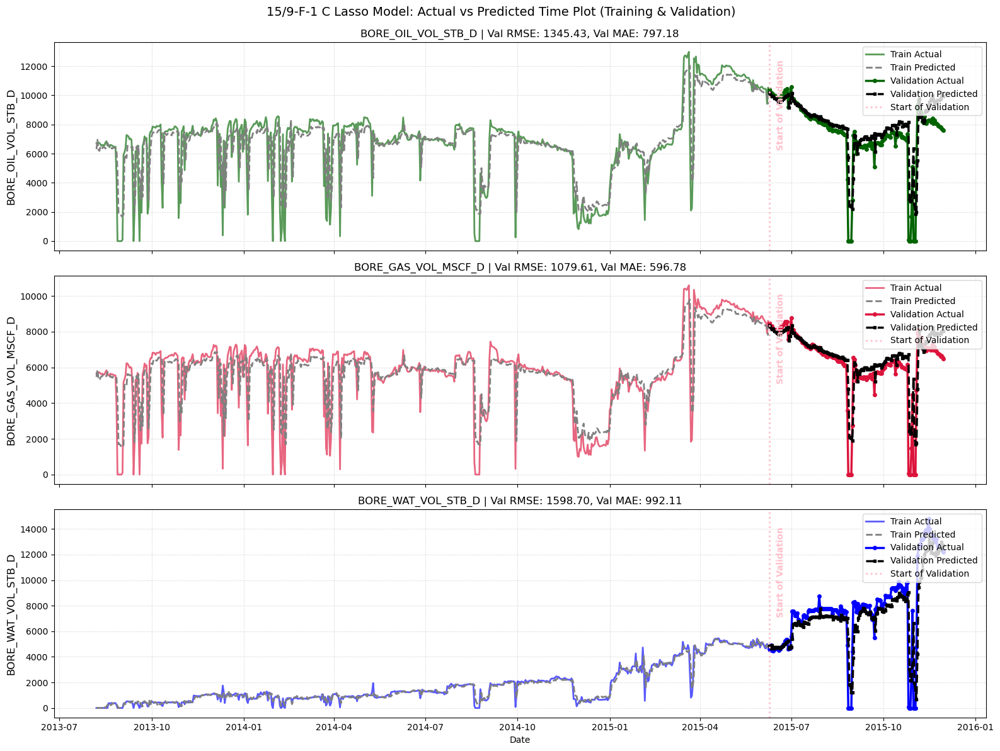

In [182]:
wellname="15/9-F-1 C"
fig, axes = plt.subplots(
    nrows=3,
    ncols=1,
    figsize=(16, 12),
    sharex=True
)

# Oil
plot_train_val_predictions_time(
    y_train=y_train_oil,
    train_pred=LASSO_train_PRED_oil,
    y_val=y_val_oil,
    val_pred=LASSO_val_PRED_oil,
    phase_string="BORE_OIL_VOL_STB_D",
    train_rmse=train_rmse_lasso_oil,
    train_mae=train_mae_lasso_oil,
    val_rmse=val_rmse_lasso_oil,
    val_mae=val_mae_lasso_oil,
    ax=axes[0],
    start_of_val_date=y_val_oil.index[0]
)

# Gas
plot_train_val_predictions_time(
    y_train=y_train_gas,
    train_pred=LASSO_train_PRED_gas,
    y_val=y_val_gas,
    val_pred=LASSO_val_PRED_gas,
    phase_string="BORE_GAS_VOL_MSCF_D",
    train_rmse=train_rmse_lasso_gas,
    train_mae=train_mae_lasso_gas,
    val_rmse=val_rmse_lasso_gas,
    val_mae=val_mae_lasso_gas,
    ax=axes[1],
    start_of_val_date=y_val_gas.index[0]
)

# Water
plot_train_val_predictions_time(
    y_train=y_train_water,
    train_pred=LASSO_train_PRED_water,
    y_val=y_val_water,
    val_pred=LASSO_val_PRED_water,
    phase_string="BORE_WAT_VOL_STB_D",
    train_rmse=train_rmse_lasso_water,
    train_mae=train_mae_lasso_water,
    val_rmse=val_rmse_lasso_water,
    val_mae=val_mae_lasso_water,
    ax=axes[2],
    start_of_val_date=y_val_water.index[0]
)

axes[-1].set_xlabel("Date")

fig.suptitle(
    f'{wellname} Lasso Model: Actual vs Predicted Time Plot '
    f'(Training & Validation)',
    fontsize=14,
    y=0.99
)

plt.tight_layout()

safe_well_name = wellname.replace("/", "-")
file_path = f"pictures/{safe_well_name}_lasso_prediction_Time_plot.png"

fig.savefig(file_path, dpi=300, bbox_inches="tight")
plt.show()

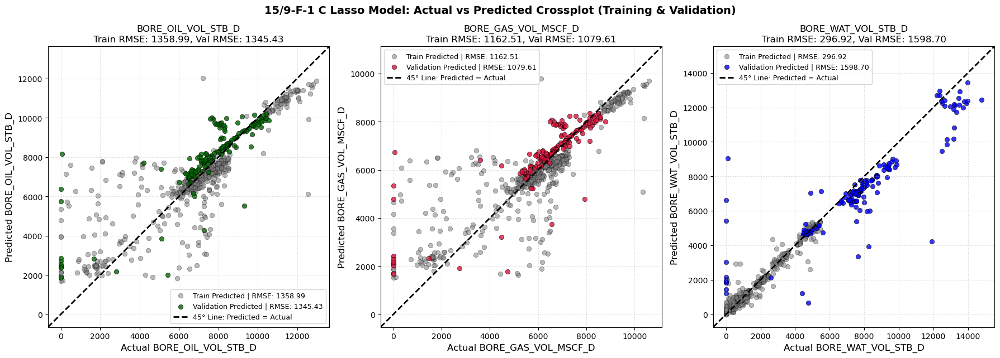

In [183]:
fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(18, 6)
)

# Oil
oil_lasso_crossplot_df, _ = plot_train_val_actual_vs_predicted_crossplot(
    y_train=y_train_oil,
    train_pred=LASSO_train_PRED_oil,
    y_val=y_val_oil,
    val_pred=LASSO_val_PRED_oil,
    phase_string="BORE_OIL_VOL_STB_D",
    train_rmse=train_rmse_lasso_oil,
    train_mae=train_mae_lasso_oil,
    val_rmse=val_rmse_lasso_oil,
    val_mae=val_mae_lasso_oil,
    ax=axes[0]
)

# Gas
gas_lasso_crossplot_df, _ = plot_train_val_actual_vs_predicted_crossplot(
    y_train=y_train_gas,
    train_pred=LASSO_train_PRED_gas,
    y_val=y_val_gas,
    val_pred=LASSO_val_PRED_gas,
    phase_string="BORE_GAS_VOL_MSCF_D",
    train_rmse=train_rmse_lasso_gas,
    train_mae=train_mae_lasso_gas,
    val_rmse=val_rmse_lasso_gas,
    val_mae=val_mae_lasso_gas,
    ax=axes[1]
)

# Water
water_lasso_crossplot_df, _ = plot_train_val_actual_vs_predicted_crossplot(
    y_train=y_train_water,
    train_pred=LASSO_train_PRED_water,
    y_val=y_val_water,
    val_pred=LASSO_val_PRED_water,
    phase_string="BORE_WAT_VOL_STB_D",
    train_rmse=train_rmse_lasso_water,
    train_mae=train_mae_lasso_water,
    val_rmse=val_rmse_lasso_water,
    val_mae=val_mae_lasso_water,
    ax=axes[2]
)

fig.suptitle(
    f'{wellname} Lasso Model: Actual vs Predicted Crossplot '
    f'(Training & Validation)',
    fontsize=14,
    fontweight="bold",
    y=1.02
)

plt.tight_layout()

safe_well_name = wellname.replace("/", "-")
file_path = f"pictures/{safe_well_name}_lasso_prediction_crossplot.png"

fig.savefig(file_path, dpi=300, bbox_inches="tight")
plt.show()

### Random Forest

#### Model Make model

In [207]:
def tune_single_target_random_forest_optuna(
    X_train,
    y_train,
    X_val,
    y_val,
    phase_name="Oil",
    n_trials=75,
    n_splits=5,
    random_state=42,
    clip_negative=True,
):
    y_train_1d = np.ravel(y_train)
    y_val_1d = np.ravel(y_val)

    ts_cv = TimeSeriesSplit(n_splits=n_splits)

    def objective(trial):

        rf_params = {
            "n_estimators": trial.suggest_int("n_estimators", 200, 1200, step=100),
            "max_depth": trial.suggest_int("max_depth", 3, 30),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 30),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20),
            "max_features": trial.suggest_categorical(
                "max_features",
                ["sqrt", "log2", 0.3, 0.5, 0.7, 1.0]
            ),
            "bootstrap": trial.suggest_categorical("bootstrap", [True, False]),
            "random_state": random_state,
            "n_jobs": -1,
        }

        if rf_params["bootstrap"]:
            rf_params["max_samples"] = trial.suggest_float("max_samples", 0.5, 1.0)

        pipe = Pipeline(
            steps=[
                ("model", RandomForestRegressor(**rf_params))
            ]
        )

        cv_rmse_scores = []

        for train_idx, valid_idx in ts_cv.split(X_train):
            X_cv_train = X_train.iloc[train_idx]
            X_cv_valid = X_train.iloc[valid_idx]

            y_cv_train = y_train_1d[train_idx]
            y_cv_valid = y_train_1d[valid_idx]

            model = clone(pipe)
            model.fit(X_cv_train, y_cv_train)

            y_cv_pred = model.predict(X_cv_valid)

            if clip_negative:
                y_cv_pred = np.clip(y_cv_pred, 0, None)

            rmse = root_mean_squared_error(y_cv_valid, y_cv_pred)
            cv_rmse_scores.append(rmse)

        return np.mean(cv_rmse_scores)

    study = optuna.create_study(
        direction="minimize",
        study_name=f"{phase_name.lower()}_random_forest_single_target"
    )

    study.optimize(objective, n_trials=n_trials, show_progress_bar=True)

    best_params = study.best_params.copy()

    best_model = Pipeline(
        steps=[
            (
                "model",
                RandomForestRegressor(
                    **best_params,
                    random_state=random_state,
                    n_jobs=-1,
                )
            )
        ]
    )

    best_model.fit(X_train, y_train_1d)

    val_pred = best_model.predict(X_val)

    if clip_negative:
        val_pred = np.clip(val_pred, 0, None)

    metrics = {
        "Model": "Single-target Random Forest",
        "Phase": phase_name,
        "Best_CV_RMSE": study.best_value,
        "Val_RMSE": root_mean_squared_error(y_val_1d, val_pred),
        "Val_MAE": mean_absolute_error(y_val_1d, val_pred),
        "Val_R2": r2_score(y_val_1d, val_pred),
        "Best_Params": study.best_params,
    }

    importance_df = pd.DataFrame(
        {
            "Feature": X_train.columns,
            "Importance": best_model.named_steps["model"].feature_importances_,
        }
    ).sort_values("Importance", ascending=False)

    val_pred_series = pd.Series(
        val_pred,
        index=X_val.index,
        name=f"{phase_name}_RF_pred"
    )

    return best_model, study, pd.DataFrame([metrics]), importance_df, val_pred_series

#### Random Forest Oil Model

In [208]:
best_oil_rf_model, oil_rf_study, oil_rf_metrics, oil_rf_importance_df, oil_rf_val_pred = (
    tune_single_target_random_forest_optuna(
        X_train=X_train_oil,
        y_train=y_train_oil,
        X_val=X_val_oil,
        y_val=y_val_oil,
        phase_name="Oil",
        n_trials=50,
        n_splits=5,
        clip_negative=True,
    )
)

[I 2026-07-08 23:20:52,608] A new study created in memory with name: oil_random_forest_single_target


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-07-08 23:20:54,494] Trial 0 finished with value: 2212.3396750870315 and parameters: {'n_estimators': 1000, 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 9, 'max_features': 'log2', 'bootstrap': True, 'max_samples': 0.5284570957447019}. Best is trial 0 with value: 2212.3396750870315.
[I 2026-07-08 23:20:55,732] Trial 1 finished with value: 2132.82945699802 and parameters: {'n_estimators': 500, 'max_depth': 17, 'min_samples_split': 14, 'min_samples_leaf': 15, 'max_features': 0.7, 'bootstrap': False}. Best is trial 1 with value: 2132.82945699802.
[I 2026-07-08 23:20:56,231] Trial 2 finished with value: 1902.513120676092 and parameters: {'n_estimators': 200, 'max_depth': 26, 'min_samples_split': 29, 'min_samples_leaf': 18, 'max_features': 1.0, 'bootstrap': True, 'max_samples': 0.5168007242508222}. Best is trial 2 with value: 1902.513120676092.
[I 2026-07-08 23:20:57,686] Trial 3 finished with value: 2172.1990843208237 and parameters: {'n_estimators': 1000, 'max_depth'

In [209]:
oil_rf_metrics

,Model,Phase,Best_CV_RMSE,Val_RMSE,Val_MAE,Val_R2,Best_Params
0,Single-target Random Forest,Oil,1891.556554,2174.2844,1840.863721,0.087529,"{'n_estimators': 900, 'max_depth': 24, 'min_sa..."


In [210]:
oil_rf_importance_df

,Feature,Importance
0,BORE_OIL_VOL_STB_D_lag_1D,0.388135
55,BORE_GAS_VOL_MSCF_D_lag_1D,0.184596
2,AVG_WHT_P_lag_1D,0.150935
21,AVG_DP_TUBING_PSI_lag_1D,0.041622
1,AVG_CHOKE_SIZE_P_lag_1D,0.028116
33,BORE_GAS_VOL_MSCF_D_expanding_sum,0.024802
32,BORE_OIL_VOL_STB_D_expanding_sum,0.022704
56,BORE_WAT_VOL_STB_D_lag_1D,0.021026
50,time_since_D,0.020834
51,time_since_D_power_2,0.019691


#### Random Forest Gas Model

In [211]:
best_gas_rf_model, gas_rf_study, gas_rf_metrics, gas_rf_importance_df, gas_rf_val_pred = (
    tune_single_target_random_forest_optuna(
        X_train=X_train_gas,
        y_train=y_train_gas,
        X_val=X_val_gas,
        y_val=y_val_gas,
        phase_name="Gas",
        n_trials=50,
        n_splits=5,
        clip_negative=True,
    )
)

[I 2026-07-08 23:22:19,334] A new study created in memory with name: gas_random_forest_single_target


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-07-08 23:22:22,294] Trial 0 finished with value: 1811.0005822927596 and parameters: {'n_estimators': 1200, 'max_depth': 9, 'min_samples_split': 27, 'min_samples_leaf': 11, 'max_features': 0.7, 'bootstrap': False}. Best is trial 0 with value: 1811.0005822927596.
[I 2026-07-08 23:22:23,151] Trial 1 finished with value: 2208.1372025186356 and parameters: {'n_estimators': 200, 'max_depth': 26, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 1.0, 'bootstrap': False}. Best is trial 0 with value: 1811.0005822927596.
[I 2026-07-08 23:22:24,086] Trial 2 finished with value: 1902.7365622095945 and parameters: {'n_estimators': 300, 'max_depth': 19, 'min_samples_split': 27, 'min_samples_leaf': 2, 'max_features': 0.5, 'bootstrap': False}. Best is trial 0 with value: 1811.0005822927596.
[I 2026-07-08 23:22:25,988] Trial 3 finished with value: 1869.4423847375044 and parameters: {'n_estimators': 800, 'max_depth': 9, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 

In [212]:
gas_rf_metrics

,Model,Phase,Best_CV_RMSE,Val_RMSE,Val_MAE,Val_R2,Best_Params
0,Single-target Random Forest,Gas,1529.209841,1882.211251,1575.917645,-0.006636,"{'n_estimators': 800, 'max_depth': 12, 'min_sa..."


#### Water Random Forest Model

In [213]:
best_water_rf_model, water_rf_study, water_rf_metrics, water_rf_importance_df, water_rf_val_pred = (
    tune_single_target_random_forest_optuna(
        X_train=X_train_water,
        y_train=y_train_water,
        X_val=X_val_water,
        y_val=y_val_water,
        phase_name="Water",
        n_trials=50,
        n_splits=5,
        clip_negative=True,
    )
)

[I 2026-07-08 23:23:47,370] A new study created in memory with name: water_random_forest_single_target


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-07-08 23:23:50,053] Trial 0 finished with value: 775.0093587820426 and parameters: {'n_estimators': 1200, 'max_depth': 7, 'min_samples_split': 23, 'min_samples_leaf': 9, 'max_features': 0.3, 'bootstrap': True, 'max_samples': 0.9363328534548332}. Best is trial 0 with value: 775.0093587820426.
[I 2026-07-08 23:23:50,754] Trial 1 finished with value: 758.0024085340896 and parameters: {'n_estimators': 200, 'max_depth': 4, 'min_samples_split': 7, 'min_samples_leaf': 19, 'max_features': 1.0, 'bootstrap': True, 'max_samples': 0.9517390474617924}. Best is trial 1 with value: 758.0024085340896.
[I 2026-07-08 23:23:51,470] Trial 2 finished with value: 852.5599802905399 and parameters: {'n_estimators': 500, 'max_depth': 22, 'min_samples_split': 10, 'min_samples_leaf': 18, 'max_features': 'log2', 'bootstrap': False}. Best is trial 1 with value: 758.0024085340896.
[I 2026-07-08 23:23:53,138] Trial 3 finished with value: 814.5768285896364 and parameters: {'n_estimators': 1200, 'max_depth': 2

In [214]:
water_rf_metrics

,Model,Phase,Best_CV_RMSE,Val_RMSE,Val_MAE,Val_R2,Best_Params
0,Single-target Random Forest,Water,736.436968,4651.900139,3921.915705,-1.202161,"{'n_estimators': 200, 'max_depth': 6, 'min_sam..."


#### Plots

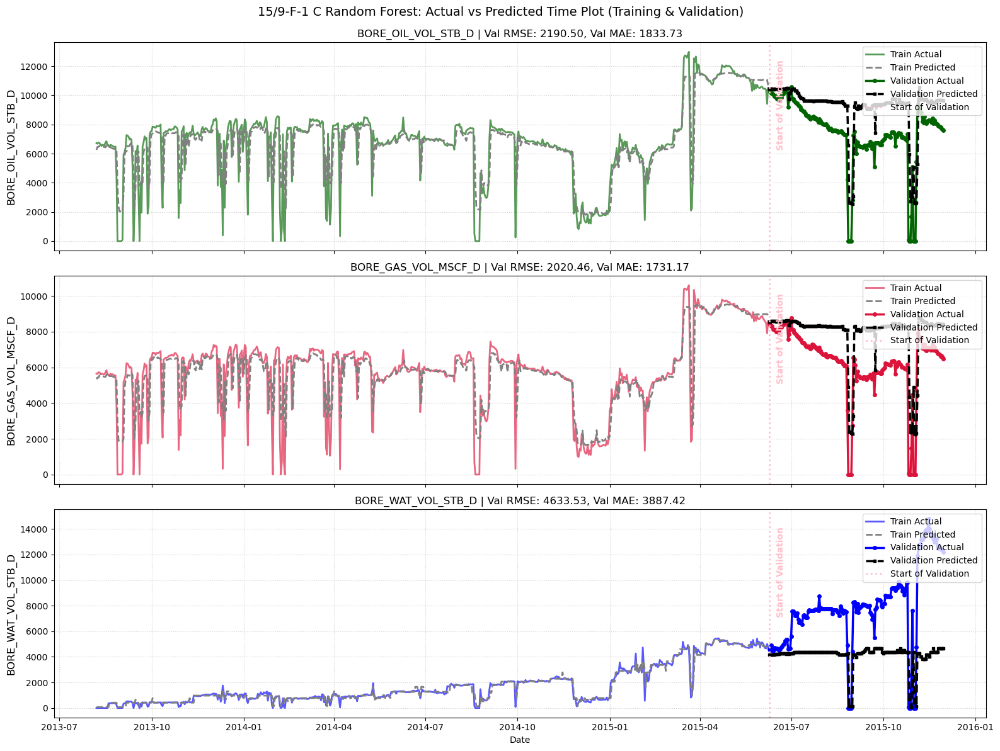

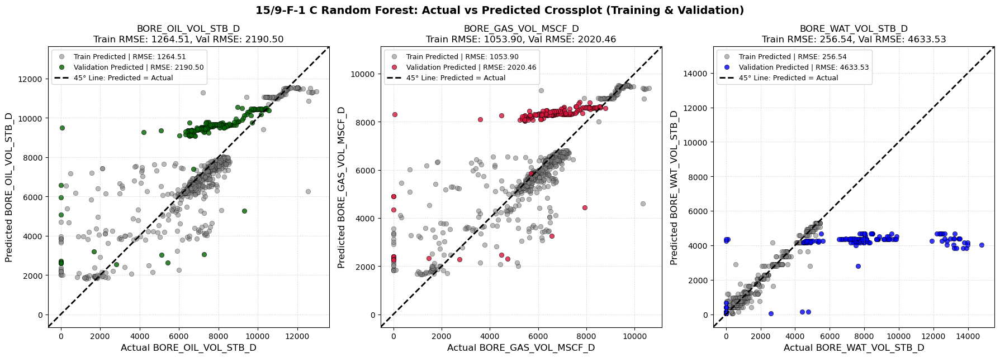

,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,BORE_OIL_VOL_STB_D,1264.507929,691.386598,0.770533,2190.497347,1833.728833,0.073870
1,BORE_GAS_VOL_MSCF_D,1053.904474,568.988049,0.758388,2020.455773,1731.174474,-0.159937
2,BORE_WAT_VOL_STB_D,256.537673,146.753697,0.970413,4633.529588,3887.415610,-1.184802


In [147]:
results = plot_single_target_multiphase_train_val_diagnostics(
    wellname="15/9-F-1 C",
    model_name="Random Forest",

    y_train_oil=y_train_oil,
    y_val_oil=y_val_oil,
    y_train_gas=y_train_gas,
    y_val_gas=y_val_gas,
    y_train_water=y_train_water,
    y_val_water=y_val_water,

    oil_model=best_oil_rf_model,
    gas_model=best_gas_rf_model,
    water_model=best_water_rf_model,

    X_train_oil=X_train_oil,
    X_val_oil=X_val_oil,
    X_train_gas=X_train_gas,
    X_val_gas=X_val_gas,
    X_train_water=X_train_water,
    X_val_water=X_val_water,

    clip_negative=True,
    save_dir="pictures",
    show=True,
)

results["metrics_df"]

### Gradient Boost 


#### Make Model

In [234]:
def tune_single_target_gradient_boosting_optuna(
    X_train,
    y_train,
    X_val,
    y_val,
    phase_name="Oil",
    n_trials=50,
    n_splits=5,
    random_state=42,
    clip_negative=True,
):
    """
    Tune a single-target GradientBoostingRegressor using Optuna + TimeSeriesSplit.

    Returns:
    - best_model
    - study
    - metrics_df
    - importance_df
    - val_pred_series
    """

    y_train_1d = np.ravel(y_train)
    y_val_1d = np.ravel(y_val)

    ts_cv = TimeSeriesSplit(n_splits=n_splits)

    def objective(trial):

        loss = trial.suggest_categorical(
            "loss",
            ["squared_error", "absolute_error", "huber"]
        )

        gb_params = {
            "loss": loss,
            "n_estimators": trial.suggest_int("n_estimators", 100, 1500, step=100),
            "learning_rate": trial.suggest_float("learning_rate", 0.005, 0.2, log=True),
            "max_depth": trial.suggest_int("max_depth", 1, 8),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 30),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 25),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "max_features": trial.suggest_categorical(
                "max_features",
                [None, "sqrt", "log2", 0.3, 0.5, 0.7, 1.0]
            ),
            "ccp_alpha": trial.suggest_float("ccp_alpha", 0.0, 0.02),
            "random_state": random_state,
        }

        # alpha is only used for huber loss here
        if loss == "huber":
            gb_params["alpha"] = trial.suggest_float("alpha", 0.80, 0.99)

        gb_pipe = Pipeline(
            steps=[
                ("model", GradientBoostingRegressor(**gb_params))
            ]
        )

        cv_rmse_scores = []

        for train_idx, valid_idx in ts_cv.split(X_train):

            X_cv_train = X_train.iloc[train_idx]
            X_cv_valid = X_train.iloc[valid_idx]

            y_cv_train = y_train_1d[train_idx]
            y_cv_valid = y_train_1d[valid_idx]

            model = clone(gb_pipe)
            model.fit(X_cv_train, y_cv_train)

            y_cv_pred = model.predict(X_cv_valid)

            if clip_negative:
                y_cv_pred = np.clip(y_cv_pred, 0, None)

            rmse = root_mean_squared_error(y_cv_valid, y_cv_pred)
            cv_rmse_scores.append(rmse)

        return np.mean(cv_rmse_scores)

    study = optuna.create_study(
        direction="minimize",
        study_name=f"{phase_name.lower()}_gradient_boosting_single_target"
    )

    study.optimize(objective, n_trials=n_trials, show_progress_bar=True)

    best_params = study.best_params.copy()

    best_model = Pipeline(
        steps=[
            (
                "model",
                GradientBoostingRegressor(
                    **best_params,
                    random_state=random_state,
                )
            )
        ]
    )

    best_model.fit(X_train, y_train_1d)

    train_pred = best_model.predict(X_train)
    val_pred = best_model.predict(X_val)

    if clip_negative:
        train_pred = np.clip(train_pred, 0, None)
        val_pred = np.clip(val_pred, 0, None)

    metrics = {
        "Model": "Single-target Gradient Boosting",
        "Phase": phase_name,
        "Best_CV_RMSE": study.best_value,

        "Train_RMSE": root_mean_squared_error(y_train_1d, train_pred),
        "Train_MAE": mean_absolute_error(y_train_1d, train_pred),
        "Train_R2": r2_score(y_train_1d, train_pred),

        "Val_RMSE": root_mean_squared_error(y_val_1d, val_pred),
        "Val_MAE": mean_absolute_error(y_val_1d, val_pred),
        "Val_R2": r2_score(y_val_1d, val_pred),

        "Best_Params": study.best_params,
    }

    metrics_df = pd.DataFrame([metrics])

    importance_df = pd.DataFrame(
        {
            "Feature": X_train.columns,
            "Importance": best_model.named_steps["model"].feature_importances_,
        }
    ).sort_values("Importance", ascending=False)

    val_pred_series = pd.Series(
        val_pred,
        index=X_val.index,
        name=f"{phase_name}_GB_val_pred"
    )

    return best_model, study, metrics_df, importance_df, val_pred_series

#### Oil Gradient Boost

In [235]:
best_oil_gb_model, oil_gb_study, oil_gb_metrics, oil_gb_importance_df, oil_gb_val_pred = (
    tune_single_target_gradient_boosting_optuna(
        X_train=X_train_oil,
        y_train=y_train_oil,
        X_val=X_val_oil,
        y_val=y_val_oil,
        phase_name="Oil",
        n_trials=50,
        n_splits=5,
        clip_negative=True,
    )
)

[I 2026-07-08 23:47:28,736] A new study created in memory with name: oil_gradient_boosting_single_target


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-07-08 23:47:29,559] Trial 0 finished with value: 2335.043320656149 and parameters: {'loss': 'huber', 'n_estimators': 100, 'learning_rate': 0.005243516790737321, 'max_depth': 4, 'min_samples_split': 29, 'min_samples_leaf': 12, 'subsample': 0.7480503680619923, 'max_features': 0.3, 'ccp_alpha': 0.005482920854920741, 'alpha': 0.9020316625545333}. Best is trial 0 with value: 2335.043320656149.
[I 2026-07-08 23:47:40,814] Trial 1 finished with value: 2320.5531698165046 and parameters: {'loss': 'huber', 'n_estimators': 1500, 'learning_rate': 0.03197386596897136, 'max_depth': 1, 'min_samples_split': 15, 'min_samples_leaf': 17, 'subsample': 0.9887141657386349, 'max_features': 1.0, 'ccp_alpha': 0.014159830890989662, 'alpha': 0.8971277391736387}. Best is trial 1 with value: 2320.5531698165046.
[I 2026-07-08 23:48:08,969] Trial 2 finished with value: 2936.4226226134756 and parameters: {'loss': 'squared_error', 'n_estimators': 1100, 'learning_rate': 0.14488552661419807, 'max_depth': 8, 'min

In [238]:
oil_gb_metrics

,Model,Phase,Best_CV_RMSE,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2,Best_Params
0,Single-target Gradient Boosting,Oil,1859.441398,1337.019115,554.498227,0.743461,1350.123688,767.178114,0.648169,"{'loss': 'absolute_error', 'n_estimators': 200..."


#### Gas Gradient Boost

In [239]:
best_gas_gb_model, gas_gb_study, gas_gb_metrics, gas_gb_importance_df, gas_gb_val_pred = (
    tune_single_target_gradient_boosting_optuna(
        X_train=X_train_gas,
        y_train=y_train_gas,
        X_val=X_val_gas,
        y_val=y_val_gas,
        phase_name="Gas",
        n_trials=50,
        n_splits=5,
        clip_negative=True,
    )
)

[I 2026-07-08 23:54:35,766] A new study created in memory with name: gas_gradient_boosting_single_target


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-07-08 23:54:36,729] Trial 0 finished with value: 1901.78267692501 and parameters: {'loss': 'squared_error', 'n_estimators': 200, 'learning_rate': 0.03927941424052045, 'max_depth': 4, 'min_samples_split': 6, 'min_samples_leaf': 18, 'subsample': 0.712937738817923, 'max_features': 0.3, 'ccp_alpha': 0.005522190164370986}. Best is trial 0 with value: 1901.78267692501.
[I 2026-07-08 23:54:40,559] Trial 1 finished with value: 1908.3982605185943 and parameters: {'loss': 'absolute_error', 'n_estimators': 700, 'learning_rate': 0.0245212755245142, 'max_depth': 8, 'min_samples_split': 6, 'min_samples_leaf': 15, 'subsample': 0.8745575799855678, 'max_features': 'log2', 'ccp_alpha': 0.004498668530059726}. Best is trial 0 with value: 1901.78267692501.
[I 2026-07-08 23:54:56,962] Trial 2 finished with value: 1730.293126323846 and parameters: {'loss': 'huber', 'n_estimators': 1300, 'learning_rate': 0.005913333498948333, 'max_depth': 3, 'min_samples_split': 14, 'min_samples_leaf': 21, 'subsample'

In [240]:
gas_gb_metrics

,Model,Phase,Best_CV_RMSE,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2,Best_Params
0,Single-target Gradient Boosting,Gas,1604.857384,1063.306405,473.233414,0.754058,1418.595629,1075.322462,0.428188,"{'loss': 'huber', 'n_estimators': 1300, 'learn..."


#### Water  Gradient Boost

In [241]:
best_water_gb_model, water_gb_study, water_gb_metrics, water_gb_importance_df, water_gb_val_pred = (
    tune_single_target_gradient_boosting_optuna(
        X_train=X_train_water,
        y_train=y_train_water,
        X_val=X_val_water,
        y_val=y_val_water,
        phase_name="Water",
        n_trials=50,
        n_splits=5,
        clip_negative=True,
    )
)

[I 2026-07-09 00:02:19,403] A new study created in memory with name: water_gradient_boosting_single_target


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-07-09 00:03:11,964] Trial 0 finished with value: 761.104272070536 and parameters: {'loss': 'absolute_error', 'n_estimators': 1500, 'learning_rate': 0.029466639910133135, 'max_depth': 7, 'min_samples_split': 8, 'min_samples_leaf': 25, 'subsample': 0.993605210023444, 'max_features': 0.7, 'ccp_alpha': 0.01938131438033652}. Best is trial 0 with value: 761.104272070536.
[I 2026-07-09 00:03:14,523] Trial 1 finished with value: 891.3075736956368 and parameters: {'loss': 'squared_error', 'n_estimators': 1100, 'learning_rate': 0.03667681667336102, 'max_depth': 4, 'min_samples_split': 5, 'min_samples_leaf': 12, 'subsample': 0.8049804884485139, 'max_features': 'log2', 'ccp_alpha': 0.000716792509601738}. Best is trial 0 with value: 761.104272070536.
[I 2026-07-09 00:03:14,737] Trial 2 finished with value: 839.1824265547057 and parameters: {'loss': 'huber', 'n_estimators': 100, 'learning_rate': 0.04809060214646526, 'max_depth': 1, 'min_samples_split': 8, 'min_samples_leaf': 21, 'subsample':

In [243]:
water_gb_metrics

,Model,Phase,Best_CV_RMSE,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2,Best_Params
0,Single-target Gradient Boosting,Water,733.272467,273.153355,92.428675,0.966456,4269.970528,3511.468459,-0.855402,"{'loss': 'absolute_error', 'n_estimators': 130..."


#### Plots

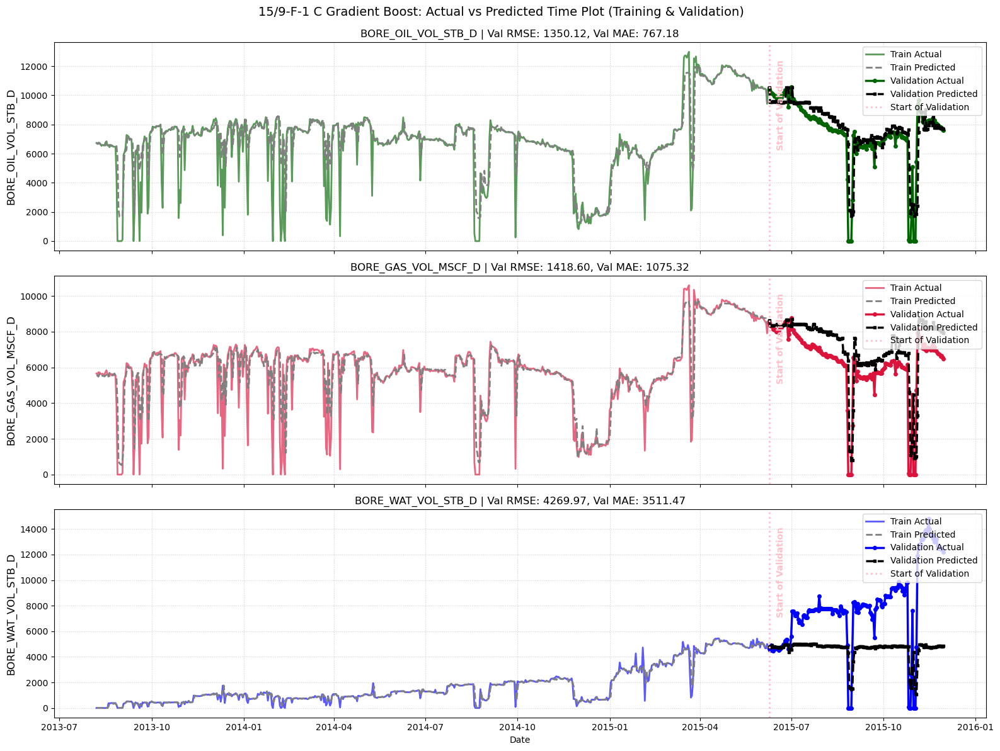

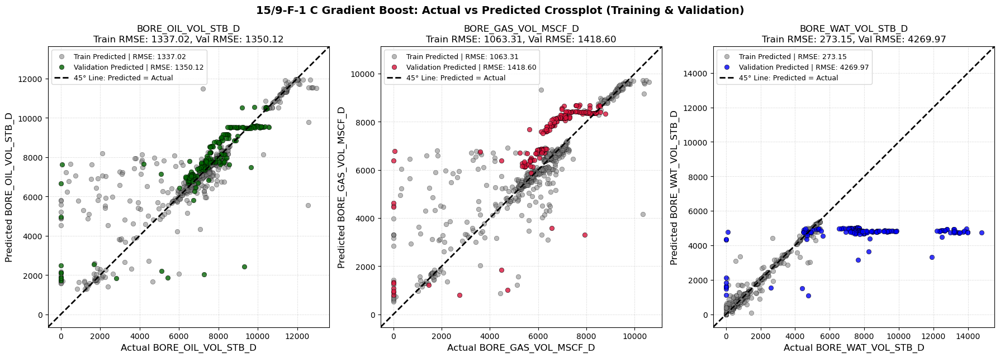

,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,BORE_OIL_VOL_STB_D,1337.019115,554.498227,0.743461,1350.123688,767.178114,0.648169
1,BORE_GAS_VOL_MSCF_D,1063.306405,473.233414,0.754058,1418.595629,1075.322462,0.428188
2,BORE_WAT_VOL_STB_D,273.153355,92.428675,0.966456,4269.970528,3511.468459,-0.855402


In [244]:
results = plot_single_target_multiphase_train_val_diagnostics(
    wellname="15/9-F-1 C",
    model_name="Gradient Boost",

    y_train_oil=y_train_oil,
    y_val_oil=y_val_oil,
    y_train_gas=y_train_gas,
    y_val_gas=y_val_gas,
    y_train_water=y_train_water,
    y_val_water=y_val_water,

    oil_model=best_oil_gb_model,
    gas_model=best_gas_gb_model,
    water_model=best_water_gb_model,

    X_train_oil=X_train_oil,
    X_val_oil=X_val_oil,
    X_train_gas=X_train_gas,
    X_val_gas=X_val_gas,
    X_train_water=X_train_water,
    X_val_water=X_val_water,

    clip_negative=True,
    save_dir="pictures",
    show=True,
)

results["metrics_df"]

### Light GBM

#### Make Model

In [245]:
def tune_single_target_lightgbm_optuna(
    X_train,
    y_train,
    X_val,
    y_val,
    phase_name="Oil",
    n_trials=50,
    n_splits=5,
    random_state=42,
    clip_negative=True,
    linear_tree=False,
):
    """
    Tune a single-target LightGBM model using Optuna + TimeSeriesSplit.

    linear_tree=False -> normal LightGBM
    linear_tree=True  -> LightGBM with linear models at the leaves
    """

    y_train_1d = np.ravel(y_train)
    y_val_1d = np.ravel(y_val)

    ts_cv = TimeSeriesSplit(n_splits=n_splits)

    def objective(trial):

        # regression_l1 is not allowed with linear_tree=True,
        # so keep the objective choices simple and compatible.
        objective_name = trial.suggest_categorical(
            "objective",
            ["regression", "huber", "regression_l1"]
        )

        max_depth =1 #trial.suggest_int("max_depth", 2, 10)
        max_num_leaves = 2 #min(2 ** max_depth, 128)

        lgbm_params = {
            "objective": objective_name,

            "n_estimators": trial.suggest_int("n_estimators", 100, 3000, step=100),
            "learning_rate": trial.suggest_float("learning_rate", 0.005, 0.2, log=True),

            "max_depth": trial.suggest_int("max_depth", 1, 2), #max_depth,
            "num_leaves": trial.suggest_int("num_leaves", 2, 3), #trial.suggest_int("num_leaves", 4, max_num_leaves),

            "min_child_samples":trial.suggest_int("min_child_samples", 5, 150), #trial.suggest_int("min_child_samples", 5, 80),
            "subsample": 1.0,  #trial.suggest_float("subsample", 0.5, 1.0),
            "subsample_freq": 0, #trial.suggest_int("subsample_freq", 1, 7),
            "colsample_bytree": 1.0, #trial.suggest_float("colsample_bytree", 0.5, 1.0),

            "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 10.0, log=True),
            "reg_lambda": trial.suggest_float("reg_lambda", 1e-2, 1000.0, log=True),

            "linear_tree": linear_tree,

            "random_state": random_state,
            "n_jobs": -1,
            "verbose": -1,
            
                # Reduce weak splits
            "min_split_gain": trial.suggest_float("min_split_gain", 0.0, 10.0), # can remove later

        }

        

        if objective_name == "huber":
            lgbm_params["alpha"] = trial.suggest_float("alpha", 0.80, 0.99)

        if linear_tree:
            lgbm_params["linear_lambda"] = trial.suggest_float("linear_lambda", 1e-3, 1000.0, log=True), #trial.suggest_float("linear_lambda",1e-8,100.0,log=True)

        if linear_tree:
            lgbm_pipe = Pipeline(
                steps=[
                    ("scaler", StandardScaler()),
                    ("model", LGBMRegressor(**lgbm_params)),
                ]
            )
        else:
            lgbm_pipe = Pipeline(
                steps=[
                    ("model", LGBMRegressor(**lgbm_params)),
                ]
            )

        cv_rmse_scores = []

        for train_idx, valid_idx in ts_cv.split(X_train):

            X_cv_train = X_train.iloc[train_idx]
            X_cv_valid = X_train.iloc[valid_idx]

            y_cv_train = y_train_1d[train_idx]
            y_cv_valid = y_train_1d[valid_idx]

            model = clone(lgbm_pipe)
            model.fit(X_cv_train, y_cv_train)

            y_cv_pred = model.predict(X_cv_valid)

            if clip_negative:
                y_cv_pred = np.clip(y_cv_pred, 0, None)

            rmse = root_mean_squared_error(y_cv_valid, y_cv_pred)
            cv_rmse_scores.append(rmse)

        return np.mean(cv_rmse_scores)

    study_name = (
        f"{phase_name.lower()}_lightgbm_linear_tree_single_target"
        if linear_tree
        else f"{phase_name.lower()}_lightgbm_normal_single_target"
    )

    study = optuna.create_study(
        direction="minimize",
        study_name=study_name
    )

    study.optimize(objective, n_trials=n_trials, show_progress_bar=True)

    best_params = study.best_params.copy()
    best_params["linear_tree"] = linear_tree

    final_lgbm_params = best_params.copy()
    final_lgbm_params.update(
        {
            "random_state": random_state,
            "n_jobs": -1,
            "verbose": -1,
        }
    )

    if linear_tree:
        best_model = Pipeline(
            steps=[
                ("scaler", StandardScaler()),
                ("model", LGBMRegressor(**final_lgbm_params)),
            ]
        )
    else:
        best_model = Pipeline(
            steps=[
                ("model", LGBMRegressor(**final_lgbm_params)),
            ]
        )

    best_model.fit(X_train, y_train_1d)

    train_pred = best_model.predict(X_train)
    val_pred = best_model.predict(X_val)

    if clip_negative:
        train_pred = np.clip(train_pred, 0, None)
        val_pred = np.clip(val_pred, 0, None)

    metrics = {
        "Model": "Single-target LightGBM",
        "Phase": phase_name,
        "Linear_Tree": linear_tree,
        "Best_CV_RMSE": study.best_value,

        "Train_RMSE": root_mean_squared_error(y_train_1d, train_pred),
        "Train_MAE": mean_absolute_error(y_train_1d, train_pred),
        "Train_R2": r2_score(y_train_1d, train_pred),

        "Val_RMSE": root_mean_squared_error(y_val_1d, val_pred),
        "Val_MAE": mean_absolute_error(y_val_1d, val_pred),
        "Val_R2": r2_score(y_val_1d, val_pred),

        "Best_Params": best_params,
    }

    metrics_df = pd.DataFrame([metrics])

    importance_df = pd.DataFrame(
        {
            "Feature": X_train.columns,
            "Importance": best_model.named_steps["model"].feature_importances_,
        }
    ).sort_values("Importance", ascending=False)

    val_pred_series = pd.Series(
        val_pred,
        index=X_val.index,
        name=f"{phase_name}_LGBM_val_pred"
    )

    return best_model, study, metrics_df, importance_df, val_pred_series

#### Light GBM Oil

In [246]:
best_oil_lgbm_linear_model, oil_lgbm_linear_study, oil_lgbm_linear_metrics, oil_lgbm_linear_importance_df, oil_lgbm_linear_val_pred = (
    tune_single_target_lightgbm_optuna(
        X_train=X_train_oil,
        y_train=y_train_oil,
        X_val=X_val_oil,
        y_val=y_val_oil,
        phase_name="Oil",
        n_trials=50,
        n_splits=5,
        clip_negative=True,
        linear_tree=True,
    )
)

[I 2026-07-09 00:21:39,347] A new study created in memory with name: oil_lightgbm_linear_tree_single_target


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-07-09 00:21:40,289] Trial 0 finished with value: 2048.5831915402205 and parameters: {'objective': 'regression', 'n_estimators': 700, 'learning_rate': 0.02332754306624015, 'max_depth': 2, 'num_leaves': 3, 'min_child_samples': 108, 'reg_alpha': 0.0010273474519985643, 'reg_lambda': 4.850691964516731, 'min_split_gain': 2.539620788893725, 'linear_lambda': 1.4478871480450832}. Best is trial 0 with value: 2048.5831915402205.
[I 2026-07-09 00:21:40,766] Trial 1 finished with value: 2651.6872619419055 and parameters: {'objective': 'huber', 'n_estimators': 700, 'learning_rate': 0.011978657197700793, 'max_depth': 2, 'num_leaves': 2, 'min_child_samples': 144, 'reg_alpha': 8.62470038215842e-07, 'reg_lambda': 285.837497895104, 'min_split_gain': 3.1352109072022296, 'alpha': 0.8382007177925505, 'linear_lambda': 68.2643589116337}. Best is trial 0 with value: 2048.5831915402205.
[I 2026-07-09 00:21:42,113] Trial 2 finished with value: 2644.70068552668 and parameters: {'objective': 'huber', 'n_es

In [249]:
oil_lgbm_linear_metrics

,Model,Phase,Linear_Tree,Best_CV_RMSE,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2,Best_Params
0,Single-target LightGBM,Oil,True,1730.857893,1217.470925,705.003801,0.787287,1459.492483,953.48861,0.58886,"{'objective': 'regression', 'n_estimators': 90..."


In [250]:
#best_oil_lgbm_linear_model.get_params()

#### Light GBM gas

In [251]:
best_gas_lgbm_linear_model, gas_lgbm_linear_study, gas_lgbm_linear_metrics, gas_lgbm_linear_importance_df, gas_lgbm_linear_val_pred = (
    tune_single_target_lightgbm_optuna(
        X_train=X_train_gas,
        y_train=y_train_gas,
        X_val=X_val_gas,
        y_val=y_val_gas,
        phase_name="Gas",
        n_trials=50,
        n_splits=5,
        clip_negative=True,
        linear_tree=True,
    )
)

[I 2026-07-09 00:26:23,047] A new study created in memory with name: gas_lightgbm_linear_tree_single_target


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-07-09 00:26:24,998] Trial 0 finished with value: 1629.6135765734603 and parameters: {'objective': 'regression', 'n_estimators': 1100, 'learning_rate': 0.008427454783347183, 'max_depth': 2, 'num_leaves': 3, 'min_child_samples': 20, 'reg_alpha': 2.056572740177166e-06, 'reg_lambda': 0.6049900480186672, 'min_split_gain': 8.141075552012428, 'linear_lambda': 0.13072949332016498}. Best is trial 0 with value: 1629.6135765734603.
[I 2026-07-09 00:26:26,187] Trial 1 finished with value: 1627.533347154094 and parameters: {'objective': 'regression', 'n_estimators': 1800, 'learning_rate': 0.006283677877230158, 'max_depth': 2, 'num_leaves': 2, 'min_child_samples': 142, 'reg_alpha': 0.0001622553055067994, 'reg_lambda': 255.87437617215144, 'min_split_gain': 6.4799818851723066, 'linear_lambda': 165.64205737315308}. Best is trial 1 with value: 1627.533347154094.
[I 2026-07-09 00:26:28,287] Trial 2 finished with value: 2067.438602234238 and parameters: {'objective': 'regression', 'n_estimators': 

In [252]:
gas_lgbm_linear_metrics

,Model,Phase,Linear_Tree,Best_CV_RMSE,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2,Best_Params
0,Single-target LightGBM,Gas,True,1399.773451,1173.187037,693.782991,0.700601,985.974364,437.670429,0.723772,"{'objective': 'regression', 'n_estimators': 10..."


#### Light GBM water

In [253]:
best_water_lgbm_linear_model, water_lgbm_linear_study, water_lgbm_linear_metrics, water_lgbm_linear_importance_df, water_lgbm_linear_val_pred = (
    tune_single_target_lightgbm_optuna(
        X_train=X_train_water,
        y_train=y_train_water,
        X_val=X_val_water,
        y_val=y_val_water,
        phase_name="water",
        n_trials=50,
        n_splits=5,
        clip_negative=True,
        linear_tree=True,
    )
)

[I 2026-07-09 00:27:02,923] A new study created in memory with name: water_lightgbm_linear_tree_single_target


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-07-09 00:27:03,216] Trial 0 finished with value: 496.8820711913412 and parameters: {'objective': 'regression', 'n_estimators': 200, 'learning_rate': 0.06936903581911197, 'max_depth': 2, 'num_leaves': 2, 'min_child_samples': 77, 'reg_alpha': 0.00012808423066392995, 'reg_lambda': 0.01694696011576601, 'min_split_gain': 1.83608627540092, 'linear_lambda': 0.03697197233255843}. Best is trial 0 with value: 496.8820711913412.
[I 2026-07-09 00:27:04,390] Trial 1 finished with value: 757.046301560584 and parameters: {'objective': 'regression', 'n_estimators': 1200, 'learning_rate': 0.05892023419620556, 'max_depth': 1, 'num_leaves': 2, 'min_child_samples': 45, 'reg_alpha': 0.00055082766659658, 'reg_lambda': 38.45352250907349, 'min_split_gain': 5.553552864275427, 'linear_lambda': 0.0024532515148140547}. Best is trial 0 with value: 496.8820711913412.
[I 2026-07-09 00:27:05,446] Trial 2 finished with value: 1273.7190139381294 and parameters: {'objective': 'regression_l1', 'n_estimators': 140

In [254]:
water_lgbm_linear_metrics

,Model,Phase,Linear_Tree,Best_CV_RMSE,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2,Best_Params
0,Single-target LightGBM,water,True,436.461335,288.339437,160.953224,0.962623,3410.093903,3087.097948,-0.183371,"{'objective': 'regression', 'n_estimators': 50..."


#### Plot

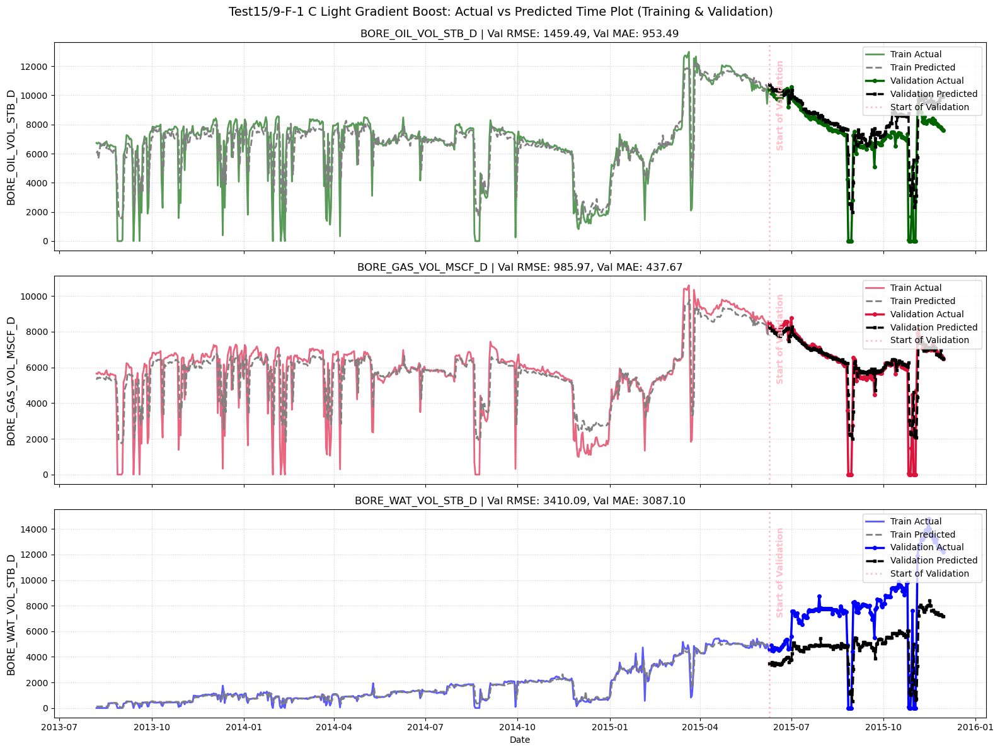

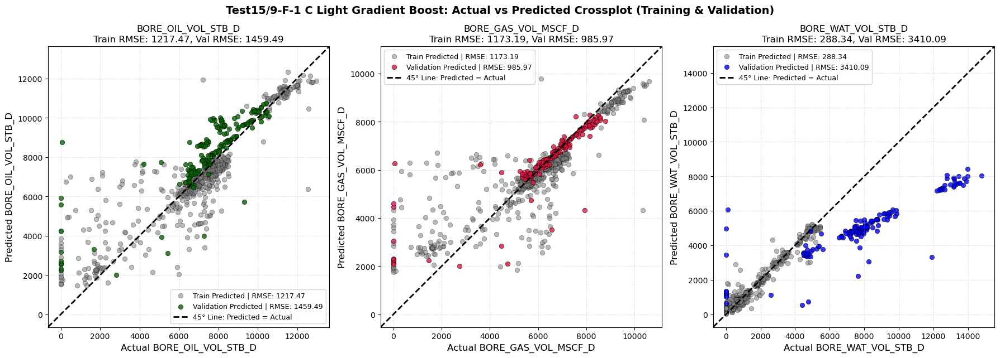

,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,BORE_OIL_VOL_STB_D,1217.470925,705.003801,0.787287,1459.492483,953.488610,0.588860
1,BORE_GAS_VOL_MSCF_D,1173.187037,693.782991,0.700601,985.974364,437.670429,0.723772
2,BORE_WAT_VOL_STB_D,288.339437,160.953224,0.962623,3410.093903,3087.097948,-0.183371


In [255]:
results = plot_single_target_multiphase_train_val_diagnostics(
    wellname="Test15/9-F-1 C",
    model_name="Light Gradient Boost",

    y_train_oil=y_train_oil,
    y_val_oil=y_val_oil,
    y_train_gas=y_train_gas,
    y_val_gas=y_val_gas,
    y_train_water=y_train_water,
    y_val_water=y_val_water,

    oil_model=best_oil_lgbm_linear_model,
    gas_model=best_gas_lgbm_linear_model,
    water_model=best_water_lgbm_linear_model,

    X_train_oil=X_train_oil,
    X_val_oil=X_val_oil,
    X_train_gas=X_train_gas,
    X_val_gas=X_val_gas,
    X_train_water=X_train_water,
    X_val_water=X_val_water,

    clip_negative=True,
    save_dir="pictures",
    show=True,
)

results["metrics_df"]

# PIPELINE FEATURE ENGINEERING & MODELLING FOR RECURSIVE

## Lasso

In [191]:
X_train_water.columns

Index(['ON_STREAM_HRS_lag_1D', 'AVG_CHOKE_SIZE_P_lag_1D', 'AVG_WHT_P_lag_1D',
       'WCUT_lag_1D', 'BORE_OIL_VOL_STB_D_lag_1D', 'WCUT_lag_3D',
       'DP_CHOKE_SIZE_PSI_lag_1D', 'BORE_OIL_VOL_STB_D_lag_10D', 'WCUT_lag_6D',
       'WCUT_lag_4D',
       ...
       'WCUT_slope_30D', 'GOR_MSCF_STB_slope_7D', 'GOR_MSCF_STB_slope_14D',
       'GOR_MSCF_STB_slope_30D', 'time_since_D', 'time_since_D_power_2',
       'week', 'month', 'BORE_GAS_VOL_MSCF_D_lag_1D',
       'BORE_WAT_VOL_STB_D_lag_1D'],
      dtype='object', length=120)

In [228]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

phase_models = {
    "BORE_OIL_VOL_STB_D": best_lasso_model_oil,
    "BORE_GAS_VOL_MSCF_D": best_lasso_model_gas,
    "BORE_WAT_VOL_STB_D": best_lasso_model_water,
}

phase_feature_pipes = {
    "BORE_OIL_VOL_STB_D": oil_feature_pipe,
    "BORE_GAS_VOL_MSCF_D": gas_feature_pipe,
    "BORE_WAT_VOL_STB_D": water_feature_pipe,
}

phase_model_feature_cols = {
    "BORE_OIL_VOL_STB_D": X_train_oil.columns,
    "BORE_GAS_VOL_MSCF_D": X_train_gas.columns,
    "BORE_WAT_VOL_STB_D": X_train_water.columns,
}


In [229]:

(
    walk_forward_forecast_df,
    walk_forward_recursive_history_df,
    walk_forward_metrics_df,
    block_summary_df,
) = walk_forward_recursive_forecast_separate_phase_models_v2(
    phase_models=phase_models,
    phase_feature_pipes=phase_feature_pipes,
    phase_model_feature_cols=phase_model_feature_cols,
    train_data=train_data.copy(),
    val_data=val_data.copy(),
    target_cols=target_cols,
    forecast_horizon=30,
    clip_negative=True,
    update_history_with_actual_after_block=True,
    verbose=True,
)


Block 1: 2015-06-09 00:00:00 to 2015-07-08 00:00:00 (30 days)
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddS

In [230]:
lasso_model=walk_forward_metrics_df
lasso_model

,Phase,Recursive_RMSE,Recursive_MAE,Recursive_R2
0,BORE_OIL_VOL_STB_D,3581.466067,2409.293445,-1.475758
1,BORE_GAS_VOL_MSCF_D,2763.814355,1805.155310,-1.170469
2,BORE_WAT_VOL_STB_D,2953.974883,2408.592017,0.112023


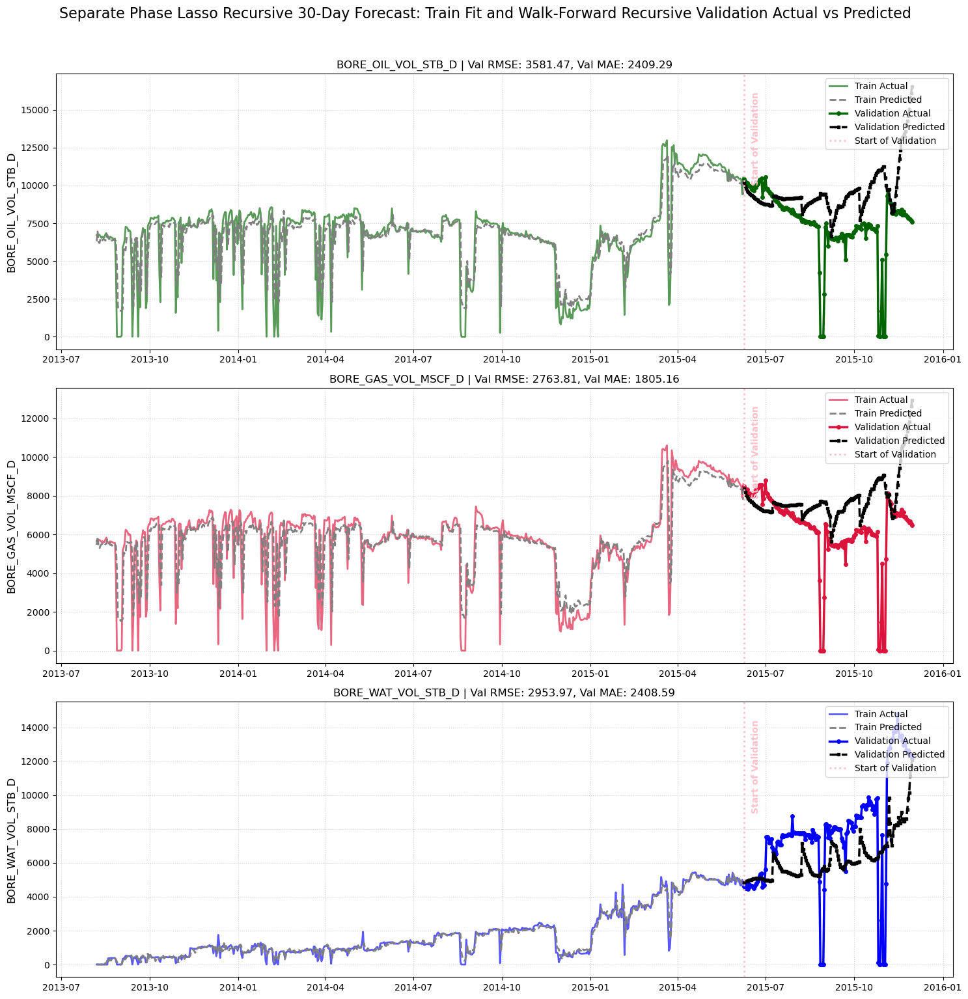

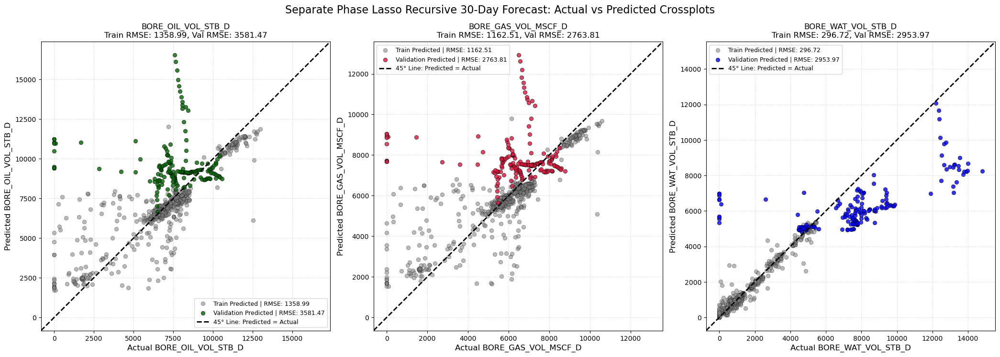

In [231]:
phase_X_train = {
    "BORE_OIL_VOL_STB_D": X_train_oil,
    "BORE_GAS_VOL_MSCF_D": X_train_gas,
    "BORE_WAT_VOL_STB_D": X_train_water,
} 

y_train = pd.concat(
    [
        y_train_oil.rename("BORE_OIL_VOL_STB_D"),
        y_train_gas.rename("BORE_GAS_VOL_MSCF_D"),
        y_train_water.rename("BORE_WAT_VOL_STB_D"),
    ],
    axis=1,
)

y_val = val_data[target_cols].copy()


train_pred_df, val_pred_df, recursive_metrics_df = (
    plot_separate_phase_train_walkforward_val_diagnostics(
        phase_models=phase_models,
        phase_X_train=phase_X_train,
        y_train=y_train,
        y_val=y_val,
        walk_forward_forecast_df=walk_forward_forecast_df,
        target_cols=target_cols,
        model_name="Separate Phase Lasso Recursive 30-Day Forecast",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
        make_combined_plots=True,
        walk_forward_metrics_df=walk_forward_metrics_df,
    )
)

## Random Forest

In [232]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

phase_models = {
    "BORE_OIL_VOL_STB_D": best_oil_rf_model,
    "BORE_GAS_VOL_MSCF_D": best_gas_rf_model,
    "BORE_WAT_VOL_STB_D": best_water_rf_model,
}

phase_feature_pipes = {
    "BORE_OIL_VOL_STB_D": oil_feature_pipe,
    "BORE_GAS_VOL_MSCF_D": gas_feature_pipe,
    "BORE_WAT_VOL_STB_D": water_feature_pipe,
}

phase_model_feature_cols = {
    "BORE_OIL_VOL_STB_D": X_train_oil.columns,
    "BORE_GAS_VOL_MSCF_D": X_train_gas.columns,
    "BORE_WAT_VOL_STB_D": X_train_water.columns,
}

(
    walk_forward_forecast_df,
    walk_forward_recursive_history_df,
    walk_forward_metrics_df,
    block_summary_df,
) = walk_forward_recursive_forecast_separate_phase_models_v2(
    phase_models=phase_models,
    phase_feature_pipes=phase_feature_pipes,
    phase_model_feature_cols=phase_model_feature_cols,
    train_data=train_data.copy(),
    val_data=val_data.copy(),
    target_cols=target_cols,
    forecast_horizon=30,
    clip_negative=True,
    update_history_with_actual_after_block=True,
    verbose=True,
)


Block 1: 2015-06-09 00:00:00 to 2015-07-08 00:00:00 (30 days)
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddS

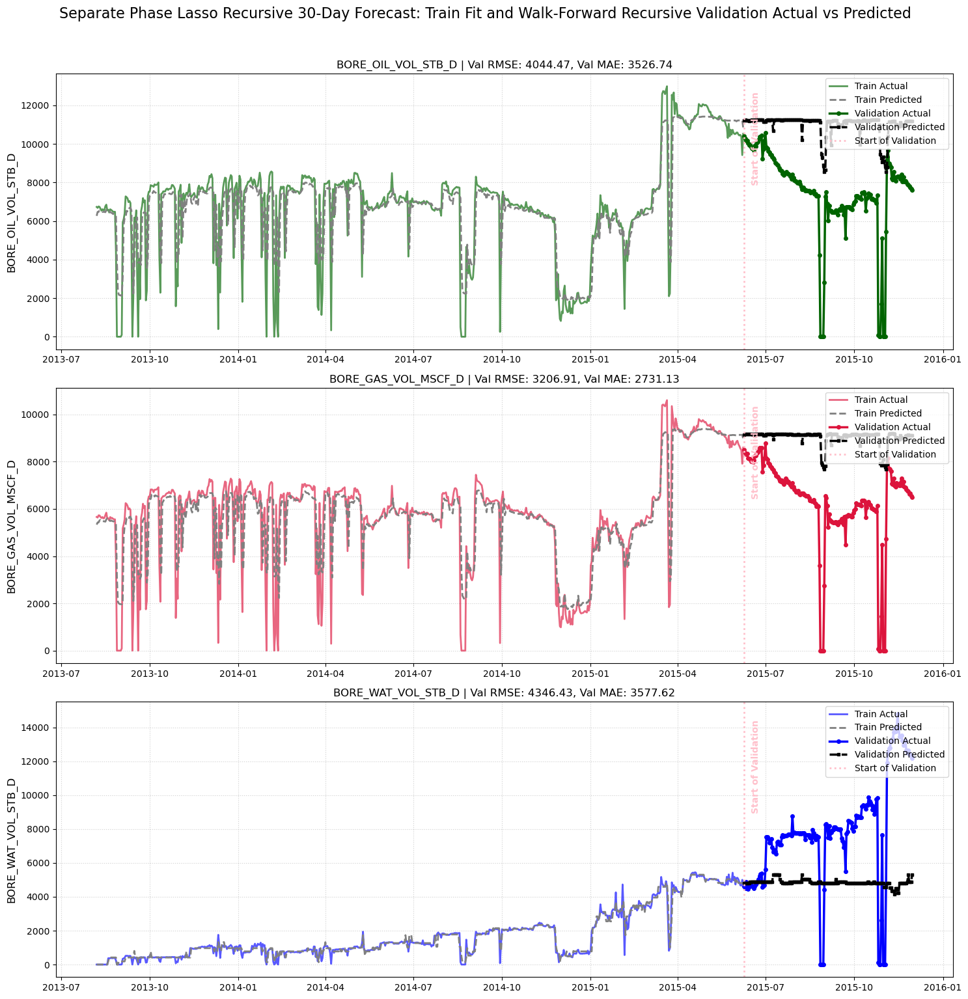

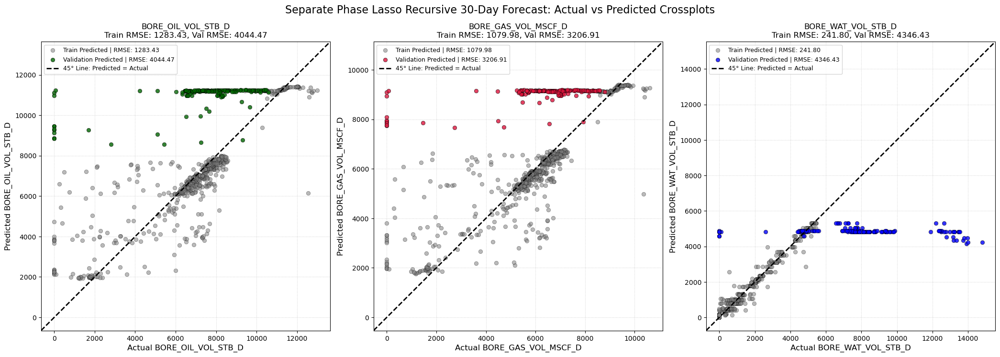

In [233]:
phase_X_train = {
    "BORE_OIL_VOL_STB_D": X_train_oil,
    "BORE_GAS_VOL_MSCF_D": X_train_gas,
    "BORE_WAT_VOL_STB_D": X_train_water,
} 

y_train = pd.concat(
    [
        y_train_oil.rename("BORE_OIL_VOL_STB_D"),
        y_train_gas.rename("BORE_GAS_VOL_MSCF_D"),
        y_train_water.rename("BORE_WAT_VOL_STB_D"),
    ],
    axis=1,
)

y_val = val_data[target_cols].copy()


train_pred_df, val_pred_df, recursive_metrics_df = (
    plot_separate_phase_train_walkforward_val_diagnostics(
        phase_models=phase_models,
        phase_X_train=phase_X_train,
        y_train=y_train,
        y_val=y_val,
        walk_forward_forecast_df=walk_forward_forecast_df,
        target_cols=target_cols,
        model_name="Separate Phase RF Recursive 30-Day Forecast",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
        make_combined_plots=True,
        walk_forward_metrics_df=walk_forward_metrics_df,
    )
)

## Gradient Boost

In [247]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

phase_models = {
    "BORE_OIL_VOL_STB_D": best_oil_gb_model,
    "BORE_GAS_VOL_MSCF_D": best_gas_gb_model,
    "BORE_WAT_VOL_STB_D": best_water_gb_model,
}

phase_feature_pipes = {
    "BORE_OIL_VOL_STB_D": oil_feature_pipe,
    "BORE_GAS_VOL_MSCF_D": gas_feature_pipe,
    "BORE_WAT_VOL_STB_D": water_feature_pipe,
}

phase_model_feature_cols = {
    "BORE_OIL_VOL_STB_D": X_train_oil.columns,
    "BORE_GAS_VOL_MSCF_D": X_train_gas.columns,
    "BORE_WAT_VOL_STB_D": X_train_water.columns,
}

(
    walk_forward_forecast_df,
    walk_forward_recursive_history_df,
    walk_forward_metrics_df,
    block_summary_df,
) = walk_forward_recursive_forecast_separate_phase_models_v2(
    phase_models=phase_models,
    phase_feature_pipes=phase_feature_pipes,
    phase_model_feature_cols=phase_model_feature_cols,
    train_data=train_data.copy(),
    val_data=val_data.copy(),
    target_cols=target_cols,
    forecast_horizon=30,
    clip_negative=True,
    update_history_with_actual_after_block=True,
    verbose=True,
)


Block 1: 2015-06-09 00:00:00 to 2015-07-08 00:00:00 (30 days)
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddS

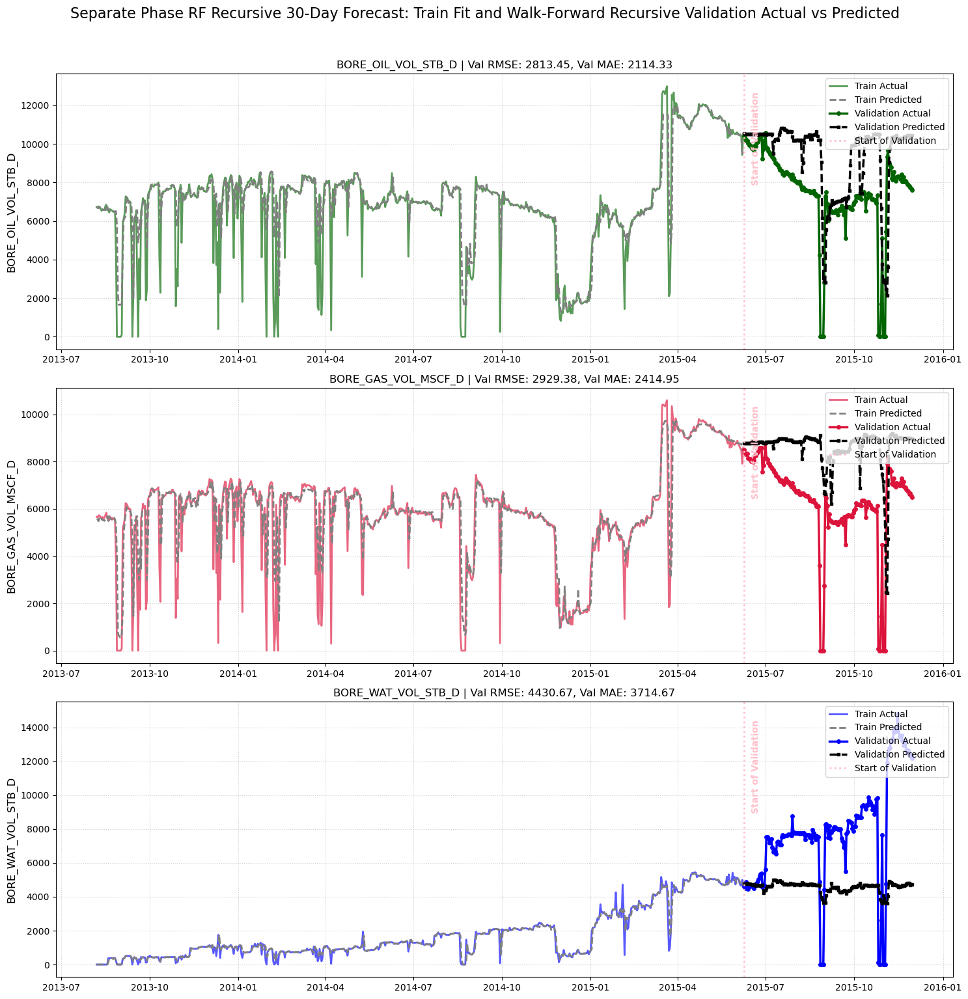

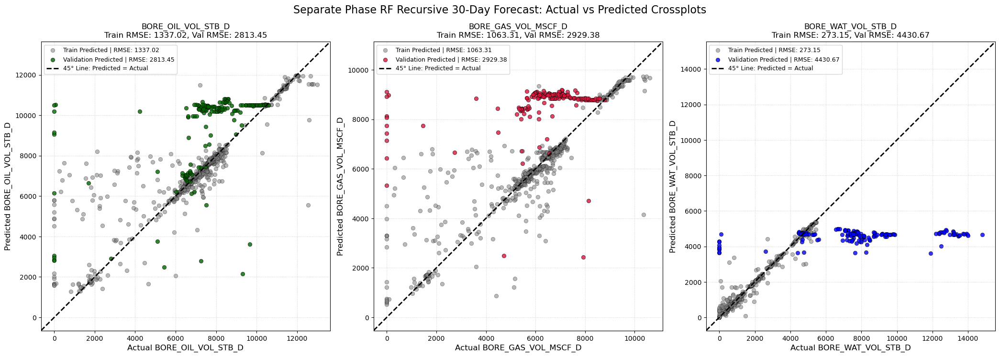

In [248]:
phase_X_train = {
    "BORE_OIL_VOL_STB_D": X_train_oil,
    "BORE_GAS_VOL_MSCF_D": X_train_gas,
    "BORE_WAT_VOL_STB_D": X_train_water,
} 

y_train = pd.concat(
    [
        y_train_oil.rename("BORE_OIL_VOL_STB_D"),
        y_train_gas.rename("BORE_GAS_VOL_MSCF_D"),
        y_train_water.rename("BORE_WAT_VOL_STB_D"),
    ],
    axis=1,
)

y_val = val_data[target_cols].copy()


train_pred_df, val_pred_df, recursive_metrics_df = (
    plot_separate_phase_train_walkforward_val_diagnostics(
        phase_models=phase_models,
        phase_X_train=phase_X_train,
        y_train=y_train,
        y_val=y_val,
        walk_forward_forecast_df=walk_forward_forecast_df,
        target_cols=target_cols,
        model_name="Separate Phase RF Recursive 30-Day Forecast",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
        make_combined_plots=True,
        walk_forward_metrics_df=walk_forward_metrics_df,
    )
)

## Light Gradient Boost

In [262]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

phase_models = {
    "BORE_OIL_VOL_STB_D": best_oil_lgbm_linear_model,
    "BORE_GAS_VOL_MSCF_D": best_gas_lgbm_linear_model,
    "BORE_WAT_VOL_STB_D": best_water_lgbm_linear_model,
}

phase_feature_pipes = {
    "BORE_OIL_VOL_STB_D": oil_feature_pipe,
    "BORE_GAS_VOL_MSCF_D": gas_feature_pipe,
    "BORE_WAT_VOL_STB_D": water_feature_pipe,
}

phase_model_feature_cols = {
    "BORE_OIL_VOL_STB_D": X_train_oil.columns,
    "BORE_GAS_VOL_MSCF_D": X_train_gas.columns,
    "BORE_WAT_VOL_STB_D": X_train_water.columns,
}

(
    walk_forward_forecast_df,
    walk_forward_recursive_history_df,
    walk_forward_metrics_df,
    block_summary_df,
) = walk_forward_recursive_forecast_separate_phase_models_v2(
    phase_models=phase_models,
    phase_feature_pipes=phase_feature_pipes,
    phase_model_feature_cols=phase_model_feature_cols,
    train_data=train_data.copy(),
    val_data=val_data.copy(),
    target_cols=target_cols,
    forecast_horizon=30,
    clip_negative=True,
    update_history_with_actual_after_block=True,
    verbose=True,
)


Block 1: 2015-06-09 00:00:00 to 2015-07-08 00:00:00 (30 days)
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']
Trend features added: ['time_since_D', 'time_since_D_power_2']
AddS

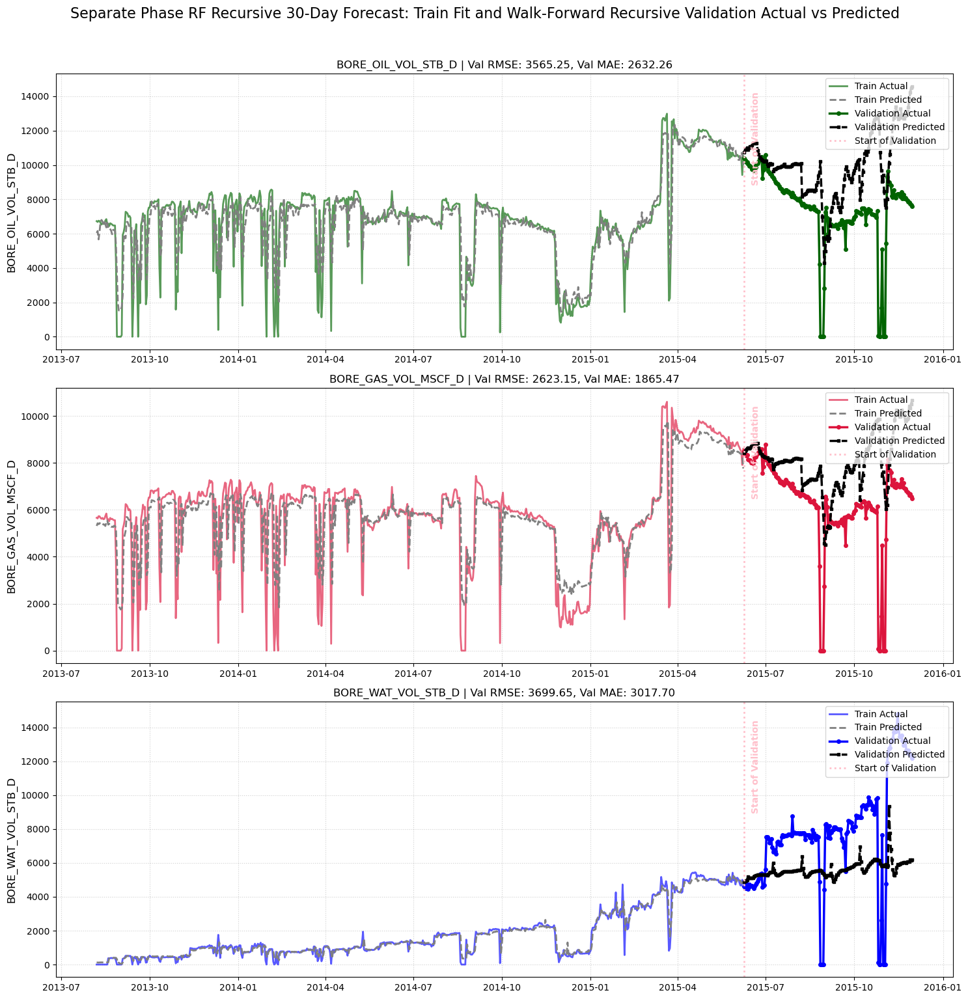

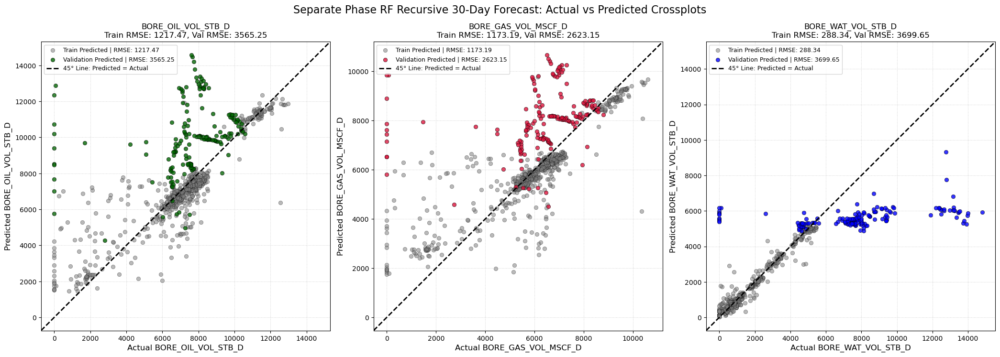

In [263]:
phase_X_train = {
    "BORE_OIL_VOL_STB_D": X_train_oil,
    "BORE_GAS_VOL_MSCF_D": X_train_gas,
    "BORE_WAT_VOL_STB_D": X_train_water,
} 

y_train = pd.concat(
    [
        y_train_oil.rename("BORE_OIL_VOL_STB_D"),
        y_train_gas.rename("BORE_GAS_VOL_MSCF_D"),
        y_train_water.rename("BORE_WAT_VOL_STB_D"),
    ],
    axis=1,
)

y_val = val_data[target_cols].copy()


train_pred_df, val_pred_df, recursive_metrics_df = (
    plot_separate_phase_train_walkforward_val_diagnostics(
        phase_models=phase_models,
        phase_X_train=phase_X_train,
        y_train=y_train,
        y_val=y_val,
        walk_forward_forecast_df=walk_forward_forecast_df,
        target_cols=target_cols,
        model_name="Separate Phase RF Recursive 30-Day Forecast",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
        make_combined_plots=True,
        walk_forward_metrics_df=walk_forward_metrics_df,
    )
)

In [122]:

def walk_forward_recursive_forecast_separate_phase_models_v2(
    phase_models,
    phase_feature_pipes,
    phase_model_feature_cols,
    train_data,
    val_data,
    target_cols,
    forecast_horizon=30,
    clip_negative=True,
    update_history_with_actual_after_block=True,
    verbose=True,
):
    """
    Recursive walk-forward forecast for separate oil/gas/water models.

    Key idea:
    - Oil, gas, and water have separate models.
    - But they share one recursive history dataframe.
    - At each forecast date, all three phases are predicted first.
    - Then all three predictions are written back into the common history.

    This avoids NaNs inside Feature-engine LagFeatures.
    """

    train_data = train_data.copy()
    val_data = val_data.copy()

    history_for_features = train_data.copy()

    forecast_records = []
    recursive_prediction_rows = []

    n_val = len(val_data)
    block_id = 0

    for block_start in range(0, n_val, forecast_horizon):
        block_id += 1

        block_end = min(block_start + forecast_horizon, n_val)
        val_block_actual = val_data.iloc[block_start:block_end].copy()
        block_index = val_block_actual.index

        # This history is updated with recursive predictions inside the block.
        recursive_block_history = history_for_features.copy()

        if verbose:
            print(
                f"\nBlock {block_id}: "
                f"{block_index.min()} to {block_index.max()} "
                f"({len(block_index)} days)"
            )

        for step_number, forecast_date in enumerate(block_index, start=1):

            # Take only the current validation row.
            # Do NOT append the entire 30-day future block.
            current_row = val_block_actual.loc[[forecast_date]].copy()

            # Hide the actual target values for this date.
            # Use last known values as temporary placeholders so GOR/WCUT and lag transformers do not break.
            for col in target_cols:
                last_known_value = recursive_block_history[col].dropna().iloc[-1]
                current_row.loc[forecast_date, col] = last_known_value

            # Candidate history includes train/history + previous recursive predictions + current placeholder row.
            candidate_history = pd.concat(
                [recursive_block_history, current_row],
                axis=0,
            )

            candidate_history = candidate_history[
                ~candidate_history.index.duplicated(keep="last")
            ]

            step_preds = {}

            # Predict all phases first.
            # Do not write oil prediction back before gas/water prediction for the same date.
            for target_col in target_cols:

                model = phase_models[target_col]
                feature_pipe = phase_feature_pipes[target_col]
                model_feature_cols = list(phase_model_feature_cols[target_col])

                feat_df = feature_pipe.transform(candidate_history)

                if forecast_date not in feat_df.index:
                    raise ValueError(
                        f"{forecast_date} was dropped by the feature pipeline for {target_col}. "
                        "This usually means the current row still has NaN/inf after feature engineering."
                    )

                X_step = feat_df.loc[[forecast_date]].drop(
                    columns=[target_col],
                    errors="ignore",
                )

                missing_cols = [
                    c for c in model_feature_cols
                    if c not in X_step.columns
                ]

                if missing_cols:
                    raise ValueError(
                        f"Missing columns for {target_col}: {missing_cols[:10]} "
                        f"... total missing = {len(missing_cols)}"
                    )

                X_step = X_step[model_feature_cols]

                pred = model.predict(X_step)
                pred = float(np.asarray(pred).reshape(-1)[0])

                if clip_negative:
                    pred = max(pred, 0.0)

                step_preds[target_col] = pred

            # Now write all three predictions back into the recursive history.
            predicted_row = val_block_actual.loc[[forecast_date]].copy()

            for target_col in target_cols:
                predicted_row.loc[forecast_date, target_col] = step_preds[target_col]

            recursive_block_history = pd.concat(
                [recursive_block_history, predicted_row],
                axis=0,
            )

            recursive_block_history = recursive_block_history[
                ~recursive_block_history.index.duplicated(keep="last")
            ]

            record = {
                "block_id": block_id,
                "step": step_number,
                "forecast_date": forecast_date,
            }

            for target_col in target_cols:
                record[f"{target_col}_actual"] = val_block_actual.loc[forecast_date, target_col]
                record[f"{target_col}_pred"] = step_preds[target_col]

            forecast_records.append(record)
            recursive_prediction_rows.append(predicted_row)

        # After each block, choose how to update history.
        if update_history_with_actual_after_block:
            # Monthly separator truth becomes available.
            history_for_features = pd.concat(
                [history_for_features, val_block_actual],
                axis=0,
            )
        else:
            # Fully recursive validation.
            history_for_features = recursive_block_history.copy()

        history_for_features = history_for_features[
            ~history_for_features.index.duplicated(keep="last")
        ]

    # Combined forecast dataframe
    walk_forward_forecast_df = pd.DataFrame(forecast_records)
    walk_forward_forecast_df = walk_forward_forecast_df.set_index("forecast_date")

    # Recursive history dataframe
    recursive_val_df = pd.concat(recursive_prediction_rows, axis=0)

    walk_forward_recursive_history_df = pd.concat(
        [train_data, recursive_val_df],
        axis=0,
    )

    walk_forward_recursive_history_df = walk_forward_recursive_history_df[
        ~walk_forward_recursive_history_df.index.duplicated(keep="last")
    ]

    # Overall metrics
    metrics = []

    for target_col in target_cols:
        y_true = walk_forward_forecast_df[f"{target_col}_actual"]
        y_pred = walk_forward_forecast_df[f"{target_col}_pred"]

        metrics.append(
            {
                "Phase": target_col,
                "Recursive_RMSE": root_mean_squared_error(y_true, y_pred),
                "Recursive_MAE": mean_absolute_error(y_true, y_pred),
                "Recursive_R2": r2_score(y_true, y_pred),
            }
        )

    walk_forward_metrics_df = pd.DataFrame(metrics)

    # Block-level metrics
    block_metrics = []

    for block_id_value, block_df in walk_forward_forecast_df.groupby("block_id"):
        for target_col in target_cols:
            y_true = block_df[f"{target_col}_actual"]
            y_pred = block_df[f"{target_col}_pred"]

            block_metrics.append(
                {
                    "block_id": block_id_value,
                    "Phase": target_col,
                    "start_date": block_df.index.min(),
                    "end_date": block_df.index.max(),
                    "n_days": len(block_df),
                    "Block_RMSE": root_mean_squared_error(y_true, y_pred),
                    "Block_MAE": mean_absolute_error(y_true, y_pred),
                    "Block_R2": r2_score(y_true, y_pred) if len(block_df) > 1 else np.nan,
                }
            )

    block_summary_df = pd.DataFrame(block_metrics)

    return (
        walk_forward_forecast_df,
        walk_forward_recursive_history_df,
        walk_forward_metrics_df,
        block_summary_df,
    )

In [221]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import (
    root_mean_squared_error,
    mean_absolute_error,
    r2_score,
)


def plot_separate_phase_train_walkforward_val_diagnostics(
    phase_models,
    phase_X_train,
    y_train,
    y_val,
    walk_forward_forecast_df,
    target_cols=None,
    model_name="Separate Phase Model",
    start_of_val_date=None,
    clip_negative=True,
    make_combined_plots=True,
    walk_forward_metrics_df=None,
    actual_suffix="_actual",
    pred_suffix="_pred",
):
    """
    Creates train / walk-forward-validation time plots and actual-vs-predicted
    crossplots for separately trained oil, gas, and water models.

    This version is for recursive / walk-forward validation when each phase has
    its own model.

    Train prediction:
        phase_models[phase].predict(phase_X_train[phase])

    Validation prediction:
        already supplied from walk_forward_forecast_df

    Works with:
    - Separate Lasso models
    - Separate Ridge models
    - Separate Random Forest models
    - Separate LightGBM models
    - Any setup where oil/gas/water are modeled independently

    Requires existing helper functions:
    - plot_train_val_predictions_time
    - plot_train_val_actual_vs_predicted_crossplot

    Parameters
    ----------
    phase_models : dict
        Example:
        {
            "BORE_OIL_VOL_STB_D": best_lasso_model_oil,
            "BORE_GAS_VOL_MSCF_D": best_lasso_model_gas,
            "BORE_WAT_VOL_STB_D": best_lasso_model_water,
        }

    phase_X_train : dict
        Example:
        {
            "BORE_OIL_VOL_STB_D": X_train_oil,
            "BORE_GAS_VOL_MSCF_D": X_train_gas,
            "BORE_WAT_VOL_STB_D": X_train_water,
        }

    y_train : DataFrame
        Training actuals with target columns.

    y_val : DataFrame
        Validation actuals with target columns.

    walk_forward_forecast_df : DataFrame
        Recursive forecast dataframe from
        walk_forward_recursive_forecast_separate_phase_models_v2.

        Expected columns:
            BORE_OIL_VOL_STB_D_actual
            BORE_OIL_VOL_STB_D_pred
            BORE_GAS_VOL_MSCF_D_actual
            BORE_GAS_VOL_MSCF_D_pred
            BORE_WAT_VOL_STB_D_actual
            BORE_WAT_VOL_STB_D_pred

    Returns
    -------
    train_pred_df : DataFrame
        Train predictions in original target units.

    val_pred_df : DataFrame
        Walk-forward validation predictions in original target units.

    metrics_df : DataFrame
        Train metrics plus walk-forward validation metrics for each phase.
    """

    if target_cols is None:
        target_cols = list(phase_models.keys())

    # -----------------------------
    # 1. Predict train separately
    # -----------------------------
    train_pred_dict = {}

    for phase in target_cols:
        model = phase_models[phase]
        X_phase_train = phase_X_train[phase]

        phase_train_pred = model.predict(X_phase_train)
        phase_train_pred = np.asarray(phase_train_pred).reshape(-1)

        train_pred_dict[phase] = pd.Series(
            phase_train_pred,
            index=X_phase_train.index,
            name=phase,
        )

    train_pred_df = pd.concat(train_pred_dict.values(), axis=1)
    train_pred_df = train_pred_df[target_cols]

    # -----------------------------
    # 2. Align training actuals
    # -----------------------------
    common_train_index = y_train.index.intersection(train_pred_df.index)

    y_train_aligned = y_train.loc[common_train_index, target_cols].copy()
    train_pred_df = train_pred_df.loc[common_train_index, target_cols].copy()

    # -----------------------------
    # 3. Extract validation predictions
    # -----------------------------
    val_pred_df = pd.DataFrame(index=walk_forward_forecast_df.index)

    for phase in target_cols:
        pred_col = f"{phase}{pred_suffix}"

        if pred_col not in walk_forward_forecast_df.columns:
            raise ValueError(
                f"Expected prediction column '{pred_col}' was not found in "
                "walk_forward_forecast_df."
            )

        val_pred_df[phase] = walk_forward_forecast_df[pred_col]

    # -----------------------------
    # 4. Align validation actuals
    # -----------------------------
    common_val_index = y_val.index.intersection(val_pred_df.index)

    y_val_aligned = y_val.loc[common_val_index, target_cols].copy()
    val_pred_df = val_pred_df.loc[common_val_index, target_cols].copy()

    if clip_negative:
        train_pred_df = train_pred_df.clip(lower=0)
        val_pred_df = val_pred_df.clip(lower=0)

    # -----------------------------
    # 5. Calculate metrics
    # -----------------------------
    metrics = []

    for phase in target_cols:
        train_rmse = root_mean_squared_error(
            y_train_aligned[phase],
            train_pred_df[phase],
        )
        train_mae = mean_absolute_error(
            y_train_aligned[phase],
            train_pred_df[phase],
        )
        train_r2 = r2_score(
            y_train_aligned[phase],
            train_pred_df[phase],
        )

        if walk_forward_metrics_df is not None:
            metric_row = walk_forward_metrics_df[
                walk_forward_metrics_df["Phase"] == phase
            ]

            if len(metric_row) == 0:
                raise ValueError(
                    f"Phase '{phase}' not found in walk_forward_metrics_df."
                )

            metric_row = metric_row.iloc[0]

            # Flexible column-name handling
            if "WalkForward_Val_RMSE" in metric_row.index:
                val_rmse = metric_row["WalkForward_Val_RMSE"]
                val_mae = metric_row["WalkForward_Val_MAE"]
                val_r2 = metric_row["WalkForward_Val_R2"]

            elif "Recursive_RMSE" in metric_row.index:
                val_rmse = metric_row["Recursive_RMSE"]
                val_mae = metric_row["Recursive_MAE"]
                val_r2 = metric_row["Recursive_R2"]

            else:
                raise ValueError(
                    "walk_forward_metrics_df must contain either "
                    "WalkForward_Val_RMSE / WalkForward_Val_MAE / WalkForward_Val_R2 "
                    "or Recursive_RMSE / Recursive_MAE / Recursive_R2."
                )

        else:
            val_rmse = root_mean_squared_error(
                y_val_aligned[phase],
                val_pred_df[phase],
            )
            val_mae = mean_absolute_error(
                y_val_aligned[phase],
                val_pred_df[phase],
            )
            val_r2 = r2_score(
                y_val_aligned[phase],
                val_pred_df[phase],
            )

        metrics.append(
            {
                "Model": model_name,
                "Phase": phase,
                "Train_RMSE": train_rmse,
                "Train_MAE": train_mae,
                "Train_R2": train_r2,
                "WalkForward_Val_RMSE": val_rmse,
                "WalkForward_Val_MAE": val_mae,
                "WalkForward_Val_R2": val_r2,
                # Aliases for your old plotting/table code
                "Val_RMSE": val_rmse,
                "Val_MAE": val_mae,
                "Val_R2": val_r2,
            }
        )

    metrics_df = pd.DataFrame(metrics)

    # -----------------------------
    # 6. Plot time plots
    # -----------------------------
    if make_combined_plots:
        fig, axes = plt.subplots(
            nrows=len(target_cols),
            ncols=1,
            figsize=(15, 5 * len(target_cols)),
            sharex=False,
        )

        if len(target_cols) == 1:
            axes = [axes]

        for ax, phase in zip(axes, target_cols):
            row = metrics_df[metrics_df["Phase"] == phase].iloc[0]

            plot_train_val_predictions_time(
                y_train=y_train_aligned[phase],
                train_pred=train_pred_df[phase],
                y_val=y_val_aligned[phase],
                val_pred=val_pred_df[phase],
                phase_string=phase,
                train_rmse=row["Train_RMSE"],
                train_mae=row["Train_MAE"],
                val_rmse=row["WalkForward_Val_RMSE"],
                val_mae=row["WalkForward_Val_MAE"],
                ax=ax,
                start_of_val_date=start_of_val_date,
                clip_negative=False,
            )

        fig.suptitle(
            f"{model_name}: Train Fit and Walk-Forward Recursive Validation Actual vs Predicted",
            fontsize=16,
            y=1.02,
        )

        plt.tight_layout()
        plt.show()

        # -----------------------------
        # 7. Plot crossplots
        # -----------------------------
        fig, axes = plt.subplots(
            nrows=1,
            ncols=len(target_cols),
            figsize=(7 * len(target_cols), 7),
            sharex=False,
            sharey=False,
        )

        if len(target_cols) == 1:
            axes = [axes]

        crossplot_dfs = {}

        for ax, phase in zip(axes, target_cols):
            row = metrics_df[metrics_df["Phase"] == phase].iloc[0]

            crossplot_df, ax = plot_train_val_actual_vs_predicted_crossplot(
                y_train=y_train_aligned[phase],
                train_pred=train_pred_df[phase],
                y_val=y_val_aligned[phase],
                val_pred=val_pred_df[phase],
                phase_string=phase,
                train_rmse=row["Train_RMSE"],
                train_mae=row["Train_MAE"],
                val_rmse=row["WalkForward_Val_RMSE"],
                val_mae=row["WalkForward_Val_MAE"],
                ax=ax,
                clip_negative=False,
            )

            crossplot_dfs[phase] = crossplot_df

        fig.suptitle(
            f"{model_name}: Actual vs Predicted Crossplots",
            fontsize=16,
            y=1.02,
        )

        plt.tight_layout()
        plt.show()

    return train_pred_df, val_pred_df, metrics_df

# FINAL DATAFRAME RESULT

In [139]:
model_results_df = create_model_results_table()

In [140]:
model_results_df = add_model_result(
    results_df=model_results_df,
    model_name="Lasso",

    oil_mae=val_mae_lasso_oil,
    oil_rmse=val_rmse_lasso_oil,
    oil_r2=val_r2_lasso_oil,
    oil_features=Lasso_oil_selected_features["Feature"],

    gas_mae=val_mae_lasso_gas,
    gas_rmse=val_rmse_lasso_gas,
    gas_r2=val_r2_lasso_gas,
    gas_features=Lasso_gas_selected_features["Feature"],

    water_mae=val_mae_lasso_water,
    water_rmse=val_rmse_lasso_water,
    water_r2=val_r2_lasso_water,
    water_features=Lasso_water_selected_features["Feature"],
)

In [141]:
style_model_results_table(model_results_df)

In [ ]:

# train another model when you use all lagged variables